# Forecasting organic growth

## Imports

In [1]:
import sys
import pandas as pd
import datetime as dt
import numpy as np
import time

from pytrends.request import TrendReq as UTrendReq
import requests

import matplotlib.pyplot as plt
import seaborn as sns; sns.set(); sns.set_style('whitegrid')

from prophet import Prophet
from sklearn.inspection import permutation_importance
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor

from tqdm.notebook import tqdm
from IPython.display import display, HTML

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

## HMSM

### Preprocessing 

In [30]:
country = "FR"
brands_name = {"BELGIUM": ["APERICUBE", "BABYBEL", "BOURSIN", "KIRI", "MINI BABYBEL", "VACHE QUI RIT", "MAREDSOUS"],
     "USA": ["BABYBEL", "THE LAUGHING COW", "BOURSIN", "KAUKAUNA", "MERKTS", "PRICES", "NURISHH"],
     "FR": ['APERICUBE', 'BABYBEL', 'BOURSIN', 'COUSTERON', 'KIRI', 'LA VACHE QUI RIT', 'PORT SALUT', 'NURISHH']}
aandp_brands_name = {"BELGIUM": ["APERICUBE", "BABYBEL", "BOURSIN", "KIRI", "MINI BABYBEL", "VACHE QUI RIT", "MAREDSOUS"],
    "USA": ["000BQ - BOURSIN", "000LA - THE LAUGHING COW", "000MB - MINI BABYBEL", "000KC - KAUKAUNA", "000PG - PRICE'S", "000MI - MERKTS", "003NH - NURISHH"]}
features = ["Date", "Brand", "Category", "Distribution", "Price per volume", "Sales in volume"]

In [3]:
df_hmsm = pd.read_excel('data/FR/FR_Concepts HMSM_df_0503.xlsx')

In [112]:
df_bel_hmsm = pd.read_excel('data/FR/FR_Concepts HMSM_df_bel_0503.xlsx')

In [5]:
df_hmsm.describe()
df_bel_hmsm.describe()

,Sales in value,Sales value with promo,Sales in volume,Sales volume with promo,Price with promo,Price without promo,Price per volume,Distribution
count,1.035220e+05,5.333700e+04,103522.000000,53337.000000,53337.000000,103363.000000,103522.000000,103522.000000
mean,1.357638e+05,3.552298e+04,13960.131621,3930.243085,12.991864,14.847507,14.791994,94.206639
std,3.198689e+05,1.118105e+05,38085.775754,12768.690361,5.934528,7.102215,7.109582,143.704228
min,8.000000e-02,3.554604e-01,0.024000,0.019748,3.013426,0.160000,0.160000,0.000162
25%,3.532826e+03,3.495800e+02,215.250000,26.460000,8.989899,10.116940,10.043380,8.601457
50%,2.188664e+04,2.668080e+03,1641.757493,216.250000,11.718347,13.571411,13.508048,37.251730
75%,1.064564e+05,1.796301e+04,8982.801988,1642.810000,15.394737,17.724709,17.665993,112.071751
max,6.444782e+06,4.426299e+06,575317.444129,339885.326204,92.978261,96.363018,96.363018,1479.478745


,Price per volume,Sales in volume,Sales in value,Distribution,Sell-in,Advertising,Promotion,A&P,MVC,Rate of Innovation
count,1131.000000,1.131000e+03,1.131000e+03,1131.000000,9.750000e+02,975.000000,975.000000,975.000000,9.750000e+02,1092.000000
mean,11.316930,2.059375e+05,2.061319e+06,223.351857,9.098731e+05,209.521597,91.544287,70297.651774,4.101325e+05,0.143722
std,3.109416,2.011638e+05,1.821819e+06,259.278678,6.536827e+05,268.472381,81.765397,77771.426421,3.553626e+05,0.260010
min,7.455859,3.120000e+00,6.182000e+01,0.069546,9.963594e+03,0.000000,0.180730,592.984000,-7.280536e+04,0.000000
25%,8.415657,4.616194e+04,3.798643e+05,105.098941,1.879785e+05,4.878175,9.136430,2822.933750,1.569135e+04,0.000000
50%,10.532511,1.834401e+05,2.337994e+06,146.837231,1.036629e+06,90.590150,88.104220,47283.246000,4.781768e+05,0.000000
75%,13.747022,2.658159e+05,3.167691e+06,171.314276,1.346108e+06,309.985765,137.223790,107034.990000,6.495228e+05,0.132775
max,21.725000,1.062687e+06,1.400707e+07,1122.361977,3.595951e+06,1211.803060,365.292730,350675.730000,1.971895e+06,0.937351


Dictionary of brand's markets.

In [25]:
brands_markets = {brand: df_hmsm[df_hmsm.Brand == brand].Category.unique().tolist() for brand in brands_name[country]}
bel_markets = list(set([elem for brand in brands_markets for elem in brands_markets[brand]]))
brands_markets
bel_markets

{'APERICUBE': ['APERITIF'],
 'BABYBEL': ['SPECIALITE A GOUT DOUX'],
 'BOURSIN': ['APERITIF',
  'ARO',
  'NATURE',
  'SALADE',
  'PLAT CHAUD',
  'INGREDIENT A CHAUD'],
 'COUSTERON': ['SPECIALITE A GOUT DOUX'],
 'KIRI': ['A TARTINER', 'NOMADE'],
 'LA VACHE QUI RIT': ['A TARTINER', 'NOMADE', 'INGREDIENT A CHAUD'],
 'PORT SALUT': ['A GOUT', 'SPECIALITE A GOUT DOUX'],
 'NURISHH': ['ALTERNATIVE VEGETALE']}

['SPECIALITE A GOUT DOUX',
 'NATURE',
 'ARO',
 'A TARTINER',
 'A GOUT',
 'ALTERNATIVE VEGETALE',
 'INGREDIENT A CHAUD',
 'SALADE',
 'PLAT CHAUD',
 'NOMADE',
 'APERITIF']

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
      dtype=object)

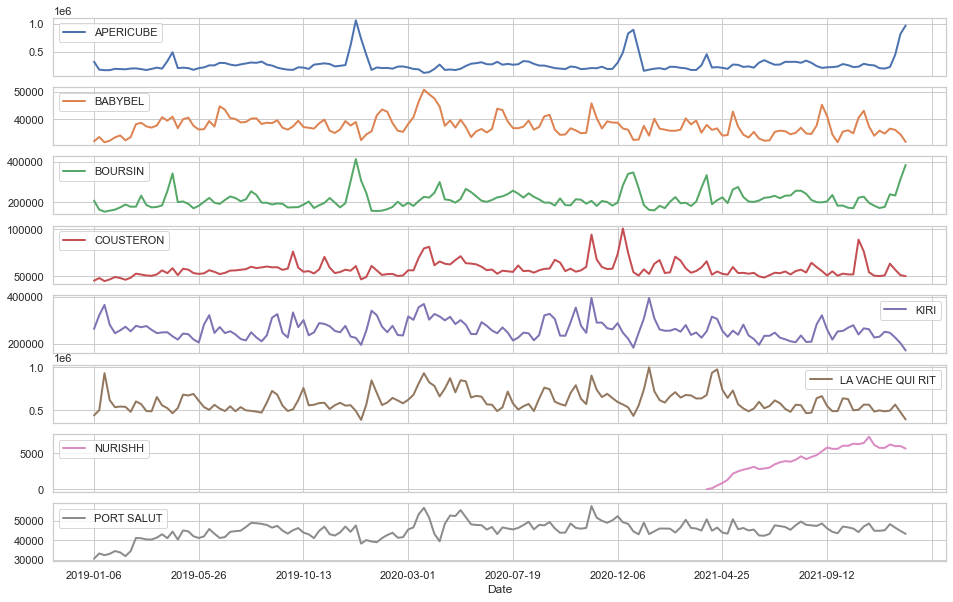

In [26]:
df_bel_hmsm.reset_index().groupby(['Date', 'Brand']).agg('sum').unstack()['Sales in volume'].plot(subplots=True, linewidth=2, figsize=(16, 10))

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
      dtype=object)

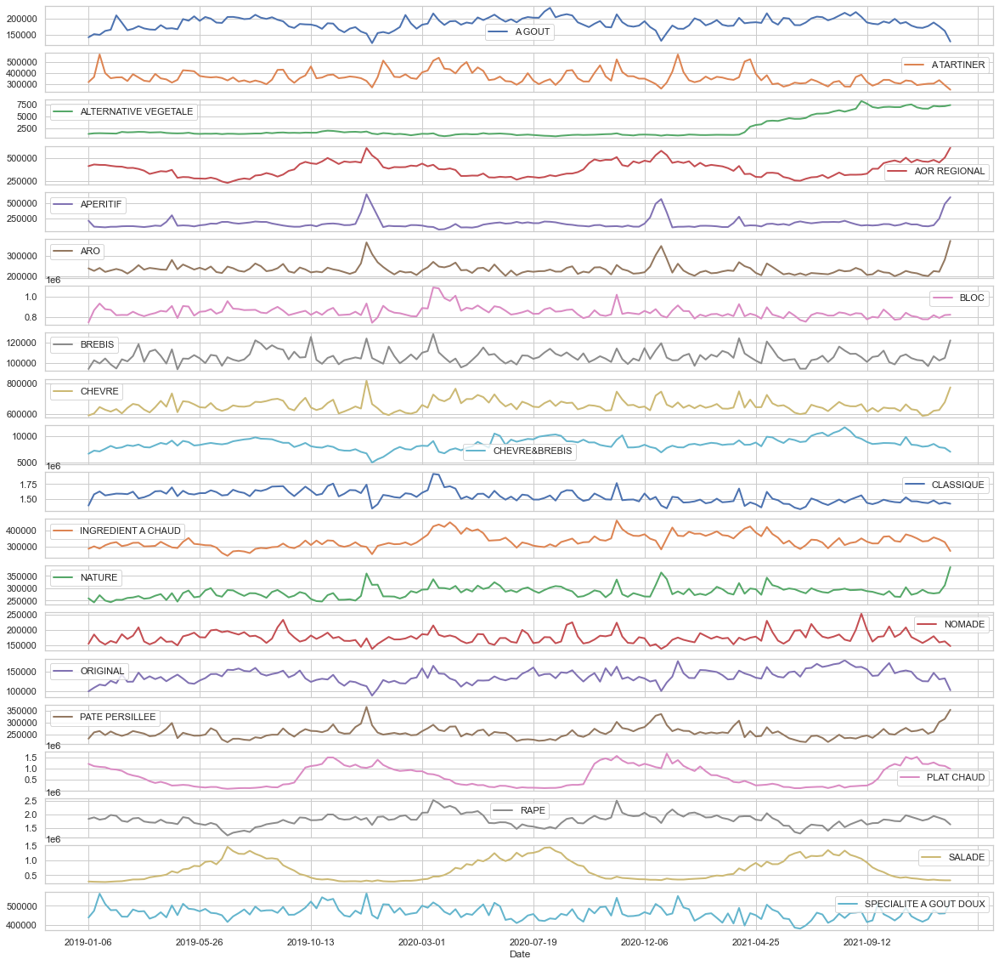

In [27]:
df_hmsm.reset_index().groupby(['Date', 'Category']).agg('sum').unstack()['Sales in volume'].plot(subplots=True, linewidth=2, figsize=(20, 20))

In [6]:
def get_df_brands(data_manager, country, brands_name, features):
    """Get the right DataFrame giving the country, the brands and features 
    from the datamanager
    """
    df_res = df[df.Brand.isin(
        brands_name[country])][features]
    df_res = df_res.dropna()

    return df_res

def get_df_competition_brands(df, brands_name, features):
    """Get the dataframe of all the other brands except the given ones with 
    the specified features
    """
    df_res = df[~(df.Brand.isin(
        brands_name)) & (df.Category.isin(
        bel_markets))][features]
    df_res = df_res.dropna()
    
    return df_res

def get_df_markets(df):
    """Get Markets dataframe
    """
    df_res = df.groupby(['Category', 'Date']).agg("sum")[
        ['Sales in volume']].unstack(0)
    df_res = df_res.droplevel(level=0, axis=1).reset_index()
    df_res['TOTAL CHEESE'] = df_res.iloc[:, 1:].sum(axis=1)
    df_res = df_res.dropna()
    df_res.columns.name = ''

    return df_res


def forecasting_features(df, features, periods=36, freq='MS'):
    """Get long term forecasts for features giving the dataframe and periods
    """
    # Select features except the target
    list_df_features = []
    for feature in tqdm(features, ascii=True, desc='Features'):
        model = Prophet()
        # Preprocessing Inputs of Prophet
        df_frcast = df[['Date', feature]]
        df_frcast.columns = ['ds', 'y']
        df_frcast.ds = pd.to_datetime(df_frcast.ds)
        df_frcast['cap'] = df[feature].max() * 3
        df_frcast['floor'] = df[feature].mean() / 2
        
        if (df_frcast['cap'] <= df_frcast['floor']).any():
            df_frcast['cap'] = df_frcast.floor + 1
        
        # Model
        model = Prophet(growth='logistic', yearly_seasonality=20)
        model.fit(df_frcast)

        # Periods is in months
        future = model.make_future_dataframe(periods=periods, freq=freq)
        future['cap'] = df_frcast['cap'][0]
        future['floor'] = df_frcast['floor'][0]
        fcst = model.predict(future[future.ds > df_frcast.ds.iloc[-1]])
        
        # Plot forecast
        fig = model.plot(fcst)
        ax = fig.gca()
        ax.set_title(feature)
        
        df_frcast.rename(columns={'y': feature}, inplace=True)
        fcst.rename(columns={'yhat': feature}, inplace=True)
        # Adding result to list
        list_df_features.append(pd.concat([df_frcast.iloc[:, :-2], fcst[['ds', feature]]]))

    # Merging the dataframes of each feature
    df_features = list_df_features[0][['ds']]
    for dff in list_df_features:
        df_features = pd.merge(df_features, dff, on='ds')

    df_features.rename(columns={'ds': 'Date'}, inplace=True)
    return df_features

def forecasting_features_brand(df, features, periods=36, freq='MS'):
    """Get long term forecasts for features giving the dataframe and periods
    """
    # Select features except the target
    list_df_features = []
    for feature in tqdm(features, ascii=True, desc='Features'):
        model = Prophet()
        # Preprocessing Inputs of Prophet
        df_frcast = df[['Date', feature]]
        df_frcast.columns = ['ds', 'y']
        df_frcast.ds = pd.to_datetime(df_frcast.ds)
        
        # Model
        model = Prophet()
        model.fit(df_frcast)

        # Periods is in months
        future = model.make_future_dataframe(periods=periods, freq=freq)
        fcst = model.predict(future[future.ds > df_frcast.ds.iloc[-1]])
        
        # Plot forecast
        fig = model.plot(fcst)
        ax = fig.gca()
        ax.set_title(feature)
        
        df_frcast.rename(columns={'y': feature}, inplace=True)
        fcst.rename(columns={'yhat': feature}, inplace=True)
        # Adding result to list
        list_df_features.append(pd.concat([df_frcast, fcst[['ds', feature]]]))

    # Merging the dataframes of each feature
    df_features = list_df_features[0][['ds']]
    for dff in list_df_features:
        df_features = pd.merge(df_features, dff, on='ds')

    df_features.rename(columns={'ds': 'Date'}, inplace=True)
    return df_features


def forecasting_one_brand(df, brand_name, features_name, periods=36, freq='MS'):
    """ Forecasting giving brand_name for giving number of periods and 
    features to use. 
    """
    # Get DataFrame for brand_name
    df = df.groupby(["Brand", "Date"]).agg(
        "sum").loc[brand_name].reset_index().sort_values('Date')
    
    # Predict long-term forecast for features
    df_features = forecasting_features_brand(df, features_name, periods=periods, freq=freq)
    # Preprocessing dataframe for prophet
    df['Date'] = pd.to_datetime(df.Date)
    #df = pd.merge(df_features_train, df[['Date', 'Sales in volume']], on='Date', how='inner')
    df = df[['Date', *features_name, 'Sales in volume']]
    df.rename(columns={'Date': 'ds', 'Sales in volume': 'y'}, inplace=True)
    
    df['cap'] = df['y'].max() * 3
    df['floor'] = df['y'].min() / 2
    if (df['cap'] <= df['floor']).any():
        df['cap'] = df.floor + 1

    
    # Instanciating Prophet Model
    model = Prophet(growth='logistic', yearly_seasonality=20)
    # Adding regressors
    for feature in features_name:
        model.add_regressor(feature)

    # Fitting model
    model.fit(df)
    
    future = model.make_future_dataframe(periods=periods, freq=freq)

    for feature in features_name:
        future[feature] = df_features[feature]
    

    future['cap'] = df['cap'][0]
    future['floor'] = df['floor'][0]
    
    # Predicting sales forecasts
    fcst = model.predict(future[future.ds > df.ds.iloc[-1]])
    
    # Plot forecast
    fig = model.plot(fcst)
    ax = fig.gca()
    ax.set_title(brand_name)
    
    fcst.rename(columns={'yhat':'y'}, inplace=True)
    df_brand_fcst = pd.concat([df[['ds', 'y']], fcst[['ds', 'y']]])
    df_brand_fcst.rename(columns={'ds': 'Date', 'y': brand_name}, inplace=True)

    return future, df_brand_fcst


def forecasting_brands(df, brands_name, features_name, periods=36, freq='MS'):
    """Forecasting a list of brands using the given features and periods
    """
    
    dict_feats_futures = {}
    list_df_brands = []
    # Compute forecast for each brand
    for brand in tqdm(brands_name, ascii=True, desc='Brands'):
        future, brand_fcst = forecasting_one_brand(df, brand, features_name, periods=periods, freq=freq)
        dict_feats_futures[brand] = future
        list_df_brands.append(brand_fcst)

    # Merge results of each brand
    df_brands_fcst = list_df_brands[0].Date
    for df_tmp in list_df_brands:
        df_brands_fcst = pd.merge(df_brands_fcst, df_tmp, on='Date', how='outer')

    return dict_feats_futures, df_brands_fcst


def forecasting_markets(df, markets_name, periods=36, freq='MS'):
    """Forecasting list of markets for the given periods
    """
    df_features = forecasting_features(df, markets_name, periods=periods, freq=freq)

    return df_features

def mitigate_covid(df, features, dates):
    """
    """
    pass
    
# Get adjusted features for organic growth
def adjust_organic_growth_features(df_features):
    """Adjust organic growth features for computing correlation of growth
    Drivers in the future (forecast)
    """
    df_organicforecast_feature = df_features.copy()
    feature_columns = list(df_organicforecast_feature)[1:]
    controlable_features = feature_columns[:4]
    df_organic_forecast_feature["Distribution"] = 0
    df_organic_forecast_feature["Rate of innovation"] = 0
    price_75percentile = df_organic_forecast_feature["Price per volume"].quantile(
        0.75)
    df_organic_forecast_feature["Price per volume"] = df_organic_forecast_feature["Price per volume"].apply(
        lambda x: x*1.25 if x <= price_75percentile else x)
    TDP_75percentile = df_organic_forecast_feature["TDP"].quantile(0.75)
    df_organic_forecast_feature["TDP"] = df_organic_forecast_feature["TDP"].apply(
        lambda x: x*0.75 if x >= TDP_75percentile else x)
    
    return df_organic_forecast_feature

### Computing Trends

In [7]:
kw_list = brands_name[country]
timeframes = list(df_bel_hmsm.Date.unique())
tdelta = dt.timedelta(weeks=1)
timeframes.insert(0, (dt.datetime.strptime(timeframes[0], '%Y-%m-%d') - tdelta).strftime('%Y-%m-%d'))
    
geo='US'
GET_METHOD='get'
headers = {
'authority': 'trends.google.com',
'cache-control': 'max-age=0',
'sec-ch-ua': '" Not A;Brand";v="99", "Chromium";v="98", "Google Chrome";v="98"',
'sec-ch-ua-mobile': '?0',
'sec-ch-ua-platform': '"macOS"',
'upgrade-insecure-requests': '1',
'user-agent': 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/98.0.4758.102 Safari/537.36',
'accept': 'text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9',
'x-client-data': 'CJ7fygE=',
'sec-fetch-site': 'same-origin',
'sec-fetch-mode': 'navigate',
'sec-fetch-user': '?1',
'sec-fetch-dest': 'document',
'referer': 'https://trends.google.com/trends/?geo='+geo,
'accept-language': 'fr-FR,fr;q=0.9,en-US;q=0.8,en;q=0.7',
'cookie': '__utma=10102256.2142090120.1645455402.1645455402.1645455402.1; __utmc=10102256; __utmz=10102256.1645455402.1.1.utmcsr=(direct)|utmccn=(direct)|utmcmd=(none); __utmt=1; __utmb=10102256.5.9.1645455408893; CONSENT=YES+srp.gws-20220217-0-RC1.fr+FX+004; 1P_JAR=2022-02-21-15; SID=HQgzK1_QHq5O4Gxfol7wNIQ8JBvuh_XBbe-63vwnERFhFJEa8TFYSMqHR-5OUrj7OtQx_A.; __Secure-1PSID=HQgzK1_QHq5O4Gxfol7wNIQ8JBvuh_XBbe-63vwnERFhFJEawJmkuoBDtYla3S3m5hx8kQ.; __Secure-3PSID=HQgzK1_QHq5O4Gxfol7wNIQ8JBvuh_XBbe-63vwnERFhFJEaG7QfexXpqx5lg43EMUQUQw.; HSID=A_K65lvXgt3Scuc0n; SSID=Ajaw0EKPT7Ok638qm; APISID=1gdUaeoAbGY0hQBG/A68-B5BtWRxthyMoo; SAPISID=35kLI8C4oe7oZA-1/Ao42EJJT31v8K2hBe; __Secure-1PAPISID=35kLI8C4oe7oZA-1/Ao42EJJT31v8K2hBe; __Secure-3PAPISID=35kLI8C4oe7oZA-1/Ao42EJJT31v8K2hBe; NID=511=odIcinna2wJGUmMhN_uM0o_utTxPmkP7IP3WPOfwUDcgDxNaSaK0g-JdjZ15JWlWHpgSqsD2-DFJcy4-F8KfN5oGoz3dsqRKBpr0cgLmyefwq5Dsd2fLlSUh9HJhga7TaUfRKSdu09XitvJ8nCdnGN4iDLenCzdI5qEfyHyB3wJAZyONpYd-P1JtXD56OKnm-wJ5JoJObdm67M_myZj4PiOjMvOeVvnAMVHnZee48Ho; SIDCC=AJi4QfF7GP5rUgjZhMuSVECtziYI-TgFSUpdgGLTnDwYSuP22BrKzLUpdkcYO4aLQjG4jg09; __Secure-3PSIDCC=AJi4QfGKL18okfSNCPOhtb0IHAOOHOOROq_xm0P_hN0fwHW0il9jxtNj4ChDoxtjdexO_l6d',
}

class TrendReq(UTrendReq):
    def _get_data(self, url, method=GET_METHOD, trim_chars=0, **kwargs):
        return super()._get_data(url, method=GET_METHOD, trim_chars=trim_chars, headers=headers, **kwargs)

def compute_trends(geo, kw_list, timeframes):
    """
    """
    pytrend = TrendReq(hl=geo, tz=360)
    dataset = []
    for i in tqdm(range(1, len(timeframes)), desc='TimeFrames', ascii=True):
        # Merge kw queries results, only 5 max can be queried in an iteration
        tmp_data_raw = [timeframes[i]]
        for j in range(0, len(kw_list), 5):
            # 5: because only 5 keywords can be computed at the same time
            pytrend.build_payload(
                kw_list=kw_list[j:j+5],
                timeframe='{} {}'.format(timeframes[i-1], timeframes[i]), 
                geo=geo,
                gprop='')
            data = pytrend.interest_over_time().sum(axis=0)
            # [:-1] in order to not take into account the isPartial column 
            tmp_data_raw += list(data.values)[:-1]
        dataset.append(tmp_data_raw)

    df_trends = pd.DataFrame(dataset, columns=['Date'] + kw_list)
    return df_trends

def compute_trends_bis(geo, kw_list, start_date, end_date):
    """
    """
    pytrend = TrendReq(hl=geo, tz=360)
    dataset = pd.DataFrame()
    for i in range(0, len(kw_list), 5):
        pytrend.build_payload(
            kw_list=kw_list[i:i+5],
            timeframe='{} {}'.format(start_date, end_date),
            geo=geo,
            gprop=''
        )
        data = pytrend.interest_over_time()
        dataset = pd.concat([dataset, data.iloc[:, :-1]], axis=1)
        
    return dataset

In [8]:
df_trends = compute_trends_bis('FR', kw_list, start_date=timeframes[0], end_date=timeframes[-1])
df_trends = df_trends.reset_index().rename(columns={'date':'Date'})
df_trends.head()

,Date,APERICUBE,BABYBEL,BOURSIN,COUSTERON,KIRI,LA VACHE QUI RIT,PORT SALUT,NURISHH
0,2018-12-30,4,5,54,0,32,46,12,0
1,2019-01-06,1,6,32,0,27,23,5,0
2,2019-01-13,1,8,27,1,31,37,21,0
3,2019-01-20,1,6,29,0,26,48,20,0
4,2019-01-27,0,4,30,0,30,33,5,0


In [ ]:
df_trends.to_csv('../data/brand_trends_usa.csv')

### Forecasting Brands

#### No regressors

Features:   0%|          | 0/8 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value inste

Initial log joint probability = -15.1164
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       393.773    0.00289778       69.9713      0.3968           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     153        400.53     0.0139183       135.476   0.0001089       0.001      229  LS failed, Hessian reset 
     199       401.175   1.58858e-07       74.4692      0.8132      0.8132      295   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     211       401.175    7.3921e-09       75.3186      0.2436      0.6011      317   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -172.616
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       146.424     0.0015829       1772.22     0.07361           1      150   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       148.937   6.61184e-05       335.669      0.2729      0.2729      305   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       149.001   3.55381e-06       86.7307   2.414e-08       0.001      362  LS failed, Hessian reset 
     255       149.202   2.68179e-06       75.6087    3.72e-08       0.001      474  LS failed, Hessian reset 
     280       149.216   5.05787e-05       126.517   6.146e-07       0.001      542  LS failed, Hessian reset 
     299       149.219    4.5711e-06       82.8618      0.8605      0.8605      568   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -9.27171
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       324.889     0.0309387       78.3065      0.1772           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       331.868    0.00168335        37.956      0.7826      0.7826      263   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     293        332.16   2.09365e-06       46.3912   3.177e-08       0.001      452  LS failed, Hessian reset 
     299        332.16   1.68677e-07       70.5096      0.2204           1      461   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     306        332.16   3.85529e-09       36.9303     0.02787           1      474   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -6.56002
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      50       283.882   0.000450965       71.3538   7.686e-06       0.001      106  LS failed, Hessian reset 
      99       284.018     0.0005546       63.4692     0.04736           1      193   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102        284.03   0.000746545       45.8394   1.019e-05       0.001      237  LS failed, Hessian reset 
     199       284.163   7.13492e-05       74.2407      0.5839      0.5839      383   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     208       284.174   0.000121132       60.7452    1.78e-06       0.001      463  LS failed, Hessian reset 
     266       284.179   6.08638e-06       67.8614    9.09e-08       0.001      597  LS failed, Hessian reset 
     278       284.179   2.35475e-09       60.9139     0.04164   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -7.5159
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      74       272.952     0.0176642       103.566   0.0001907       0.001      131  LS failed, Hessian reset 
      99       273.611   0.000110905       80.5621           1           1      166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     178       273.708   0.000724639       82.7651   7.481e-06       0.001      323  LS failed, Hessian reset 
     199       273.737   1.71403e-05       89.4303           1           1      354   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     239       273.738   2.66109e-06       84.3483   2.835e-08       0.001      437  LS failed, Hessian reset 
     269       273.739   1.45873e-08        72.479      0.6781      0.6781      474   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is 

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -11.033
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       245.784   0.000957895       87.3584   1.104e-05       0.001      159  LS failed, Hessian reset 
      99       245.856   4.74987e-05       64.0397      0.3751           1      175   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     198       245.989   0.000387075       79.3095   4.091e-06       0.001      386  LS failed, Hessian reset 
     199       245.995   0.000218942       89.1027           1           1      387   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     271       246.112   6.60393e-09       71.8355      0.3807      0.3807      478   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -6.27897
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       268.146   0.000589288       93.5373      0.4519      0.4519      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       268.208   7.09132e-09       88.4168      0.4558      0.4558      191   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -8.71295
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      50       322.719   0.000942663       60.0544   1.191e-05       0.001      114  LS failed, Hessian reset 
      94       323.015    0.00248446       100.263   3.398e-05       0.001      216  LS failed, Hessian reset 
      99       323.137   0.000532304       63.6802           1           1      222   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       323.169   3.10936e-09       52.6355      0.1892      0.1892      295   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


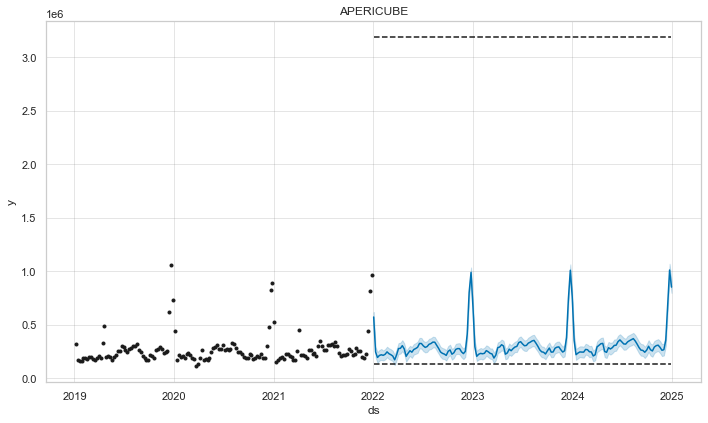

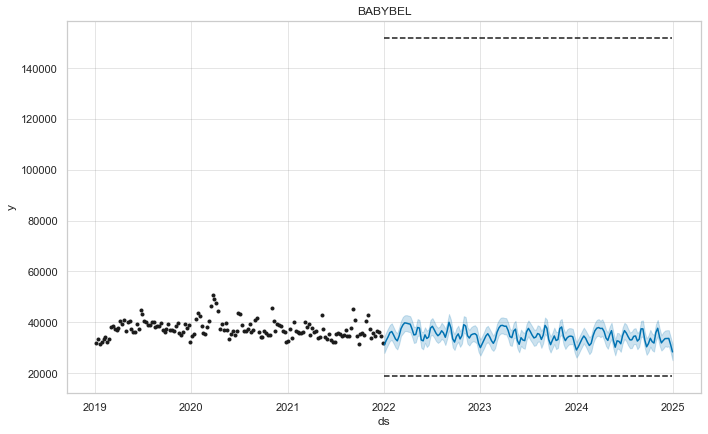

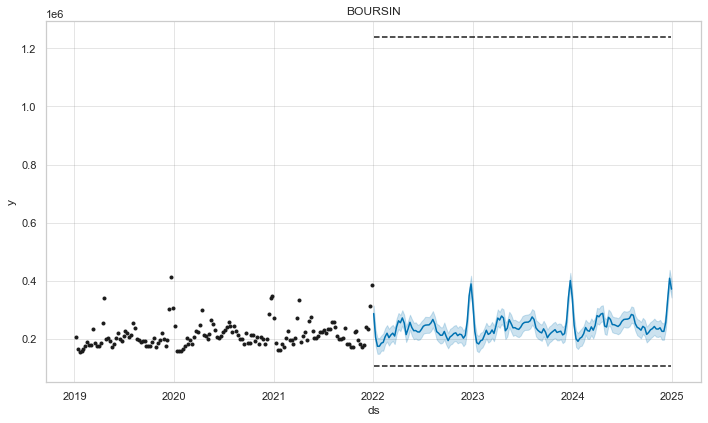

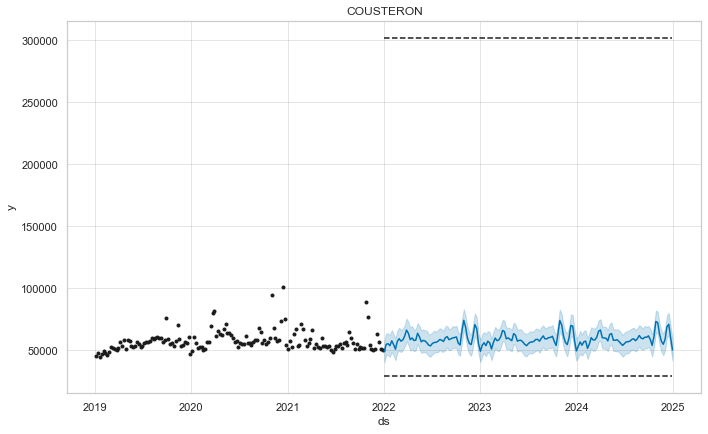

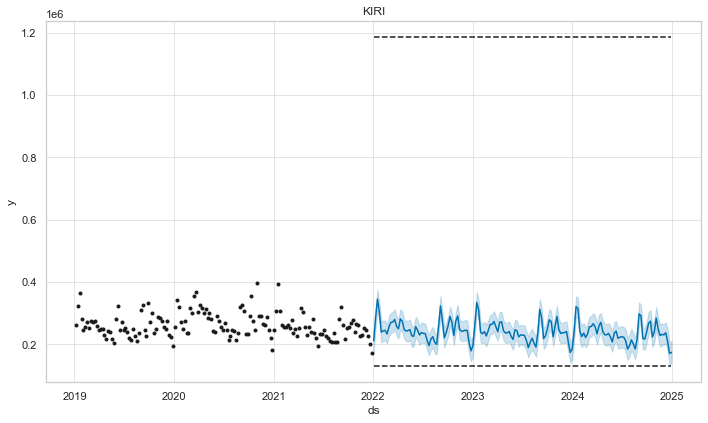

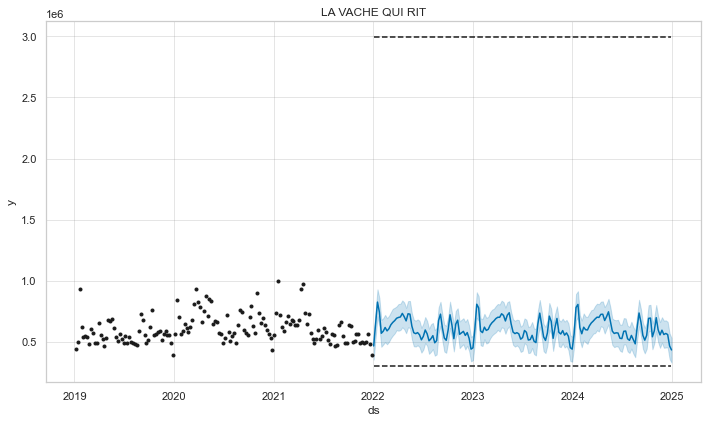

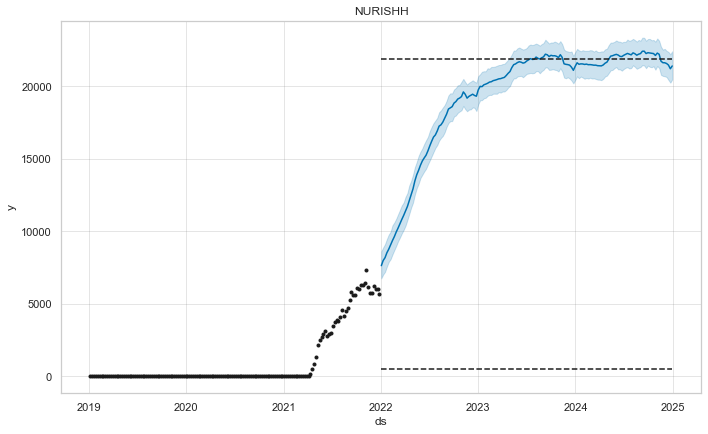

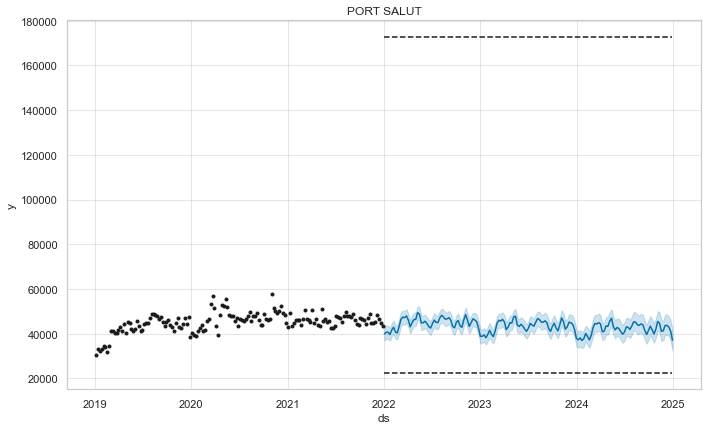

In [12]:
df_bel_brands = df_bel_hmsm.groupby(["Date", "Brand"]).agg('sum')['Sales in volume'].unstack().reset_index()
df_bel_brands.columns.name=''
df_bel_brands = df_bel_brands.fillna(0)
df_bel_brands_fcst_res = forecasting_features(df_bel_brands, list(df_bel_brands.columns[1:]), periods=157, freq='W')

array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
      dtype=object)

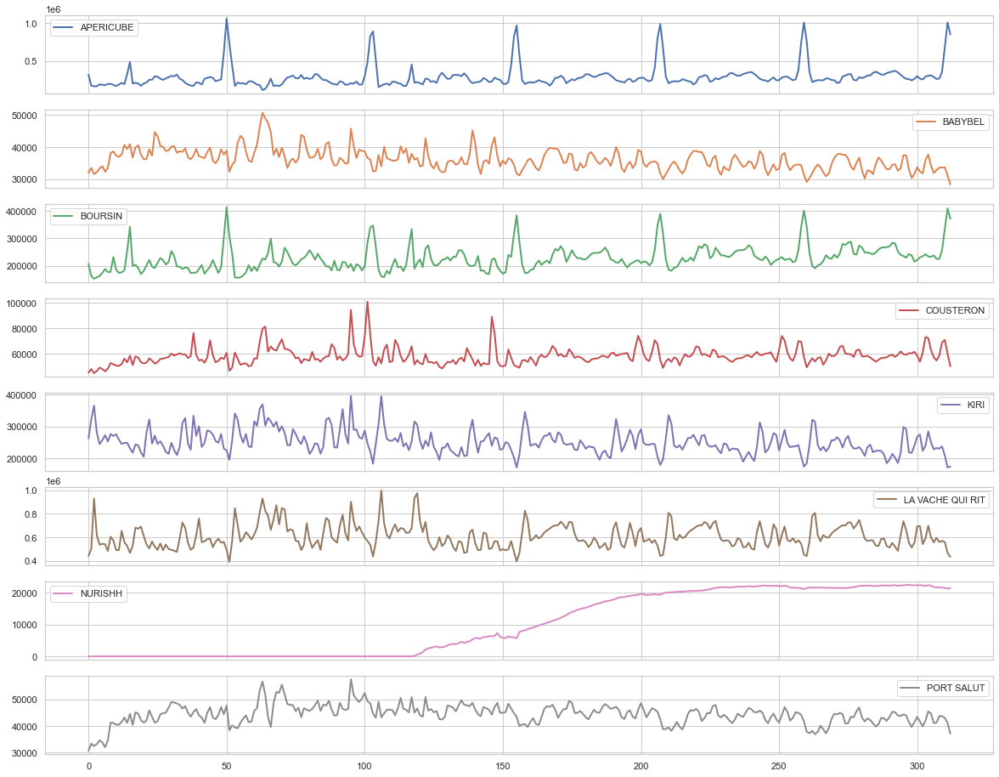

In [46]:
df_bel_brands_fcst_res.iloc[:, 1:].plot(subplots=True, linewidth=2, figsize=(20, 16))

In [47]:
df_bel_brands_fcst_res['Date'] = df_bel_brands_fcst_res.Date.apply(lambda x: x.strftime('%Y-%m-%d'))
df_bel_brands_fcst_res.round(1).to_excel("results/FR/HMSM/fr_hmsm_brands_forecasts_no_regressors.xlsx", index=False)

#### With Regressors

In [9]:
df_bel_hmsm['Trends'] = df_bel_hmsm.apply(lambda x: df_trends[df_trends.Date == x.Date][x.Brand].values[0], axis=1)
df_bel_hmsm.fillna(0, inplace=True)
df_bel_hmsm.head()

,Date,Brand,Price per volume,Sales in volume,Sales in value,Distribution,Sell-in,Advertising,Promotion,A&P,MVC,Rate of Innovation,Trends
0,2019-01-06,APERICUBE,13.131324,317063.709040,4.270993e+06,681.779410,1.081436e+06,44.38528,74.99087,29844.0375,627333.873400,0.0,1
1,2019-01-06,BABYBEL,8.278697,31992.483765,2.686242e+05,70.038097,1.508784e+06,683.15914,137.30146,205115.1500,806691.118450,0.0,6
2,2019-01-06,BOURSIN,18.001748,207758.221914,2.881462e+06,192.582568,9.410844e+05,33.81879,133.43824,41814.2575,414141.127425,0.0,32
3,2019-01-06,COUSTERON,7.988248,45179.037323,3.654272e+05,120.191609,1.393531e+05,0.00000,11.92763,2981.9075,24573.224600,0.0,0
4,2019-01-06,KIRI,9.245133,262535.235110,2.394732e+06,171.488026,1.419914e+06,43.41143,123.65016,41765.3975,700810.716475,0.0,27


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -12.3186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       218.535   0.000304039       97.6161      0.1724           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       218.586   0.000100481       93.5579   1.013e-06       0.001      203  LS failed, Hessian reset 
     154       218.601   1.58795e-05       102.379   1.751e-07       0.001      268  LS failed, Hessian reset 
     185       218.602    1.5617e-06       103.251   1.543e-08       0.001      354  LS failed, Hessian reset 
     199       218.603   4.67771e-08        90.645      0.2968           1      375   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     214       218.603   3.84927e-07       104.267   4.141e-09       0.001      434  LS failed, Hessian reset 
     219       218.603   8.75112e-09        88.337      0.1501   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.13249
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       608.655    0.00199794       163.276      0.6209           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     183       608.881   9.71318e-09       57.8098     0.02111           1      241   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.54068
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       451.705     0.0137765       333.316       0.715       0.715      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       452.246    0.00128717       145.308   1.402e-05       0.001      191  LS failed, Hessian reset 
     145       453.395   0.000270015       84.1981   4.281e-06       0.001      270  LS failed, Hessian reset 
     199       453.524   8.95512e-05       57.3319           1           1      343   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     242       453.779   0.000780759       82.1732   1.157e-05       0.001      440  LS failed, Hessian reset 
     299       453.892   9.84419e-05       46.0997           1           1      512   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -13.8555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       425.074    0.00138563       85.7598      0.7237      0.7237      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       429.661   8.94202e-05       79.5809       0.642       0.642      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     274       432.036    0.00203324       79.1778    2.08e-05       0.001      359  LS failed, Hessian reset 
     299       432.189   8.53754e-05       66.4715      0.7267      0.7267      391   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       433.165   0.000463337       112.264      0.3833      0.3833      507   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499        434.69   7.55085e-06    

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -7.06361
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       204.384   2.50081e-06       94.7404      0.2631           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       204.448   0.000434347       62.9203      0.7964      0.7964      251   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     212       204.571   0.000773406       80.4335   8.876e-06       0.001      331  LS failed, Hessian reset 
     299       204.718   3.26949e-07        64.051       3.186      0.7769      445   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     319       204.718   2.57847e-07       80.7083   2.751e-09       0.001      510  LS failed, Hessian reset 
     331       204.718   3.78643e-09       90.5905      0.3024      0.3024      526   
Optimization terminat

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.02611
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       833.652    0.00120046       1121.09      0.3645      0.3645      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       837.886   0.000608105       341.078           1           1      247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       838.413   8.03242e-05       83.1635      0.6131      0.6131      361   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399           839   0.000134092       331.305      0.8762      0.8762      480   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     465       839.157   3.70921e-06       104.862   1.646e-08       0.001      605  LS failed, Hessian reset 
     499       839.235   3.00434e-05    

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -4.40229
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       398.933    0.00311496       81.4035      0.7287      0.7287      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       401.158   0.000361666       47.6552   3.487e-06       0.001      200  LS failed, Hessian reset 
     199       403.979   0.000800428       87.1085      0.5151      0.5151      291   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       410.835    0.00281032       77.7215           1           1      411   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     303        410.96   0.000937097       94.9488    9.76e-06       0.001      454  LS failed, Hessian reset 
     382       411.717   1.09391e-08       64.5688      0.0341      0.8528      554   
Optimization terminat

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -203.243
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       159.781   0.000690748       116.417    0.004442           1      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       161.115   2.02442e-05        414.78   2.842e-07       0.001      290  LS failed, Hessian reset 
     198        161.57   1.14417e-06       59.2741   1.043e-08       0.001      398  LS failed, Hessian reset 
     199       161.572   5.43388e-05        55.341         100           1      401   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       161.635   1.52657e-06       86.6958   1.149e-08       0.001      509  LS failed, Hessian reset 
     250       161.661    1.1865e-06       65.4199   1.274e-08       0.001      584  LS failed, Hessian reset 
     288       161.672   4.22858e-06       65.4918   8.205e-09   

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -14.602
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       213.874   3.97375e-07        88.114      0.2991      0.2991      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       213.874   9.59661e-09       91.7969      0.1837      0.1837      139   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.1815
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       528.297    0.00500438       359.735           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       532.707    0.00021758       153.317   3.076e-06       0.001      202  LS failed, Hessian reset 
     199        536.05   0.000388405       72.2533           1           1      277   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        537.98    0.00226114        124.56      0.2574           1      426   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     331       538.496   0.000193281       139.267   4.541e-07       0.001      505  LS failed, Hessian reset 
     399       539.181   8.03088e-05       89.1636           1           1      593   
    Iter      log prob

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.45237
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      66       400.004    0.00386608       112.405   4.562e-05       0.001      132  LS failed, Hessian reset 
      99       400.234   2.60078e-06       52.3466      0.5606      0.5606      181   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       400.238   3.68203e-05       66.7269   6.306e-07       0.001      233  LS failed, Hessian reset 
     137        400.24   4.47416e-06       60.3833   7.189e-08       0.001      318  LS failed, Hessian reset 
     157        400.24   2.01531e-08       63.7269      0.1816           1      350   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -8.25546
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       373.528   4.14332e-09       88.3489      0.2565      0.2565      109   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -9.21343
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       234.789   0.000149402       60.2026       2.476           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       234.823    0.00029197       68.4479   3.895e-06       0.001      206  LS failed, Hessian reset 
     170       234.833   2.89966e-08       56.4142      0.1749           1      270   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.03169
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       662.599   0.000503139       172.239           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       662.814   2.26971e-05       73.7487   1.792e-07       0.001      212  LS failed, Hessian reset 
     166       663.139   0.000394401       158.564   4.864e-06       0.001      284  LS failed, Hessian reset 
     199       663.298   0.000346327       112.613           1           1      326   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     268        663.65   3.45774e-05        123.56   2.334e-07       0.001      463  LS failed, Hessian reset 
     299       663.748   6.88582e-05       78.8107           1           1      504   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.28979
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       454.727    0.00455061       116.297      0.6826      0.6826      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       459.346   0.000250583       57.1976           1           1      250   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     221       459.655   0.000621229       95.3363   8.138e-06       0.001      339  LS failed, Hessian reset 
     280       459.806   0.000175407       67.5396   3.102e-06       0.001      448  LS failed, Hessian reset 
     299       459.816   1.09875e-06       62.7801      0.9533      0.3227      478   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       460.725     0.0206823       88.4717      0.8574      0.8574      609   
    Iter      log pro

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -6.81905
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78       319.006    0.00143294       231.049   1.693e-05       0.001      137  LS failed, Hessian reset 
      99       319.262   9.88904e-05       63.8789           1           1      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     182       319.636   0.000494425       131.303   5.603e-06       0.001      308  LS failed, Hessian reset 
     199       319.744   3.01689e-05       63.0182      0.7285      0.7285      333   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     260        319.76   5.17421e-05       82.7432   6.603e-07       0.001      450  LS failed, Hessian reset 
     299       319.768   1.24648e-06       61.3931     0.04476      0.8293      503   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -8.72133
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      66       191.075    0.00019982       96.1303   1.947e-06       0.001      119  LS failed, Hessian reset 
      99        191.12   5.59438e-06       99.9037      0.7545      0.7545      157   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       191.161   2.05705e-08        99.651       0.357       0.357      291   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205       191.161   6.42479e-09       98.6385      0.2901           1      299   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.5688
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       571.017    0.00349029       201.547      0.3467      0.3467      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       588.255    0.00164716        316.75       0.647       0.647      255   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        593.58    0.00233163       141.765      0.9996      0.9996      384   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       598.949    0.00193021       206.107           1           1      507   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     490        602.42   0.000112168        151.13   2.064e-07       0.001      659  LS failed, Hessian reset 
     499       603.669    0.00435216     

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.44391
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      62       457.329   0.000267303       51.9366   4.983e-06       0.001      132  LS failed, Hessian reset 
      88       457.393   2.65459e-05       46.2501   4.393e-07       0.001      214  LS failed, Hessian reset 
      99       457.394   1.70035e-05       54.7535       3.746      0.3746      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       457.448   0.000247613       60.9008   3.849e-06       0.001      340  LS failed, Hessian reset 
     199       457.484   8.49326e-05       52.6634           1           1      426   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       457.488   2.64393e-07       51.6067   5.028e-09       0.001      516  LS failed, Hessian reset 
     231       457.488   1.26527e-07       35.7833    3.18e-09   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -5.75142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      61       309.771   0.000456756       52.1485   7.819e-06       0.001      115  LS failed, Hessian reset 
      99       310.207   0.000135819       63.3405       1.061      0.2819      163   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       310.222   9.91177e-09       46.1006      0.1566      0.1566      248   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/prophet/plot.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
/U

Initial log joint probability = -2.04025
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       666.248     0.0021059       184.505           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     166       666.848   2.94739e-05       102.247   1.624e-07       0.001      265  LS failed, Hessian reset 
     199        666.96   0.000125823       94.1575           1           1      310   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     207       666.972   3.32349e-05       110.552    4.13e-07       0.001      365  LS failed, Hessian reset 
     299       667.101   0.000348978       93.0028           1           1      480   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     366       667.153   2.63456e-05       96.0221   2.678e-07       0.001      613  LS failed, Hessian rese

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.55662
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

      90       425.679    0.00110012        84.112    1.78e-05       0.001      171  LS failed, Hessian reset 
      99       425.785   0.000301326       70.9323           1           1      183   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       426.172   0.000722626       95.2639   7.817e-06       0.001      277  LS failed, Hessian reset 
     199       426.309   2.86802e-05       69.4623           1           1      358   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     207       426.318   4.60247e-05       57.0264   7.688e-07       0.001      400  LS failed, Hessian reset 
     251       426.322   2.17603e-06       66.5656   3.008e-08       0.001      494  LS failed, Hessian reset 
   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -10.098
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       284.991   8.46209e-07       80.7566      0.3421           1      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       284.991    2.0283e-07       80.9129   2.341e-09       0.001      225  LS failed, Hessian reset 
     145       284.991   1.25855e-08       74.4311       0.529           1      240   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -14.533
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        246.42   1.39251e-05       87.0546      0.5863      0.5863      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       246.437   1.04133e-07       95.4217       0.192           1      259   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205       246.437   8.95836e-09       91.3684      0.4815      0.4815      266   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.02075
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       896.223    0.00128491       628.631           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       899.356   5.58291e-05         134.1           1           1      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        900.33   0.000410434       234.849      0.9405      0.9405      363   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       900.998   0.000544814       244.427           1           1      476   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       901.599   6.97528e-07       119.404     0.02741     0.02741      610   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -3.24695
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       429.266    0.00471674       204.968      0.3254      0.3254      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       434.071   0.000527145       125.864   5.797e-06       0.001      238  LS failed, Hessian reset 
     199       434.988    0.00101695       78.7838      0.2868      0.2868      306   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     214       435.825   0.000424297       139.556   3.962e-06       0.001      359  LS failed, Hessian reset 
     299       438.109    0.00384888       97.3195      0.7831      0.7831      463   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     369       441.266   0.000425153       155.553   3.723e-06       0.001      584  LS failed, Hessian rese

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -6.39108
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       377.986   0.000250948       67.3246   4.921e-06       0.001      155  LS failed, Hessian reset 
      99       378.004   3.80506e-06        85.007      0.3138      0.3138      178   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     150        378.06   0.000422168       85.4399   5.314e-06       0.001      293  LS failed, Hessian reset 
     199       378.147   0.000110741       63.4034      0.8014      0.8014      361   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     241       378.382    0.00152515       144.804   1.265e-05       0.001      449  LS failed, Hessian reset 
     299       378.543   0.000257729       65.6222           1           1      536   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.



Initial log joint probability = 11.6429
Iteration  1. Log joint probability =    7.78044. Improved by -3.86246.
Iteration  2. Log joint probability =    9.72857. Improved by 1.94813.
Iteration  3. Log joint probability =    14.1494. Improved by 4.42087.
Iteration  4. Log joint probability =    14.1992. Improved by 0.0497439.
Iteration  5. Log joint probability =    14.2519. Improved by 0.0527155.
Iteration  6. Log joint probability =    14.3276. Improved by 0.0756841.
Iteration  7. Log joint probability =    14.3864. Improved by 0.0588162.
Iteration  8. Log joint probability =    14.4171. Improved by 0.0307407.
Iteration  9. Log joint probability =    14.4579. Improved by 0.0407684.
Iteration 10. Log joint probability =    14.5695. Improved by 0.111556.
Iteration 11. Log joint probability =     14.729. Improved by 0.159503.
Iteration 12. Log joint probability =    14.8793. Improved by 0.150319.
Iteration 13. Log joint probability =    14.9293. Improved by 0.0500336.
Iteration 14. Log 

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_


Initial log joint probability = 13.0668
Iteration  1. Log joint probability =    5.25503. Improved by -7.81175.
Iteration  2. Log joint probability =    26.0459. Improved by 20.7908.
Iteration  3. Log joint probability =    26.0703. Improved by 0.0244204.
Iteration  4. Log joint probability =    26.0939. Improved by 0.0236651.
Iteration  5. Log joint probability =    26.1063. Improved by 0.0123872.
Iteration  6. Log joint probability =    26.1594. Improved by 0.0531149.
Iteration  7. Log joint probability =    26.1733. Improved by 0.0138138.
Iteration  8. Log joint probability =    26.2432. Improved by 0.0699212.
Iteration  9. Log joint probability =    26.2444. Improved by 0.00121436.
Iteration 10. Log joint probability =    26.3474. Improved by 0.103024.
Iteration 11. Log joint probability =    26.3593. Improved by 0.0119155.
Iteration 12. Log joint probability =    26.3783. Improved by 0.018953.
Iteration 13. Log joint probability =    26.4479. Improved by 0.0696216.
Iteration 14. 

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_


Initial log joint probability = 12.892
Iteration  1. Log joint probability =    28.9716. Improved by 16.0796.
Iteration  2. Log joint probability =    52.4637. Improved by 23.4921.
Iteration  3. Log joint probability =    75.6447. Improved by 23.181.
Iteration  4. Log joint probability =    76.4463. Improved by 0.801611.
Iteration  5. Log joint probability =    78.8134. Improved by 2.36705.
Iteration  6. Log joint probability =    78.8302. Improved by 0.0168504.
Iteration  7. Log joint probability =    79.0078. Improved by 0.177555.
Iteration  8. Log joint probability =    79.1394. Improved by 0.131587.
Iteration  9. Log joint probability =    79.1952. Improved by 0.0558715.
Iteration 10. Log joint probability =    79.3777. Improved by 0.182428.
Iteration 11. Log joint probability =    79.4395. Improved by 0.0618211.
Iteration 12. Log joint probability =      79.45. Improved by 0.0105498.
Iteration 13. Log joint probability =    79.4558. Improved by 0.00572949.
Iteration 14. Log joint

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.



Initial log joint probability = -127.003
Iteration  1. Log joint probability =    4.78385. Improved by 131.787.
Iteration  2. Log joint probability =    55.2448. Improved by 50.4609.
Iteration  3. Log joint probability =    78.4131. Improved by 23.1683.
Iteration  4. Log joint probability =    105.911. Improved by 27.4977.
Iteration  5. Log joint probability =    121.046. Improved by 15.1349.
Iteration  6. Log joint probability =    141.238. Improved by 20.1924.
Iteration  7. Log joint probability =    154.745. Improved by 13.5073.
Iteration  8. Log joint probability =    162.089. Improved by 7.34374.
Iteration  9. Log joint probability =     173.09. Improved by 11.0006.
Iteration 10. Log joint probability =    200.341. Improved by 27.2516.
Iteration 11. Log joint probability =    212.324. Improved by 11.9821.
Iteration 12. Log joint probability =    212.324. Improved by 0.000332502.
Iteration 13. Log joint probability =    212.334. Improved by 0.00998863.
Iteration 14. Log joint prob

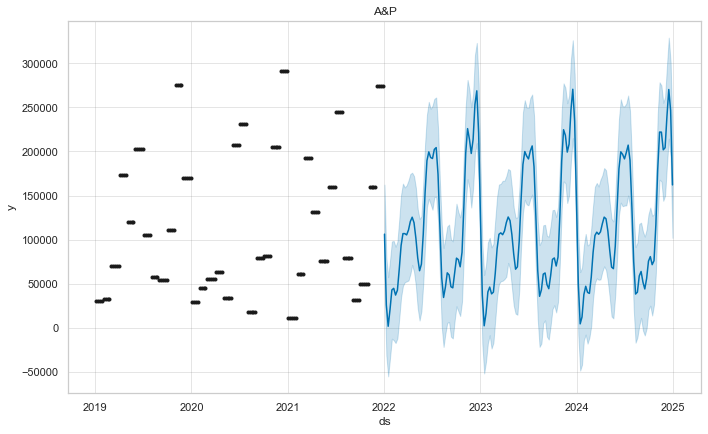

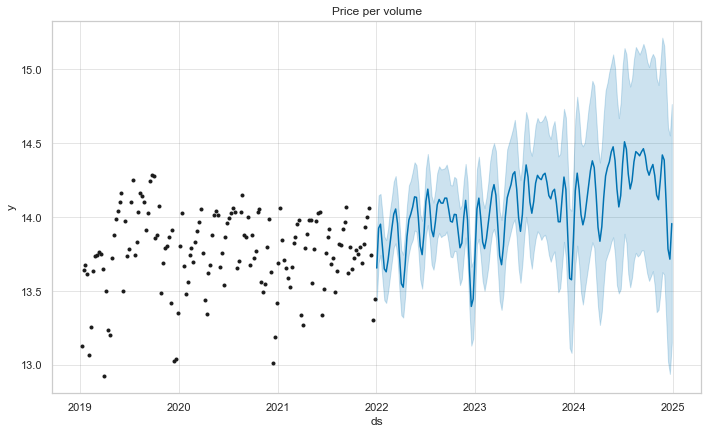

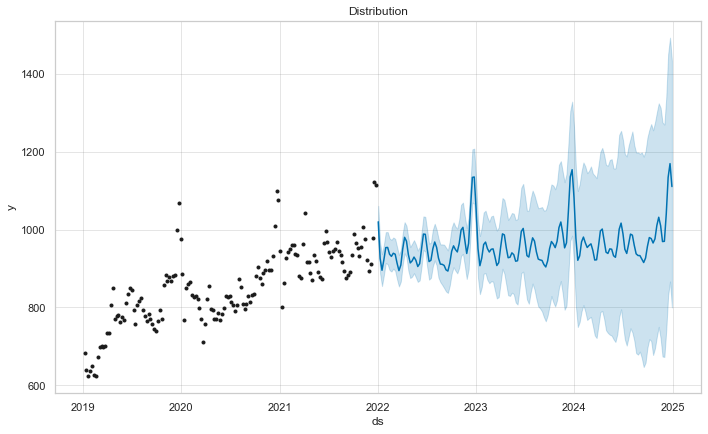

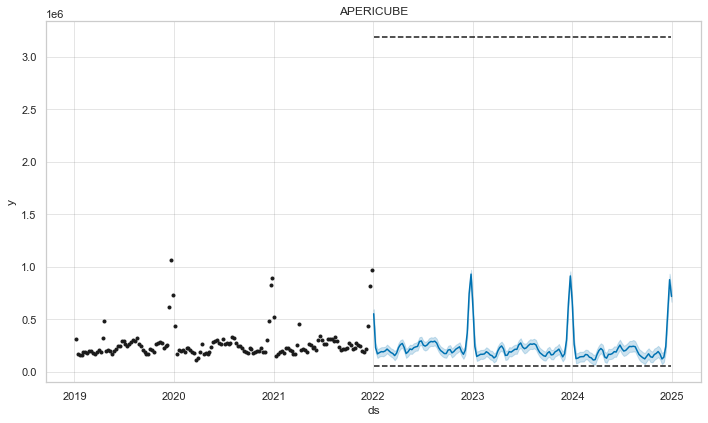

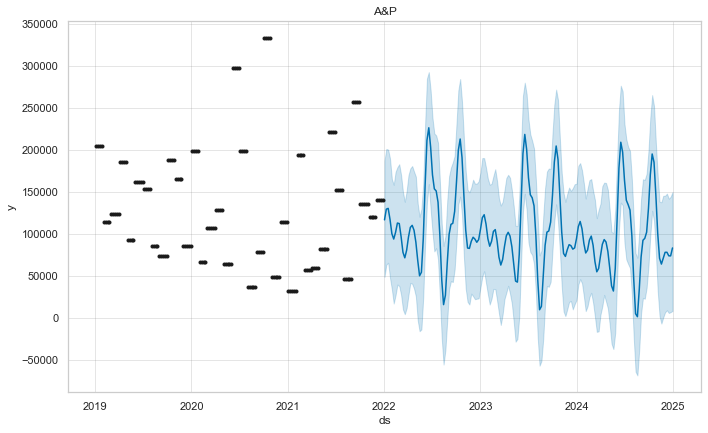

...

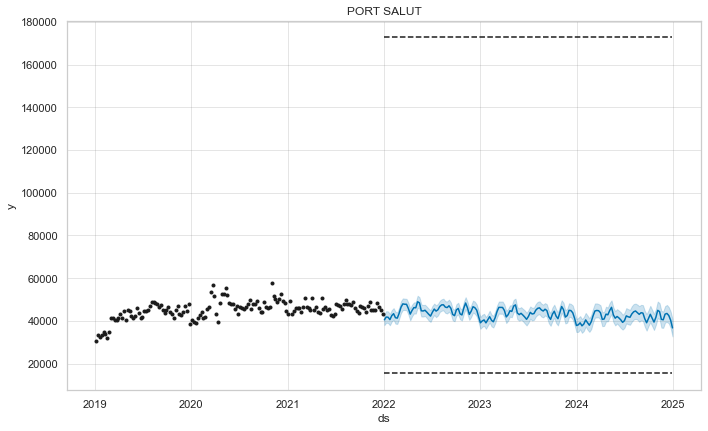

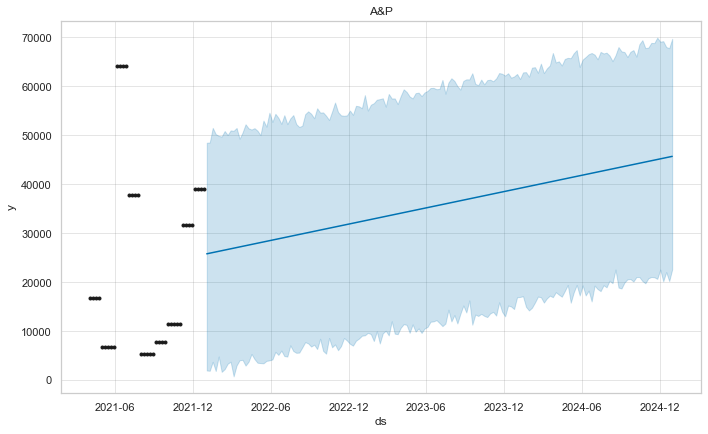

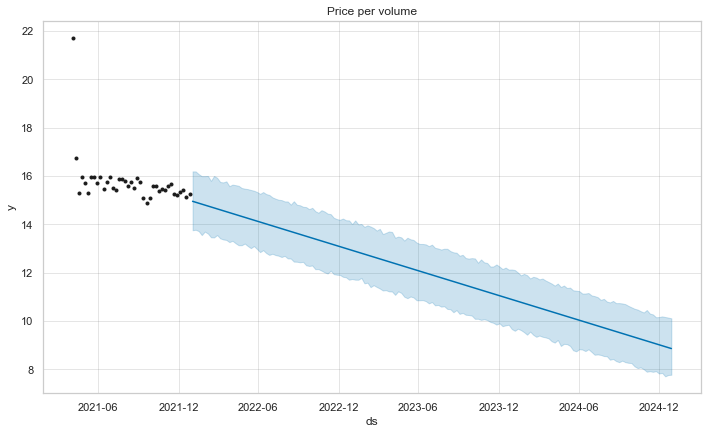

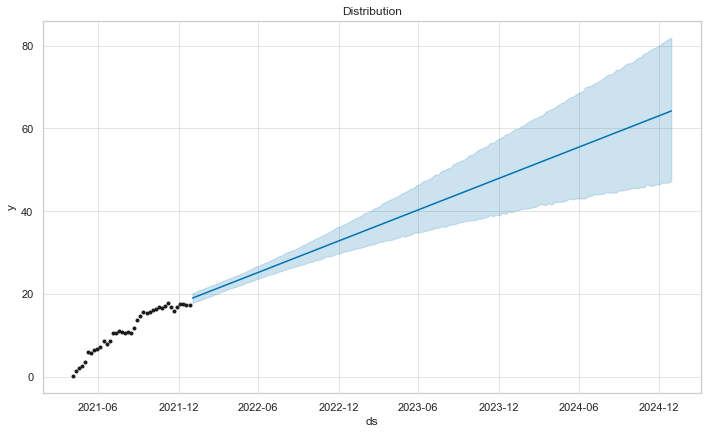

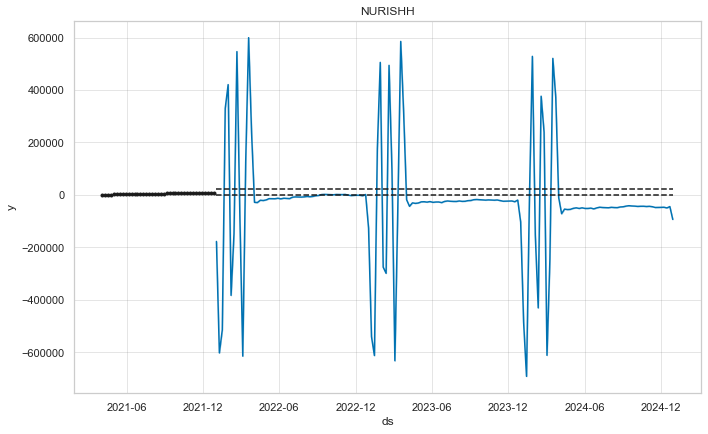

In [10]:
features_name = ['A&P', 'Price per volume', 'Distribution']
feats_futures, df_brands_fcst_res = forecasting_brands(df_bel_hmsm, brands_name[country], features_name, periods=157, freq='W')

In [11]:
df_brands_fcst_res

,Date,APERICUBE,BABYBEL,BOURSIN,COUSTERON,KIRI,LA VACHE QUI RIT,PORT SALUT,NURISHH
0,2019-01-06,317063.709040,31992.483765,207758.221914,45179.037323,262535.235110,442844.844969,30668.396486,NaN
1,2019-01-13,174449.843237,33491.827850,163368.285736,47969.232664,321561.565615,502952.464256,33339.981047,NaN
2,2019-01-20,164711.825455,31584.829494,153203.820587,44734.434229,365251.136687,929845.271817,32469.477599,NaN
3,2019-01-27,165458.787968,32156.818602,158320.904898,46480.115556,280757.979905,618859.504353,33135.705606,NaN
4,2019-02-03,189310.973142,33366.944630,163540.468899,49107.726452,244565.342242,537446.522657,34566.752297,NaN
...,...,...,...,...,...,...,...,...,...
308,2024-12-01,141176.451276,31147.273968,302305.324210,39550.623765,265487.459689,279324.065561,43146.517693,-47815.656707
309,2024-12-08,241947.023351,31292.507654,333833.667336,50610.838180,270621.827964,288414.022657,43447.673091,-47376.177331
310,2024-12-15,555931.594063,31239.366954,405520.574828,49169.219149,241235.244232,269761.236608,42497.611964,-50098.409557
311,2024-12-22,878531.641933,28809.211866,480057.889537,39363.984811,205389.224370,173921.650997,40326.721836,-44879.853904


In [12]:
df_brands_fcst_res.fillna(0, inplace=True)
df_brands_fcst_res['Date'] = df_brands_fcst_res.Date.apply(lambda x: x.strftime('%Y-%m-%d'))
df_brands_fcst_res.round(1).to_excel("results/FR/HMSM/fr_hmsm_brands_forecasts_with_regressors.xlsx", index=False)

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
      dtype=object)

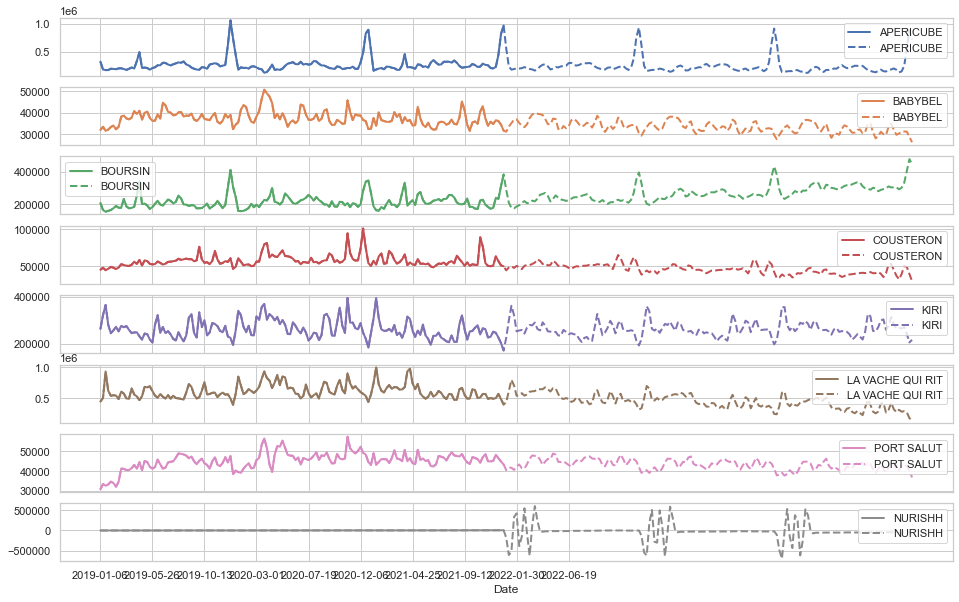

In [13]:
ax = df_brands_fcst_res.set_index("Date").loc['2017-12-31':'2021-12-26'].plot(linewidth=2, subplots=True, figsize=(16, 10))
df_brands_fcst_res.set_index("Date").plot(linewidth=2, linestyle='--', subplots=True, figsize=(16, 10), ax=ax)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

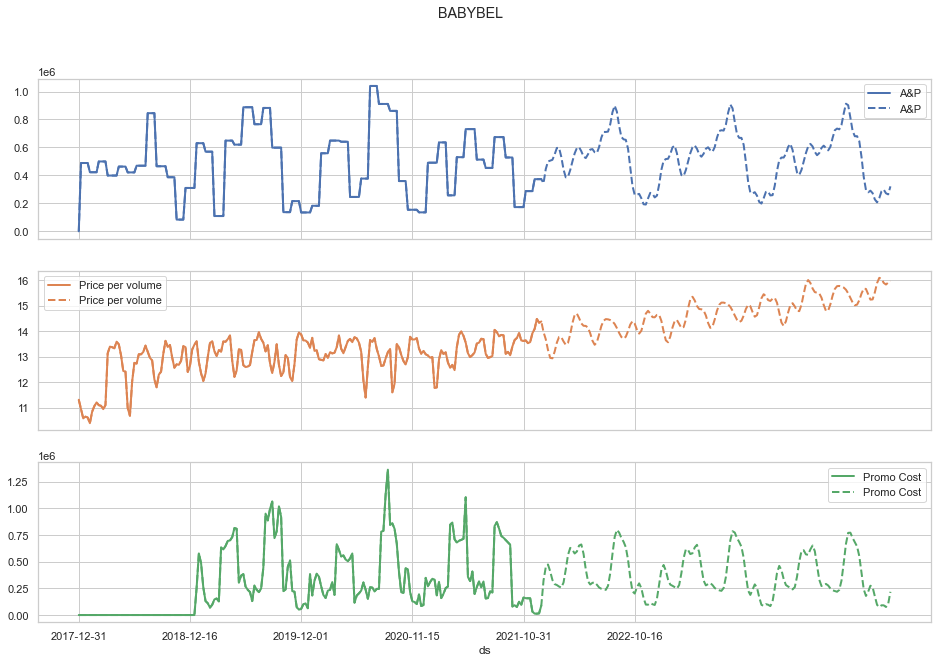

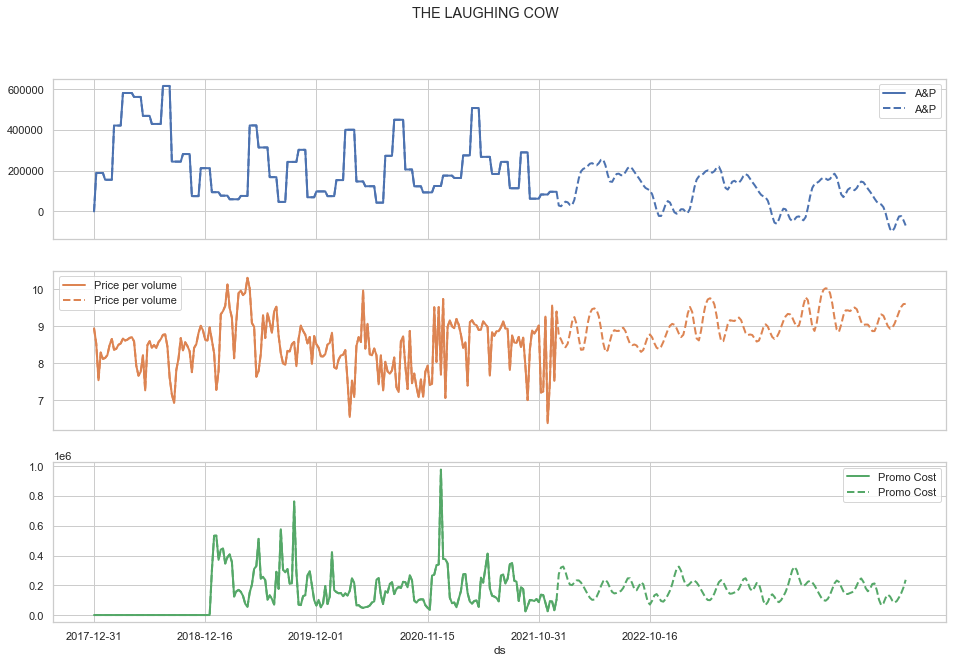

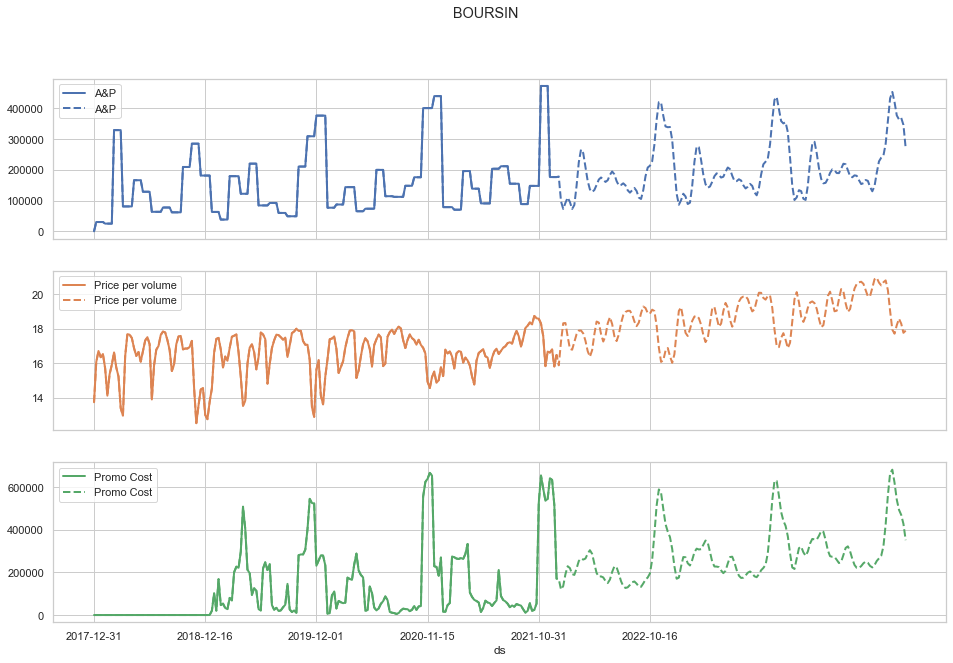

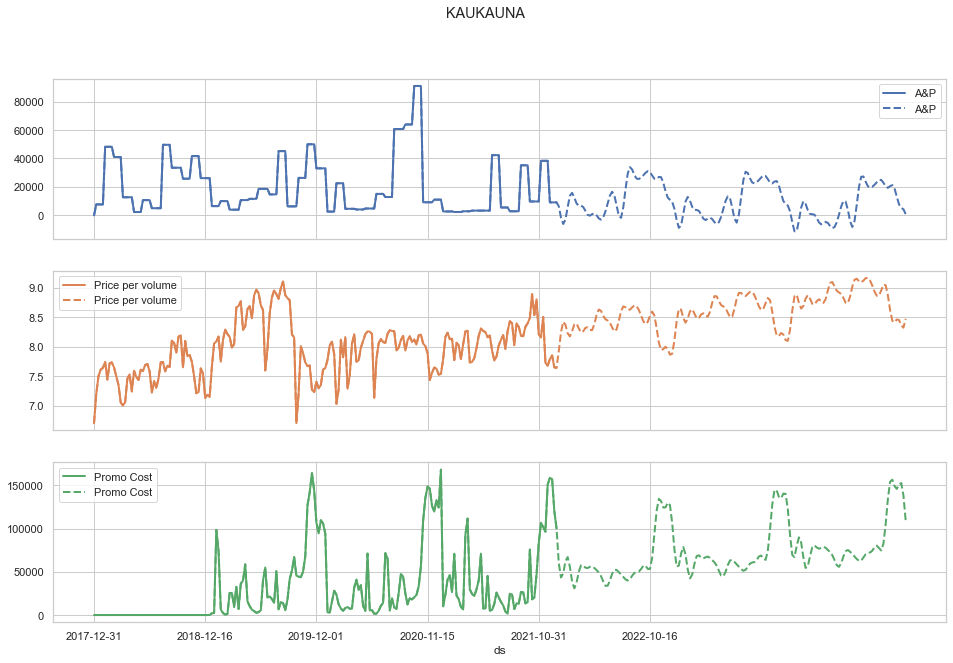

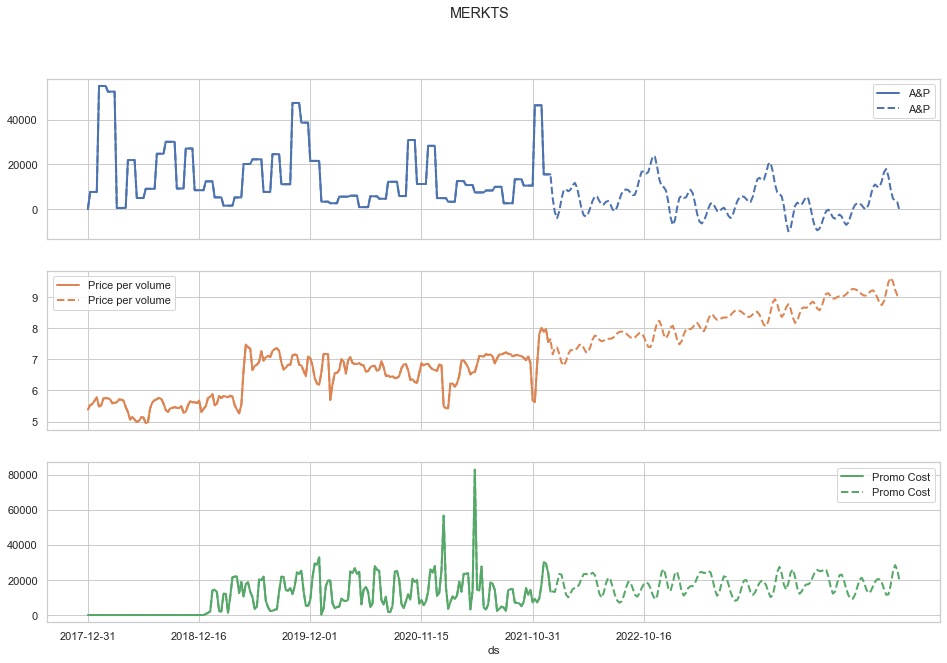

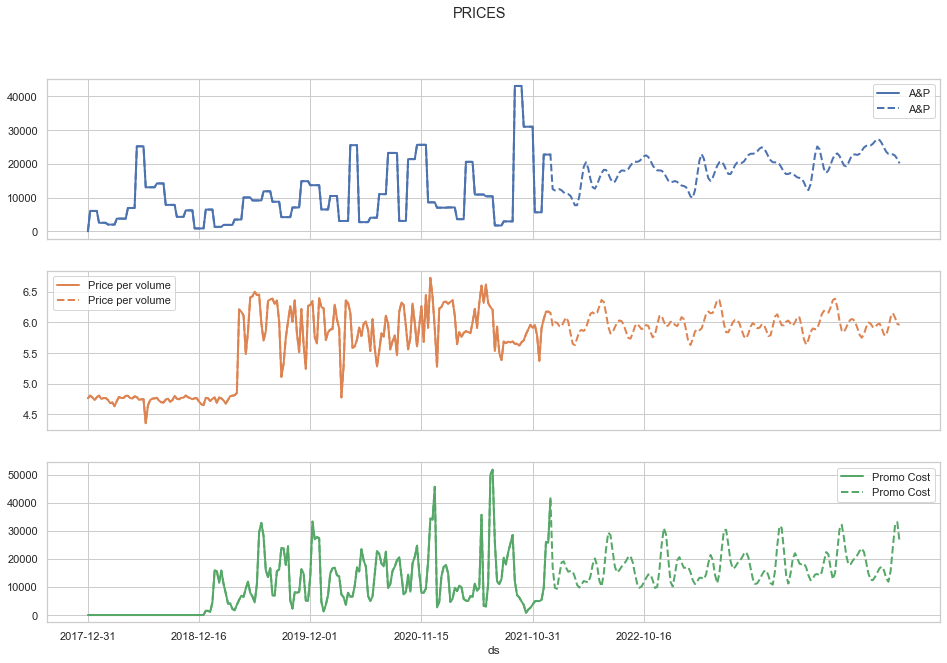

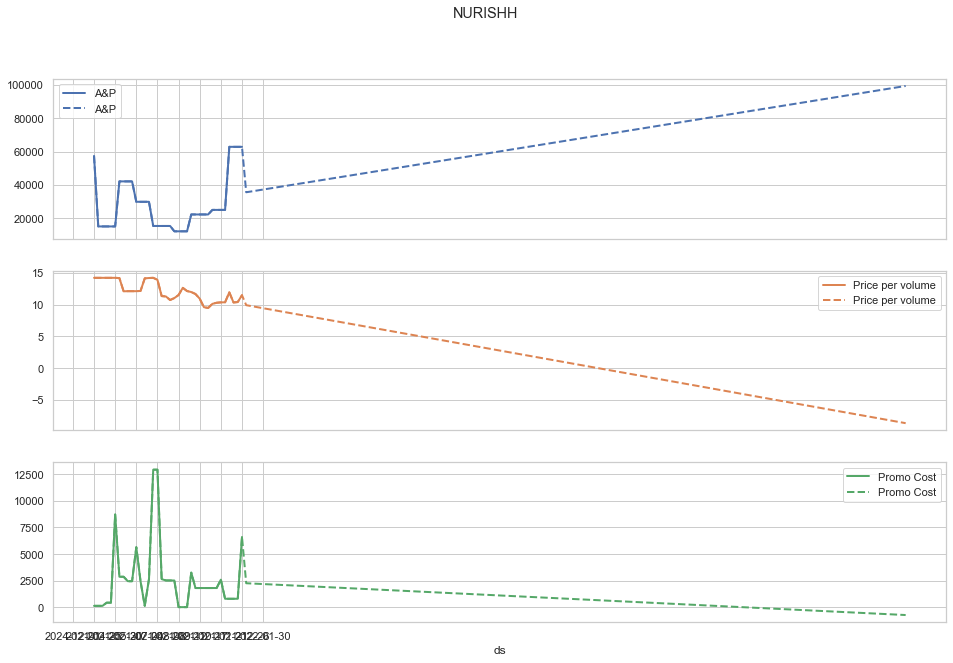

In [123]:
for brand in feats_futures:
    ax = feats_futures[brand].set_index('ds').loc['2017-12-31':'2021-12-26'].plot(subplots=True, figsize=(16, 10), title=brand, linewidth=2);
    feats_futures[brand].set_index('ds').plot(
        subplots=True, figsize=(16, 10), title=brand, 
        linestyle='--', linewidth=2, ax=ax);

### Forecasting Markets

In [14]:
features_markets = list(df_hmsm.Category.unique()) + ['TOTAL CHEESE']
df_markets = get_df_markets(df_hmsm)
df_markets.head()

,Date,A GOUT,A TARTINER,ALTERNATIVE VEGETALE,AOR REGIONAL,APERITIF,ARO,BLOC,BREBIS,CHEVRE,...,INGREDIENT A CHAUD,NATURE,NOMADE,ORIGINAL,PATE PERSILLEE,PLAT CHAUD,RAPE,SALADE,SPECIALITE A GOUT DOUX,TOTAL CHEESE
0,2019-01-06,143324.633106,315274.967674,1248.075000,411731.973115,210652.518572,239248.117542,744935.803921,93924.724554,588782.215963,...,284859.651598,259422.701935,155353.205248,99098.215466,232728.492699,1.219834e+06,1.834360e+06,290189.496628,437810.907345,8.959310e+06
1,2019-01-13,153008.025049,362405.969408,1377.301691,429049.820304,113624.906187,226903.630373,864722.747598,102474.989404,601923.530668,...,300082.598301,242963.783308,185971.687205,108651.369114,259405.003167,1.114742e+06,1.890007e+06,281674.901042,473537.158455,9.298218e+06
2,2019-01-20,150803.982661,570998.488579,1403.501710,424703.338211,108353.680538,240886.593953,930356.467871,99332.417516,644217.956202,...,285805.708155,272148.442342,163706.506473,116786.484459,265090.715629,1.083817e+06,1.805422e+06,277670.908612,565069.959319,9.641060e+06
3,2019-01-27,162960.542784,398166.534820,1379.556710,423843.873850,102873.737412,221880.423786,875224.144042,104236.314216,626188.907460,...,306908.127880,250419.674533,153150.722896,114291.561827,247751.689249,1.065304e+06,1.840816e+06,272535.256214,509781.345638,9.245558e+06
4,2019-02-03,166691.815916,350958.626341,1374.965719,414553.161854,111869.203441,229215.485884,868107.394585,98319.536340,614225.433885,...,320252.773605,243810.357015,164766.767767,126573.577998,263238.008345,9.806148e+05,1.977519e+06,285102.763229,476980.074286,9.278015e+06


In [15]:
features_markets

['A TARTINER',
 'NOMADE',
 'APERITIF',
 'ARO',
 'NATURE',
 'RAPE',
 'CHEVRE&BREBIS',
 'A GOUT',
 'ORIGINAL',
 'SALADE',
 'PLAT CHAUD',
 'BLOC',
 'PATE PERSILLEE',
 'CLASSIQUE',
 'AOR REGIONAL',
 'SPECIALITE A GOUT DOUX',
 'BREBIS',
 'CHEVRE',
 'INGREDIENT A CHAUD',
 'ALTERNATIVE VEGETALE',
 'TOTAL CHEESE']

Features:   0%|          | 0/21 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value inste

Initial log joint probability = -7.43184
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       270.484   0.000741134        74.749   9.059e-06       0.001      155  LS failed, Hessian reset 
      99       270.523   4.23917e-05       69.8883        0.43        0.43      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       270.531   5.68435e-06       82.6957   6.827e-08       0.001      242  LS failed, Hessian reset 
     160       270.532   4.44918e-06       85.1686   5.495e-08       0.001      319  LS failed, Hessian reset 
     191       270.533   6.15684e-09       78.7399      0.5816      0.5816      358   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -10.6302
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       353.656   1.77527e-05        48.448      0.2591      0.2591      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       353.703   5.98261e-05       76.7588   4.464e-07       0.001      191  LS failed, Hessian reset 
     177       353.811   9.71839e-05       70.4062   1.836e-06       0.001      322  LS failed, Hessian reset 
     199       353.827   1.35458e-05       38.9636      0.5566      0.5566      349   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     229       353.839   1.51872e-05       29.6738   2.371e-07       0.001      421  LS failed, Hessian reset 
     248        353.84   5.16611e-06       41.5512   8.825e-08       0.001      485  LS failed, Hessian reset 
     264        353.84    8.2197e-08       56.3375   1.393e-09   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -16.6175
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       389.121    0.00332831       92.2819      0.3846      0.3846      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       394.975    0.00238047       88.9914           1           1      270   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     274       395.399   9.52571e-05       76.1549   1.058e-06       0.001      399  LS failed, Hessian reset 
     299       395.403   7.92485e-07       71.3465           1           1      438   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     385       396.265    0.00335311        88.575   3.701e-05       0.001      581  LS failed, Hessian reset 
     399       396.617   0.000433378       88.4242      0.9713      0.9713      597   
    Iter      log pro

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -10.1765
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       390.151   0.000267156       84.9468           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       390.489    0.00250657       91.5066   2.943e-05       0.001      204  LS failed, Hessian reset 
     193       390.708   7.76525e-05       81.5428   1.027e-06       0.001      335  LS failed, Hessian reset 
     199       390.711   2.09611e-05       58.0612      0.3984           1      343   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     251       390.714   3.60072e-06        79.245   5.263e-08       0.001      449  LS failed, Hessian reset 
     268       390.714   6.17497e-09       69.7478     0.03248       0.327      475   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -5.07938
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      49       387.843    0.00547284       97.4191   0.0001147       0.001      113  LS failed, Hessian reset 
      70        388.07   0.000120931       60.7069   1.931e-06       0.001      183  LS failed, Hessian reset 
      99       388.077   9.61227e-06        51.889           1           1      224   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       388.326    0.00177647        52.429   2.763e-05       0.001      279  LS failed, Hessian reset 
     139       388.385   9.91065e-06       51.2536   2.112e-07       0.001      383  LS failed, Hessian reset 
     178       388.405   3.19676e-05       59.0329   6.232e-07       0.001      475  LS failed, Hessian reset 
     199       388.413   6.82555e-06       47.7911      0.3495      0.3495      507   
    Iter      log prob        ||dx||      ||gr

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -4.47554
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       317.964   0.000641234       59.5944      0.1131           1      145   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100        317.97   0.000378781       46.6827   6.356e-06       0.001      192  LS failed, Hessian reset 
     182       318.202    0.00281137       75.0293   3.299e-05       0.001      325  LS failed, Hessian reset 
     199       318.291   2.40312e-05       55.7237      0.2805           1      348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     211       318.304   4.54776e-05       52.9703   7.399e-07       0.001      406  LS failed, Hessian reset 
     226       318.306   7.80957e-06       62.5827   1.147e-07       0.001      462  LS failed, Hessian reset 
     253       318.307   4.83443e-09       41.4608      0.0658   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -12.4798
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       357.378   0.000277479       81.4029           1           1      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     164       357.459   9.65395e-09       62.1018      0.2274      0.2274      236   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -14.4347
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      77       369.605   0.000147735       82.1882   2.178e-06       0.001      136  LS failed, Hessian reset 
      99        369.76    0.00184535        54.348      0.7437     0.07437      168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       370.012   0.000215247       118.595   2.233e-06       0.001      249  LS failed, Hessian reset 
     169       370.136   3.11297e-05       81.9281   4.532e-07       0.001      361  LS failed, Hessian reset 
     198       370.139   9.82559e-10       51.8014     0.01684      0.3968      404   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -27.6058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       288.835   3.18428e-05       70.8464   5.331e-07       0.001      165  LS failed, Hessian reset 
      99       288.902   0.000212493       55.5344      0.5197           1      180   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       289.277   3.94657e-05       63.5845   2.578e-07       0.001      272  LS failed, Hessian reset 
     174       289.396    5.7703e-05       128.832   5.342e-07       0.001      369  LS failed, Hessian reset 
     199       289.459   3.93354e-05       71.8721           1           1      405   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     216       289.469   7.05197e-05       47.5181   1.157e-06       0.001      471  LS failed, Hessian reset 
     232       289.471   3.18913e-06       54.4553   6.204e-08   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -193.448
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       177.381   7.89092e-06       113.766   4.599e-08       0.001      175  LS failed, Hessian reset 
      99       178.217    0.00401421       287.547     0.05137       0.672      200   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       179.643   1.49338e-05        83.638      0.7741      0.7741      340   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     250        179.67    7.4188e-06       112.854   5.152e-08       0.001      449  LS failed, Hessian reset 
     288       179.676   4.72045e-09        75.545      0.5252      0.5252      504   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -20.6526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      62       369.201    0.00507275       81.5297   7.113e-05       0.001      128  LS failed, Hessian reset 
      98       369.673   0.000993581       74.8525   1.157e-05       0.001      211  LS failed, Hessian reset 
      99       369.687   0.000295819       76.9406      0.8276      0.8276      212   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111        369.76   0.000303231       78.3182   3.537e-06       0.001      262  LS failed, Hessian reset 
     177       370.284    0.00236016        80.693   2.871e-05       0.001      377  LS failed, Hessian reset 
     199       370.526       0.00362       90.2987           1           1      404   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     276       370.661   1.69613e-08       77.5355           1   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -4.84486
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       360.086    0.00434854       163.454      0.9279      0.9279      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       360.343   0.000304373       121.449   3.242e-06       0.001      218  LS failed, Hessian reset 
     199       360.448   6.74631e-05       65.9878      0.6503      0.6503      311   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     231       360.567   0.000252778       107.052   2.715e-06       0.001      397  LS failed, Hessian reset 
     299       360.633   1.03507e-05         75.49       0.404       0.404      488   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     336       360.644   5.76404e-06       46.9655   8.212e-08       0.001      577  LS failed, Hessian rese

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -5.63001
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       384.846   3.58379e-05       54.2944      0.7746      0.7746      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       385.062    0.00136622       92.2776   1.599e-05       0.001      210  LS failed, Hessian reset 
     132       385.186   5.59601e-06        55.347    1.57e-07       0.001      279  LS failed, Hessian reset 
     199       385.197   9.50033e-06       51.7676      0.3139      0.3139      363   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       388.542      0.102515       133.809           1           1      480   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     377       393.242    0.00027852       41.1535   2.961e-06       0.001      619  LS failed, Hessian rese

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -28.2388
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      51       354.167   1.42642e-05       90.2981   4.424e-08       0.001      126  LS failed, Hessian reset 
      88       355.499   3.07697e-05       86.1808    4.24e-08       0.001      227  LS failed, Hessian reset 
      99       356.002    0.00393236       87.2675           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     166       356.903   0.000191643       67.1386   3.146e-06       0.001      383  LS failed, Hessian reset 
     193       356.911   1.16514e-05       84.8539   1.824e-07       0.001      453  LS failed, Hessian reset 
     199       356.912   5.96507e-07       53.8594       1.195      0.2908      462   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     249       356.967   1.47508e-05       89.8483   4.422e-08   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -12.5374
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      61       399.008    0.00166656       58.2332    2.56e-05       0.001      130  LS failed, Hessian reset 
      67       399.024   1.88657e-05       33.1855   8.204e-07       0.001      181  LS failed, Hessian reset 
      79       399.028   1.37912e-05       58.4463    5.84e-07       0.001      246  LS failed, Hessian reset 
      84       399.029   8.99999e-06       42.5373   1.774e-07       0.001      286  LS failed, Hessian reset 
      87       399.029   4.41637e-06       35.2431   1.332e-07       0.001      323  LS failed, Hessian reset 
      92       399.029   5.42511e-08       44.8842   2.356e-09       0.001      368  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -4.14025
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      42        337.98   0.000455181       77.5293   6.496e-06       0.001       99  LS failed, Hessian reset 
      68       338.011   6.92214e-06       65.7577   9.831e-08       0.001      173  LS failed, Hessian reset 
      99       338.021   0.000867661       75.8499           1           1      213   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       338.128   0.000544409       75.6296   5.847e-06       0.001      277  LS failed, Hessian reset 
     199       338.194    1.4644e-05       63.7477      0.5496      0.5496      388   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     236       338.304   0.000377219       65.6809   4.811e-06       0.001      473  LS failed, Hessian reset 
     298       338.331   2.56755e-05       73.8593   3.279e-07   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -3.6937
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      52       352.578   0.000610951       67.7706   6.386e-06       0.001      111  LS failed, Hessian reset 
      99        352.63    0.00013184       73.2042      0.8256      0.8256      169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       352.717    0.00151741       87.0827   2.457e-05       0.001      242  LS failed, Hessian reset 
     188       352.802   2.35957e-08       66.4732           1           1      329   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -3.77411
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      39        384.64   0.000854306       71.4697   1.631e-05       0.001      108  LS failed, Hessian reset 
      78       385.185   2.12878e-05       32.2926   3.945e-07       0.001      221  LS failed, Hessian reset 
      99       385.205   0.000270803       61.6493      0.4162      0.4162      266   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       385.301   0.000180637       51.3098   5.895e-06       0.001      316  LS failed, Hessian reset 
     120       385.319   2.31713e-05       31.8606   6.577e-07       0.001      373  LS failed, Hessian reset 
     143       385.324   5.17725e-05       56.1929   9.388e-07       0.001      461  LS failed, Hessian reset 
     153       385.324   5.65063e-08       31.5314   2.378e-09       0.001      522  LS failed, Hessian reset 
Optimization terminate

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -11.36
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      64       292.517   0.000163574       103.297   9.308e-07       0.001      144  LS failed, Hessian reset 
      99       293.567   0.000282033       65.0193           1           1      197   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       294.351   0.000173459       120.966   2.196e-06       0.001      269  LS failed, Hessian reset 
     199         295.7    0.00849023       77.9841           1           1      370   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       295.873   9.52824e-05       85.1744   1.233e-06       0.001      443  LS failed, Hessian reset 
     261       296.487   0.000112258       78.8861   1.426e-06       0.001      566  LS failed, Hessian reset 
     297       296.499   5.94095e-07       59.0717   1.432e-08     

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -5.05737
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       283.965   2.79158e-06       99.6295       0.578       0.578      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       284.009   0.000144817       100.204   1.432e-06       0.001      184  LS failed, Hessian reset 
     156       284.022   1.09159e-08       102.198      0.6917      0.6917      236   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -3.9696
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       392.344   0.000130555        72.118      0.2975           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     169        392.37     9.097e-07       66.2855   1.234e-08       0.001      286  LS failed, Hessian reset 
     183        392.37   6.18126e-09       68.6235      0.1058      0.4832      305   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/prophet/plot.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


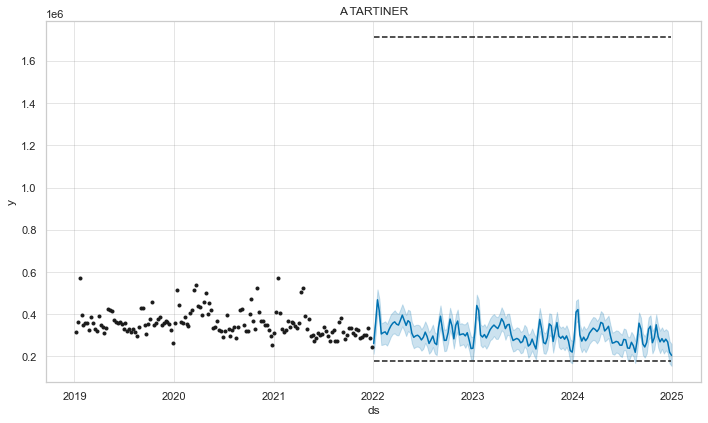

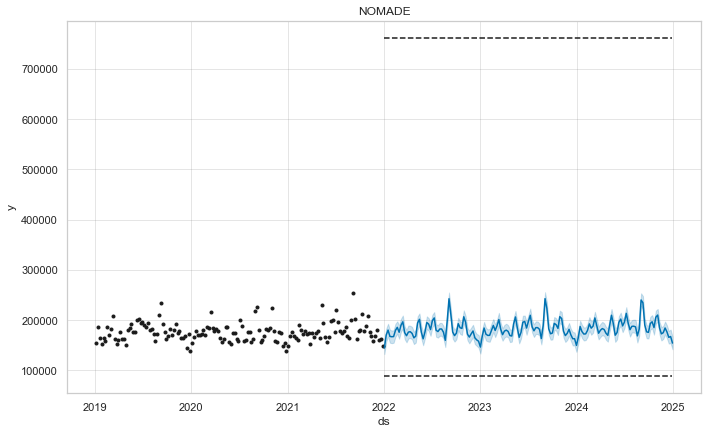

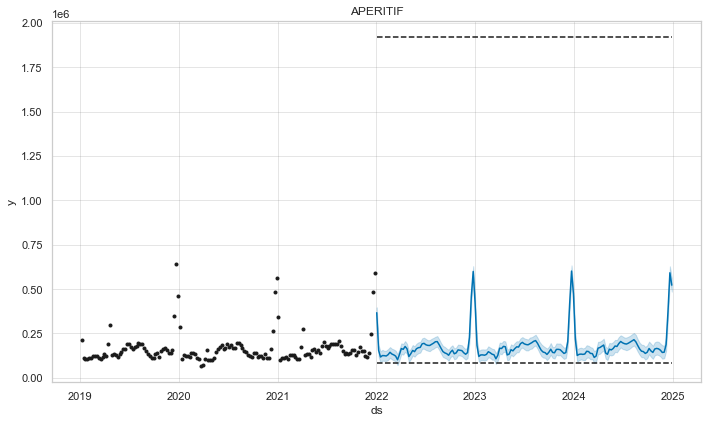

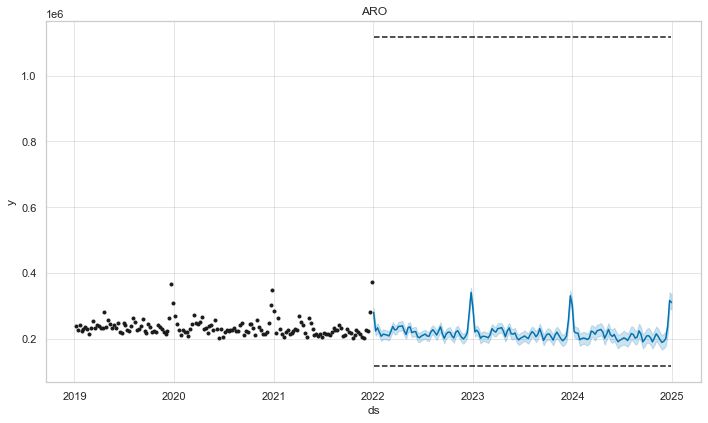

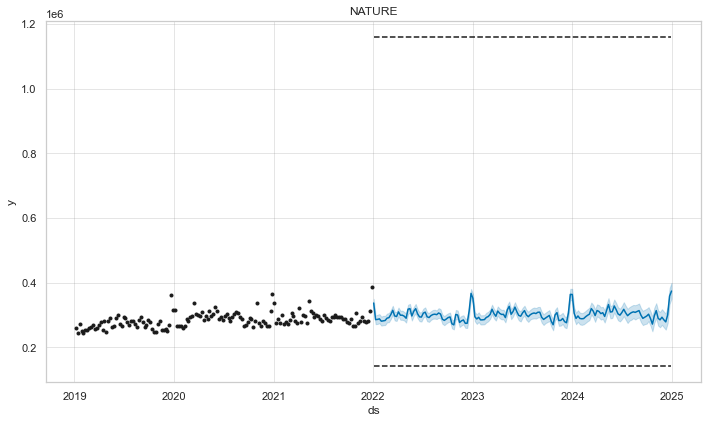

...

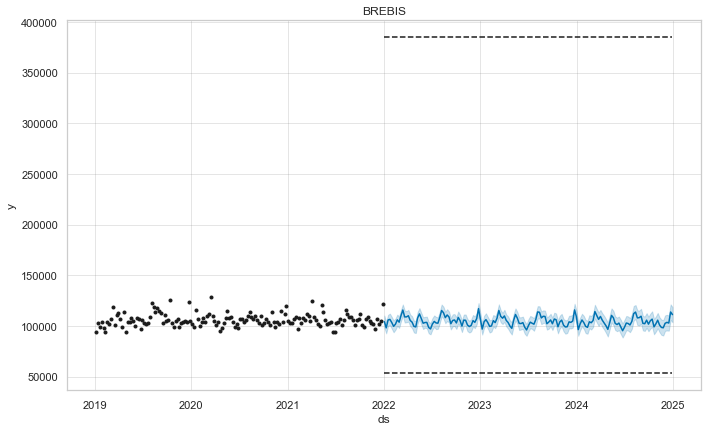

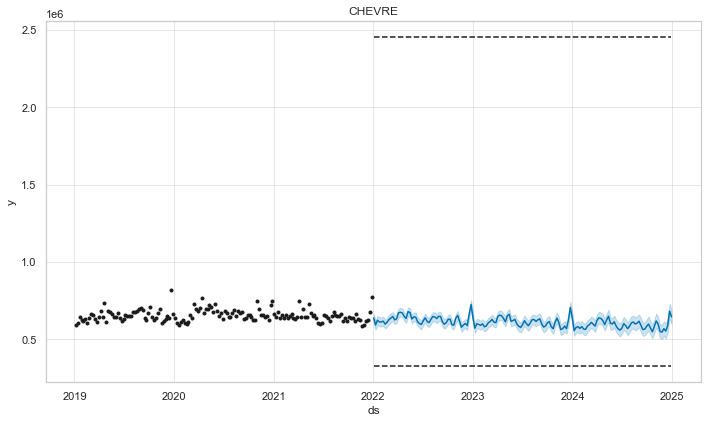

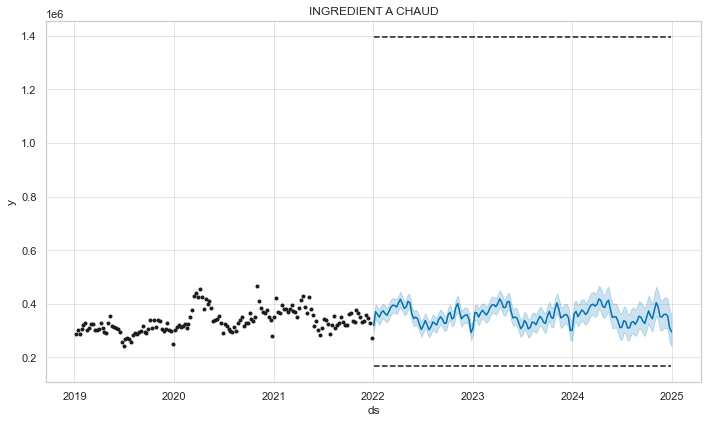

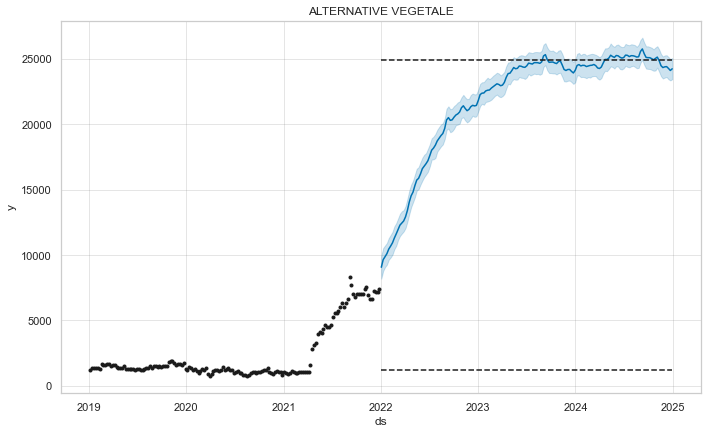

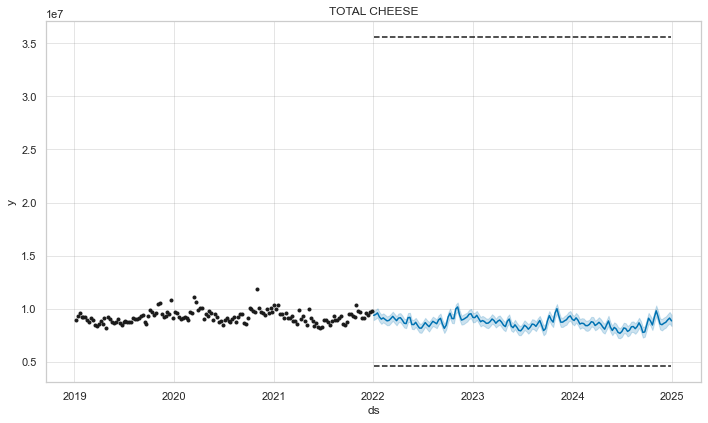

In [16]:
df_markets_fcst_res = forecasting_markets(df_markets, features_markets, periods=157, freq='W')

In [17]:
df_markets_fcst_res.tail()

,Date,A TARTINER,NOMADE,APERITIF,ARO,NATURE,RAPE,CHEVRE&BREBIS,A GOUT,ORIGINAL,...,BLOC,PATE PERSILLEE,CLASSIQUE,AOR REGIONAL,SPECIALITE A GOUT DOUX,BREBIS,CHEVRE,INGREDIENT A CHAUD,ALTERNATIVE VEGETALE,TOTAL CHEESE
308,2024-12-01,268604.334304,184545.736101,144251.838671,192056.410753,284810.537737,1.840234e+06,9841.014671,187082.971799,170034.473348,...,705401.747738,263183.942278,1.231380e+06,492481.382670,397729.783777,102524.466673,567679.474121,359616.556386,24374.502626,8.638839e+06
309,2024-12-08,281913.552334,176819.101883,187590.357235,199783.112387,278368.093925,1.868793e+06,9783.552619,187229.034780,168088.710935,...,698924.087931,279733.935272,1.207497e+06,481297.824497,408377.758059,103502.469079,551809.745626,360307.769290,24394.568690,8.733825e+06
310,2024-12-15,268838.941716,165980.092704,373738.617038,236609.307635,300419.403559,1.836203e+06,9597.740931,180205.340868,164755.193795,...,716301.849560,310084.391644,1.224389e+06,502329.875993,414138.738436,102815.740158,587499.591236,353821.888404,24256.621930,8.952703e+06
311,2024-12-22,220138.779406,167549.920933,591591.210566,316043.473512,358110.490392,1.674123e+06,8879.511424,152413.460447,151651.295680,...,736274.202741,342763.723220,1.212023e+06,592918.562478,458637.689212,113721.426736,681009.564947,309524.918787,24097.456672,9.130810e+06
312,2024-12-29,205418.789338,154535.743787,521858.385733,309717.872245,373759.655540,1.657316e+06,8292.137135,142238.830889,137855.874789,...,655490.791972,314642.364761,1.031157e+06,597963.272096,423596.300160,111142.541944,644039.010087,294598.260349,24225.211549,8.868333e+06


In [219]:
#df_markets_fcst_res.assign(Year=pd.to_datetime(df_markets_fcst_res.Date).dt.year).groupby('Year').sum().T.to_clipboard()

In [18]:
df_markets_fcst_res['Date'] = df_markets_fcst_res.Date.apply(lambda x: x.strftime('%Y-%m-%d'))
df_markets_fcst_res.round(1).to_excel("./results/FR/HMSM/fr_hmsm_usa_markets_forecasts.xlsx", index=False)

In [76]:
df_markets_results = pd.merge(df_gourmet_fcst_res, df_markets_fcst_res, on='Date')
df_markets_results.tail()

,Date,GOURMET BLOCK / WEDGE / ROUND,GOURMET CRUMBLED,GOURMET FRESH ITALIAN,GOURMET SHREDDED / GRATED,GOURMET SPREADS,CLASSIC SPREADS,CREAM CHEESE BLOCKS,CREAM CHEESE TUBS,ENTERTAINING TRAYS,...,EVERYDAY SHREDDED & GRATED,GOURMET,PIMENTO,RICOTTA AND FARMERS,SINGLE SERVE,SLICES,SNACK,SNACKING COMBOS,PLANT BASED,TOTAL CHEESE
361,2024-12-01,1.427448e+06,797798.310339,1.276152e+06,332751.871991,640425.132686,457319.756492,9.335321e+06,3.959608e+06,1.645872e+06,...,2.821070e+07,4.607664e+06,336115.187332,2.122262e+06,609.315736,1.422315e+07,7.314728e+06,4.581783e+06,479116.276372,9.314850e+07
362,2024-12-08,1.411002e+06,793358.807713,1.263219e+06,336799.541064,669862.273462,466362.910776,8.745482e+06,3.966325e+06,1.732246e+06,...,2.778234e+07,4.608752e+06,351566.226454,2.474562e+06,604.470550,1.419426e+07,7.373626e+06,4.727702e+06,474500.465954,9.188077e+07
363,2024-12-15,1.567934e+06,844270.306676,1.478951e+06,361769.869095,822161.719547,539899.423552,9.612026e+06,4.139455e+06,2.167063e+06,...,2.971123e+07,5.210300e+06,379563.625557,3.285347e+06,440.605670,1.436223e+07,7.360306e+06,4.614616e+06,487486.689125,9.793698e+07
364,2024-12-22,1.770080e+06,919427.255980,1.726741e+06,388134.488146,979540.584813,616995.884305,1.091916e+07,4.324110e+06,2.663926e+06,...,3.226533e+07,5.918810e+06,391749.670678,3.917995e+06,96.886920,1.462187e+07,7.283961e+06,4.326532e+06,507043.058425,1.059140e+08
365,2024-12-29,1.791477e+06,961966.501930,1.731182e+06,391959.910474,970586.778792,606311.259774,1.061566e+07,4.324926e+06,2.744565e+06,...,3.280496e+07,5.981270e+06,371538.883583,3.784911e+06,-102.376548,1.482039e+07,7.307407e+06,4.214736e+06,516293.924305,1.068928e+08


In [78]:
df_markets_results = df_markets_results[['Date', 'GOURMET BLOCK / WEDGE / ROUND', 'GOURMET CRUMBLED',
       'GOURMET FRESH ITALIAN', 'GOURMET SHREDDED / GRATED', 'GOURMET SPREADS', 'GOURMET',
       'CLASSIC SPREADS', 'CREAM CHEESE BLOCKS', 'CREAM CHEESE TUBS',
       'ENTERTAINING TRAYS', 'EVERYDAY BLOCKS', 'EVERYDAY SHREDDED & GRATED',
       'PIMENTO', 'RICOTTA AND FARMERS', 'SINGLE SERVE', 'SLICES',
       'SNACK', 'SNACKING COMBOS', 'PLANT BASED', 'TOTAL CHEESE']]

In [79]:
df_markets_results['Date'] = df_markets_results.Date.apply(lambda x: x.strftime('%Y-%m-%d'))

In [80]:
df_markets_results.to_excel("./results/usa_markets_forecasts.xlsx", index=False)

### Growth Drivers Past

- Distribution per : mean
- Price per volume per category : mean
- Competition price per category : mean
- Competition sales per category : sum


In [35]:
def growth_drivers(df_bel, df_markets, df_competition_brands, brands_name, brands_markets, controllable_features=False):
    dict_res = {'xgb_feature_importance': {}, 'permutation_importance': {}}
    competition_feats_cat = ['Competition price', 'Competition sales']
    compet_feats = []
    for brand in tqdm(brands_name, ascii=True, desc='Brands'):
        # Competition features
        feats_cat = [feat+'_'+cat for cat in brands_markets[brand] 
                     for feat in competition_feats_cat]
        
        df_tmp = df_bel[df_bel.Brand == brand]
        
        if not controllable_features:
            df_tmp = pd.merge(df_tmp, df_competition_brands[['Date'] + feats_cat], on='Date')
            df_tmp = pd.merge(df_tmp, df_markets[['Date'] + brands_markets[brand]], on='Date')
        
        if len(df_tmp) == 0:
            continue
        
        # Add competition features if df_tmp is not empty (eg: NURISHH for 2019, 2020, etc...) 
        compet_feats += feats_cat
        
        for key in dict_res:
            dict_res[key][brand] = {}
        
        df_tmp_X = df_tmp.drop(['Date', 'Brand', 'Sales in volume'], axis=1)
        X = df_tmp_X.values
        y = df_tmp['Sales in volume']

        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)
        xgb_model = XGBRegressor()
        xgb_model.fit(X_train, y_train)

        # XGB Feature importance
        feature_importances = xgb_model.feature_importances_
        sorted_idx_feat_imp = feature_importances.argsort()
        perm_importance = permutation_importance(xgb_model, X_test, y_test, n_repeats=25)
        sorted_idx_perm_imp = perm_importance.importances_mean.argsort()
        for idx_fi, idx_pi in zip(sorted_idx_feat_imp, sorted_idx_perm_imp):
            dict_res['xgb_feature_importance'][brand][df_tmp_X.columns[idx_fi]] = feature_importances[idx_fi] * 100
            dict_res['permutation_importance'][brand][df_tmp_X.columns[idx_pi]] = perm_importance['importances_mean'][idx_pi] * 100

    # Set compet feats, cause many brands are in the same markets. 
    # np.delete, in order to remove 'Sales in volume', and [2:], to remove Date and Brand
    if controllable_features:
        ordered_drivers = list(df_bel.columns[2:-1])
    else:
        bel_markets = list(set([elem for brand in dict_res['xgb_feature_importance'] for elem in brands_markets[brand]]))
        ordered_drivers = bel_markets + list(set(compet_feats)) + list(df_bel.columns[2:-1])
        
    print(ordered_drivers)
    for dict_imp in dict_res:
        dict_res[dict_imp] = pd.DataFrame(dict_res[dict_imp]).loc[ordered_drivers]
        
    return dict_res

def compute_growth_drivers_past(df, df_bel, brands_name, features, years=[2018, 2019, 2020, 2021], controllable_features=False):
    """
    """

    brands_markets = {brand: df[df.Brand == brand].Category.unique().tolist() for brand in brands_name}
    # Get markets dataframe
    df_markets = get_df_markets(df)
    # Computing competition price and sales for bel brands
    df_competition_brands = get_df_competition_brands(df, brands_name, features)
    df_competition_brands = df_competition_brands.groupby(['Date', 'Category']).agg(
        {'Price per volume': np.mean, 
         'Sales in volume':  np.sum}).unstack().rename(
        columns={'Price per volume': 'Competition price', 'Sales in volume': 'Competition sales'})
    df_competition_brands.columns = ['_'.join(elem) for elem in df_competition_brands.columns]
    df_competition_brands = df_competition_brands.reset_index()
    dict_res = {year:{} for year in years}
    
    for year in tqdm(years, ascii=True, desc='Years'):
        df_bel_year = df_bel[df_bel.Date.astype('datetime64[ns]').dt.year == year]
        df_compet_year = df_competition_brands[df_competition_brands.Date.astype('datetime64[ns]').dt.year == year]
        df_markets_year = df_markets[df_markets.Date.astype('datetime64[ns]').dt.year == year]
        
        dict_res[year] = growth_drivers(df_bel_year, df_markets_year, 
                                        df_compet_year, brands_name, brands_markets, 
                                        controllable_features=controllable_features)
        
    dict_res['all'] = growth_drivers(df_bel, df_markets, df_competition_brands, 
                                     brands_name, brands_markets, 
                                     controllable_features=controllable_features)
    
    return dict_res

In [28]:
df_bel_hmsm.head()

,Date,Brand,Price per volume,Sales in volume,Sales in value,Distribution,Sell-in,Advertising,Promotion,A&P,MVC,Rate of Innovation,Trends
0,2019-01-06,APERICUBE,13.131324,317063.709040,4.270993e+06,681.779410,1.081436e+06,44.38528,74.99087,29844.0375,627333.873400,0.0,1
1,2019-01-06,BABYBEL,8.278697,31992.483765,2.686242e+05,70.038097,1.508784e+06,683.15914,137.30146,205115.1500,806691.118450,0.0,6
2,2019-01-06,BOURSIN,18.001748,207758.221914,2.881462e+06,192.582568,9.410844e+05,33.81879,133.43824,41814.2575,414141.127425,0.0,32
3,2019-01-06,COUSTERON,7.988248,45179.037323,3.654272e+05,120.191609,1.393531e+05,0.00000,11.92763,2981.9075,24573.224600,0.0,0
4,2019-01-06,KIRI,9.245133,262535.235110,2.394732e+06,171.488026,1.419914e+06,43.41143,123.65016,41765.3975,700810.716475,0.0,27


In [50]:
#bel_features = ['Date', 'Brand', 'A&P', 'Price per volume', 'Rate of Innovation', 'Distribution', 'Trends', 'Sales in volume']
bel_features = ['Date', 'Brand', 'A&P', 'Price per volume', 'Distribution', 'Sales in volume']
dict_res = compute_growth_drivers_past(
    df_hmsm, df_bel_hmsm[bel_features], brands_name[country], features, 
    years=[2019, 2020, 2021], controllable_features=True)

Years:   0%|          | 0/3 [00:00<?, ?it/s]

Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


In [51]:
for year in dict_res:
    pd.DataFrame(dict_res[year]['xgb_feature_importance']).round(1).to_excel("results/FR/HMSM/fr_hmsmgrowth_drivers_past_{}_controllable_features.xlsx".format(year))

In [228]:
#Available importance_types = [‘weight’, ‘gain’, ‘cover’, ‘total_gain’, ‘total_cover’]
xgb_model.get_booster().get_score(importance_type='gain')

{'Price per volume': 0.02084944024682045,
 'AIDE CULINAIRE': 0.009511205367743969,
 'APERITIF & SALADE': 0.013816207647323608,
 'BLEUS & CHEVRES': 0.012448495253920555,
 'BLOC': 0.0030282889492809772,
 'DEGUSTATION': 0.11441913992166519,
 'RAPES': 0.36534491181373596,
 'REPAS CHAUD': 0.005471059586852789,
 'SNACKING': 0.3426344394683838,
 'TARTINES A ETALER': 2.3759751319885254,
 'TARTINES A POSER': 0.007545202970504761,
 'TOTAL CHEESE': 0.008840514346957207}

<Figure size 1152x720 with 0 Axes>

<BarContainer object of 12 artists>

Text(0.5, 0, 'Xgboost Feature Importance')

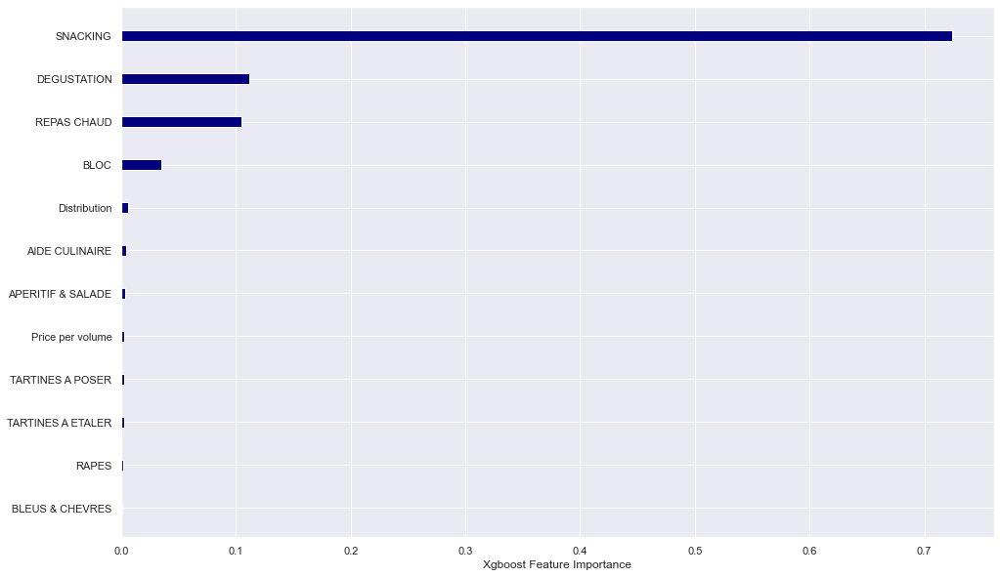

In [233]:
sorted_idx = xgb_model.feature_importances_.argsort()
plt.figure(figsize=(16, 10))
plt.barh(df_gd_past.columns[2:-1][sorted_idx], xgb_model.feature_importances_[sorted_idx], color='navy', height=0.25)
plt.xlabel("Xgboost Feature Importance")

### Growth Drivers Future

In [56]:
df_futures = pd.DataFrame()
for brand in feats_futures:
    #feats_futures[brand]['ds'] = feats_futures[brand]['ds'].apply(lambda x: x.strftime("%Y-%m-%d"))
    df_tmp = pd.merge(feats_futures[brand].rename(columns={'ds':'Date'}), 
                     df_brands_fcst_res[['Date', brand]], on='Date').rename(
        columns={brand: 'Sales in volume'})
    df_tmp['Brand'] = brand
    df_futures = pd.concat([df_futures, df_tmp])

In [57]:
df_futures

,Date,A&P,Price per volume,Distribution,cap,floor,Sales in volume,Brand
0,2019-01-06,29844.037500,13.131324,681.779410,3.188062e+06,57974.15236,317063.709040,APERICUBE
1,2019-01-13,29844.037500,13.640834,638.960597,3.188062e+06,57974.15236,174449.843237,APERICUBE
2,2019-01-20,29844.037500,13.673215,622.723822,3.188062e+06,57974.15236,164711.825455,APERICUBE
3,2019-01-27,29844.037500,13.618310,635.250019,3.188062e+06,57974.15236,165458.787968,APERICUBE
4,2019-02-03,32382.817500,13.066062,650.425689,3.188062e+06,57974.15236,189310.973142,APERICUBE
...,...,...,...,...,...,...,...,...
191,2024-12-01,45184.622896,9.016601,63.043369,2.190720e+04,1.56000,-47815.656707,NURISHH
192,2024-12-08,45312.271238,8.977543,63.333174,2.190720e+04,1.56000,-47376.177331,NURISHH
193,2024-12-15,45439.919581,8.938485,63.622978,2.190720e+04,1.56000,-50098.409557,NURISHH
194,2024-12-22,45567.567923,8.899427,63.912782,2.190720e+04,1.56000,-44879.853904,NURISHH


In [58]:
dict_res_future = compute_growth_drivers_past(
    df_hmsm, df_futures[df_futures.Date > df_bel_hmsm.Date.iloc[-1]][bel_features], brands_name[country], features, 
    years=[2022, 2023, 2024], controllable_features=True)

Years:   0%|          | 0/3 [00:00<?, ?it/s]

Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


In [59]:
for year in dict_res_future:
    pd.DataFrame(dict_res_future[year]['xgb_feature_importance']).round(1).to_excel("results/FR/HMSM/fr_hmsm_growth_drivers_future_{}_controllable_features.xlsx".format(year))

## Ecommerce

In [60]:
df_ecom = pd.read_excel('data/FR/FR_Ecommerce_df_0503.xlsx')

In [113]:
df_bel_ecom = pd.read_excel('data/FR/FR_Ecommerce_df_bel_0503.xlsx')

In [94]:
df_ecom.describe()
df_bel_ecom.describe()

,Sales in value,Sales value with promo,Sales in volume,Sales volume with promo,Price with promo,Price without promo,Price per volume,Distribution
count,87318.000000,45639.000000,87318.000000,45639.000000,45639.000000,87250.000000,87318.000000,87318.000000
mean,17811.651507,5619.520280,1945.077006,619.173030,11.958159,14.231506,14.179536,51.781682
std,47890.459710,16681.448253,6024.294438,2086.077772,5.025813,6.712164,6.710862,90.240019
min,0.600000,0.990000,0.030000,0.035000,2.727273,1.530000,1.530000,0.000243
25%,199.602500,50.880000,12.480000,4.200000,8.461648,9.699861,9.642530,1.443442
50%,1696.250000,534.870000,126.635000,48.600000,10.984694,12.993094,12.944927,10.011376
75%,12853.159999,4082.810000,1143.100000,390.085000,14.138450,16.872630,16.800000,64.958532
max,881301.979961,492829.490000,135140.850000,75366.500000,79.333333,98.333333,98.333333,771.948480


,Price per volume,Sales in volume,Sales in value,Distribution,Sell-in,Advertising,Promotion,A&P,MVC,Rate of Innovation,Trends
count,1131.000000,1.131000e+03,1.131000e+03,1131.000000,1.131000e+03,1131.000000,1131.000000,1131.000000,1.131000e+03,1131.000000,1131.000000
mean,11.316930,2.059375e+05,2.061319e+06,223.351857,7.843734e+05,180.622067,78.917489,60601.423943,3.535625e+05,0.138766,19.029178
std,3.109416,2.011638e+05,1.821819e+06,259.278678,6.832544e+05,259.521523,82.219050,76167.712017,3.589814e+05,0.256827,18.641519
min,7.455859,3.120000e+00,6.182000e+01,0.069546,0.000000e+00,0.000000,0.000000,0.000000,-7.280536e+04,0.000000,0.000000
25%,8.415657,4.616194e+04,3.798643e+05,105.098941,1.564890e+05,1.736320,5.521730,1862.355000,8.706222e+03,0.000000,2.000000
50%,10.532511,1.834401e+05,2.337994e+06,146.837231,9.077547e+05,60.361050,67.464230,36038.510000,4.100455e+05,0.000000,14.000000
75%,13.747022,2.658159e+05,3.167691e+06,171.314276,1.268155e+06,262.149320,129.237125,86617.392500,6.180112e+05,0.126127,31.000000
max,21.725000,1.062687e+06,1.400707e+07,1122.361977,3.595951e+06,1211.803060,365.292730,350675.730000,1.971895e+06,0.937351,100.000000


### Forecasting Brands

#### No regressors

Features:   0%|          | 0/8 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value inste

Initial log joint probability = -15.1164
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       393.773    0.00289778       69.9713      0.3968           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     153        400.53     0.0139183       135.476   0.0001089       0.001      229  LS failed, Hessian reset 
     199       401.175   1.58858e-07       74.4692      0.8132      0.8132      295   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     211       401.175    7.3921e-09       75.3186      0.2436      0.6011      317   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -172.616
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       146.424     0.0015829       1772.22     0.07361           1      150   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       148.937   6.61184e-05       335.669      0.2729      0.2729      305   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       149.001   3.55381e-06       86.7307   2.414e-08       0.001      362  LS failed, Hessian reset 
     255       149.202   2.68179e-06       75.6087    3.72e-08       0.001      474  LS failed, Hessian reset 
     280       149.216   5.05787e-05       126.517   6.146e-07       0.001      542  LS failed, Hessian reset 
     299       149.219    4.5711e-06       82.8618      0.8605      0.8605      568   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -9.27171
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       324.889     0.0309387       78.3065      0.1772           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       331.868    0.00168335        37.956      0.7826      0.7826      263   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     293        332.16   2.09365e-06       46.3912   3.177e-08       0.001      452  LS failed, Hessian reset 
     299        332.16   1.68677e-07       70.5096      0.2204           1      461   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     306        332.16   3.85529e-09       36.9303     0.02787           1      474   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -6.56002
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      50       283.882   0.000450965       71.3538   7.686e-06       0.001      106  LS failed, Hessian reset 
      99       284.018     0.0005546       63.4692     0.04736           1      193   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102        284.03   0.000746545       45.8394   1.019e-05       0.001      237  LS failed, Hessian reset 
     199       284.163   7.13492e-05       74.2407      0.5839      0.5839      383   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     208       284.174   0.000121132       60.7452    1.78e-06       0.001      463  LS failed, Hessian reset 
     266       284.179   6.08638e-06       67.8614    9.09e-08       0.001      597  LS failed, Hessian reset 
     278       284.179   2.35475e-09       60.9139     0.04164   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -7.5159
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      74       272.952     0.0176642       103.566   0.0001907       0.001      131  LS failed, Hessian reset 
      99       273.611   0.000110905       80.5621           1           1      166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     178       273.708   0.000724639       82.7651   7.481e-06       0.001      323  LS failed, Hessian reset 
     199       273.737   1.71403e-05       89.4303           1           1      354   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     239       273.738   2.66109e-06       84.3483   2.835e-08       0.001      437  LS failed, Hessian reset 
     269       273.739   1.45873e-08        72.479      0.6781      0.6781      474   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is 

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -11.033
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       245.784   0.000957895       87.3584   1.104e-05       0.001      159  LS failed, Hessian reset 
      99       245.856   4.74987e-05       64.0397      0.3751           1      175   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     198       245.989   0.000387075       79.3095   4.091e-06       0.001      386  LS failed, Hessian reset 
     199       245.995   0.000218942       89.1027           1           1      387   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     271       246.112   6.60393e-09       71.8355      0.3807      0.3807      478   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -6.27897
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       268.146   0.000589288       93.5373      0.4519      0.4519      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       268.208   7.09132e-09       88.4168      0.4558      0.4558      191   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -8.71295
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      50       322.719   0.000942663       60.0544   1.191e-05       0.001      114  LS failed, Hessian reset 
      94       323.015    0.00248446       100.263   3.398e-05       0.001      216  LS failed, Hessian reset 
      99       323.137   0.000532304       63.6802           1           1      222   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       323.169   3.10936e-09       52.6355      0.1892      0.1892      295   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


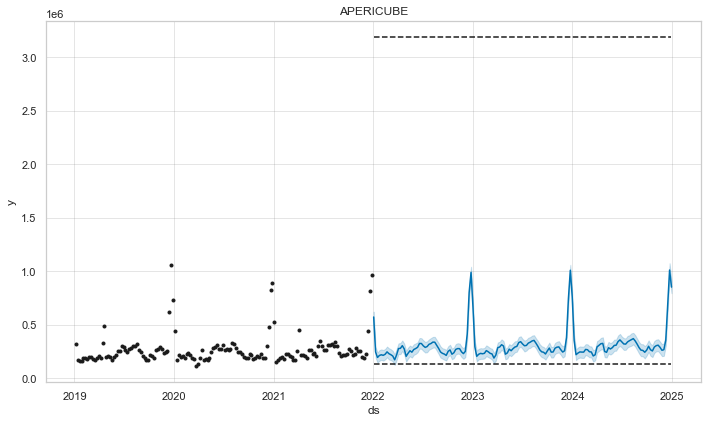

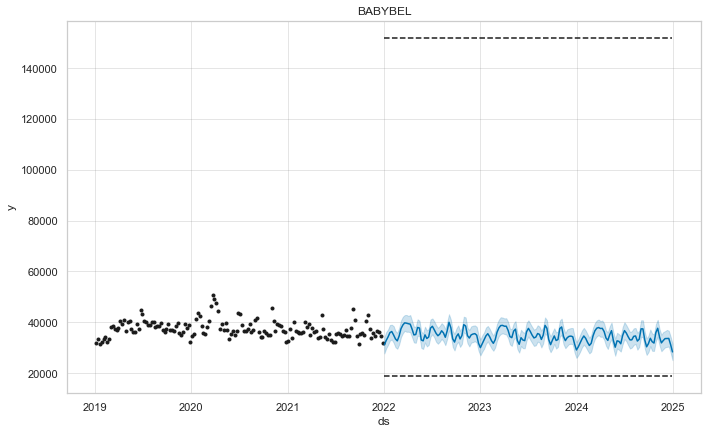

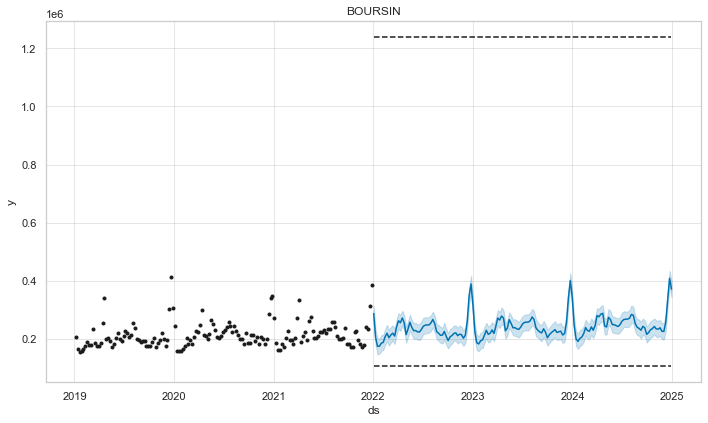

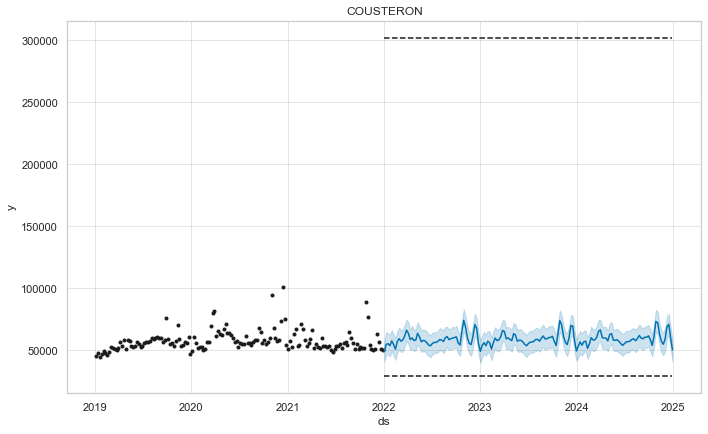

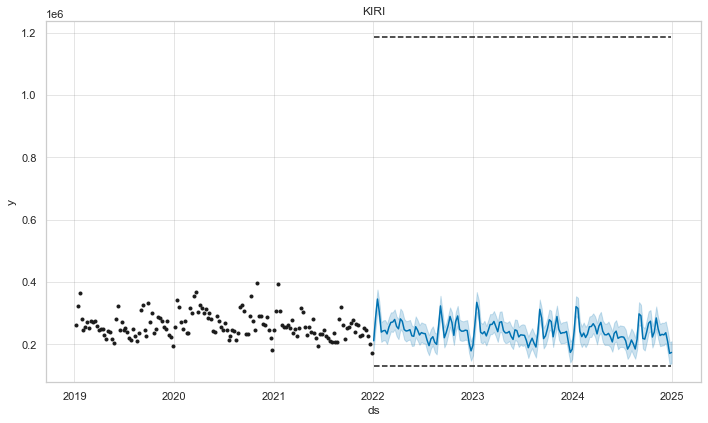

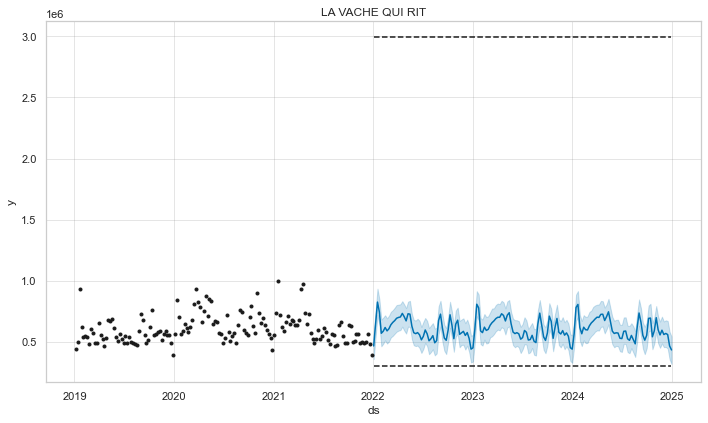

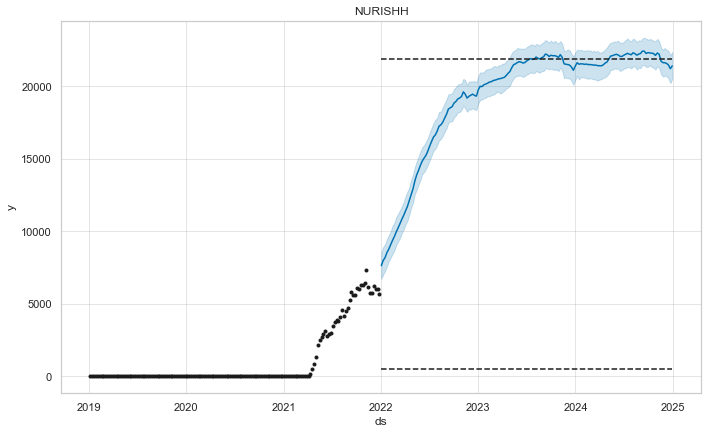

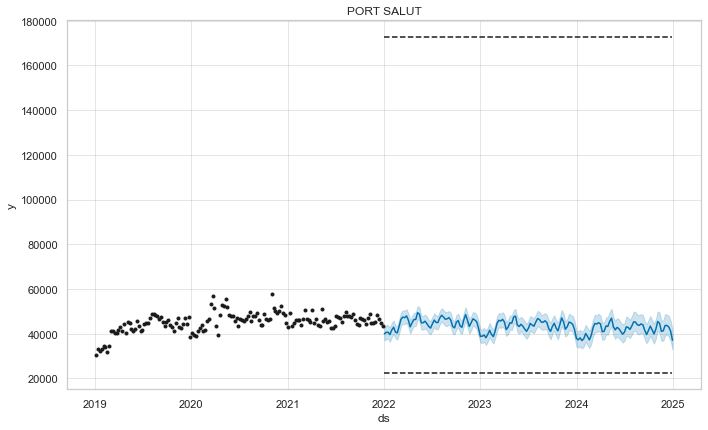

In [63]:
df_bel_brands = df_bel_ecom.groupby(["Date", "Brand"]).agg('sum')['Sales in volume'].unstack().reset_index()
df_bel_brands.columns.name=''
df_bel_brands = df_bel_brands.fillna(0)
df_bel_brands_fcst_res = forecasting_features(df_bel_brands, list(df_bel_brands.columns[1:]), periods=157, freq='W')

array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
      dtype=object)

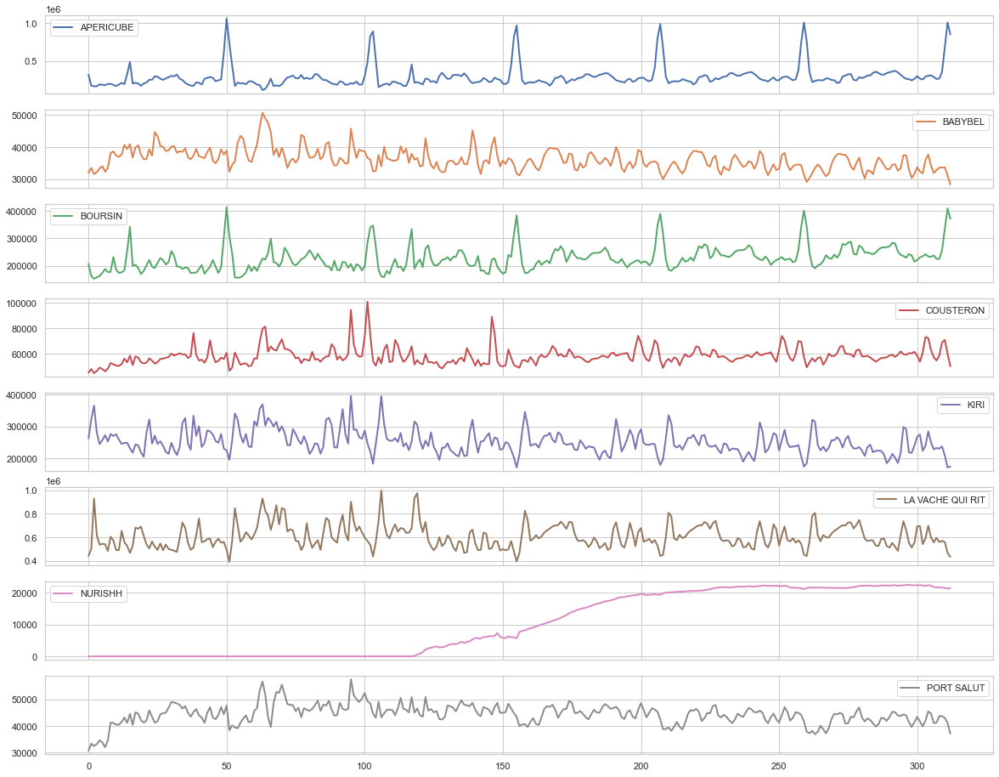

In [64]:
df_bel_brands_fcst_res.iloc[:, 1:].plot(subplots=True, linewidth=2, figsize=(20, 16))

In [65]:
df_bel_brands_fcst_res['Date'] = df_bel_brands_fcst_res.Date.apply(lambda x: x.strftime('%Y-%m-%d'))
df_bel_brands_fcst_res.round(1).to_excel("results/FR/Ecommerce/fr_ecom_brands_forecasts_no_regressors.xlsx", index=False)

#### With Regressors

In [67]:
df_bel_ecom['Trends'] = df_bel_ecom.apply(lambda x: df_trends[df_trends.Date == x.Date][x.Brand].values[0], axis=1)
df_bel_ecom.fillna(0, inplace=True)
df_bel_ecom.head()

,Date,Brand,Price per volume,Sales in volume,Sales in value,Distribution,Sell-in,Advertising,Promotion,A&P,MVC,Rate of Innovation,Trends
0,2019-01-06,APERICUBE,13.131324,317063.709040,4.270993e+06,681.779410,1.081436e+06,44.38528,74.99087,29844.0375,627333.873400,0.0,1
1,2019-01-06,BABYBEL,8.278697,31992.483765,2.686242e+05,70.038097,1.508784e+06,683.15914,137.30146,205115.1500,806691.118450,0.0,6
2,2019-01-06,BOURSIN,18.001748,207758.221914,2.881462e+06,192.582568,9.410844e+05,33.81879,133.43824,41814.2575,414141.127425,0.0,32
3,2019-01-06,COUSTERON,7.988248,45179.037323,3.654272e+05,120.191609,1.393531e+05,0.00000,11.92763,2981.9075,24573.224600,0.0,0
4,2019-01-06,KIRI,9.245133,262535.235110,2.394732e+06,171.488026,1.419914e+06,43.41143,123.65016,41765.3975,700810.716475,0.0,27


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -12.3186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       218.535   0.000304039       97.6161      0.1724           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       218.586   0.000100481       93.5579   1.013e-06       0.001      203  LS failed, Hessian reset 
     154       218.601   1.58795e-05       102.379   1.751e-07       0.001      268  LS failed, Hessian reset 
     185       218.602    1.5617e-06       103.251   1.543e-08       0.001      354  LS failed, Hessian reset 
     199       218.603   4.67771e-08        90.645      0.2968           1      375   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     214       218.603   3.84927e-07       104.267   4.141e-09       0.001      434  LS failed, Hessian reset 
     219       218.603   8.75112e-09        88.337      0.1501   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.13249
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       608.655    0.00199794       163.276      0.6209           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     183       608.881   9.71318e-09       57.8098     0.02111           1      241   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.54068
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       451.705     0.0137765       333.316       0.715       0.715      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       452.246    0.00128717       145.308   1.402e-05       0.001      191  LS failed, Hessian reset 
     145       453.395   0.000270015       84.1981   4.281e-06       0.001      270  LS failed, Hessian reset 
     199       453.524   8.95512e-05       57.3319           1           1      343   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     242       453.779   0.000780759       82.1732   1.157e-05       0.001      440  LS failed, Hessian reset 
     299       453.892   9.84419e-05       46.0997           1           1      512   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -13.8555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       425.074    0.00138563       85.7598      0.7237      0.7237      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       429.661   8.94202e-05       79.5809       0.642       0.642      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     274       432.036    0.00203324       79.1778    2.08e-05       0.001      359  LS failed, Hessian reset 
     299       432.189   8.53754e-05       66.4715      0.7267      0.7267      391   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       433.165   0.000463337       112.264      0.3833      0.3833      507   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499        434.69   7.55085e-06    

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -7.06361
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       204.384   2.50081e-06       94.7404      0.2631           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       204.448   0.000434347       62.9203      0.7964      0.7964      251   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     212       204.571   0.000773406       80.4335   8.876e-06       0.001      331  LS failed, Hessian reset 
     299       204.718   3.26949e-07        64.051       3.186      0.7769      445   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     319       204.718   2.57847e-07       80.7083   2.751e-09       0.001      510  LS failed, Hessian reset 
     331       204.718   3.78643e-09       90.5905      0.3024      0.3024      526   
Optimization terminat

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.02611
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       833.652    0.00120046       1121.09      0.3645      0.3645      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       837.886   0.000608105       341.078           1           1      247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       838.413   8.03242e-05       83.1635      0.6131      0.6131      361   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399           839   0.000134092       331.305      0.8762      0.8762      480   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     465       839.157   3.70921e-06       104.862   1.646e-08       0.001      605  LS failed, Hessian reset 
     499       839.235   3.00434e-05    

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -4.40229
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       398.933    0.00311496       81.4035      0.7287      0.7287      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       401.158   0.000361666       47.6552   3.487e-06       0.001      200  LS failed, Hessian reset 
     199       403.979   0.000800428       87.1085      0.5151      0.5151      291   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       410.835    0.00281032       77.7215           1           1      411   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     303        410.96   0.000937097       94.9488    9.76e-06       0.001      454  LS failed, Hessian reset 
     382       411.717   1.09391e-08       64.5688      0.0341      0.8528      554   
Optimization terminat

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -203.243
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       159.781   0.000690748       116.417    0.004442           1      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       161.115   2.02442e-05        414.78   2.842e-07       0.001      290  LS failed, Hessian reset 
     198        161.57   1.14417e-06       59.2741   1.043e-08       0.001      398  LS failed, Hessian reset 
     199       161.572   5.43388e-05        55.341         100           1      401   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       161.635   1.52657e-06       86.6958   1.149e-08       0.001      509  LS failed, Hessian reset 
     250       161.661    1.1865e-06       65.4199   1.274e-08       0.001      584  LS failed, Hessian reset 
     288       161.672   4.22858e-06       65.4918   8.205e-09   

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -14.602
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       213.874   3.97375e-07        88.114      0.2991      0.2991      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       213.874   9.59661e-09       91.7969      0.1837      0.1837      139   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.1815
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       528.297    0.00500438       359.735           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       532.707    0.00021758       153.317   3.076e-06       0.001      202  LS failed, Hessian reset 
     199        536.05   0.000388405       72.2533           1           1      277   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        537.98    0.00226114        124.56      0.2574           1      426   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     331       538.496   0.000193281       139.267   4.541e-07       0.001      505  LS failed, Hessian reset 
     399       539.181   8.03088e-05       89.1636           1           1      593   
    Iter      log prob

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.45237
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      66       400.004    0.00386608       112.405   4.562e-05       0.001      132  LS failed, Hessian reset 
      99       400.234   2.60078e-06       52.3466      0.5606      0.5606      181   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       400.238   3.68203e-05       66.7269   6.306e-07       0.001      233  LS failed, Hessian reset 
     137        400.24   4.47416e-06       60.3833   7.189e-08       0.001      318  LS failed, Hessian reset 
     157        400.24   2.01531e-08       63.7269      0.1816           1      350   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -8.25546
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       373.528   4.14332e-09       88.3489      0.2565      0.2565      109   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -9.21343
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       234.789   0.000149402       60.2026       2.476           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       234.823    0.00029197       68.4479   3.895e-06       0.001      206  LS failed, Hessian reset 
     170       234.833   2.89966e-08       56.4142      0.1749           1      270   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.03169
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       662.599   0.000503139       172.239           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       662.814   2.26971e-05       73.7487   1.792e-07       0.001      212  LS failed, Hessian reset 
     166       663.139   0.000394401       158.564   4.864e-06       0.001      284  LS failed, Hessian reset 
     199       663.298   0.000346327       112.613           1           1      326   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     268        663.65   3.45774e-05        123.56   2.334e-07       0.001      463  LS failed, Hessian reset 
     299       663.748   6.88582e-05       78.8107           1           1      504   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.28979
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       454.727    0.00455061       116.297      0.6826      0.6826      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       459.346   0.000250583       57.1976           1           1      250   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     221       459.655   0.000621229       95.3363   8.138e-06       0.001      339  LS failed, Hessian reset 
     280       459.806   0.000175407       67.5396   3.102e-06       0.001      448  LS failed, Hessian reset 
     299       459.816   1.09875e-06       62.7801      0.9533      0.3227      478   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       460.725     0.0206823       88.4717      0.8574      0.8574      609   
    Iter      log pro

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -6.81905
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78       319.006    0.00143294       231.049   1.693e-05       0.001      137  LS failed, Hessian reset 
      99       319.262   9.88904e-05       63.8789           1           1      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     182       319.636   0.000494425       131.303   5.603e-06       0.001      308  LS failed, Hessian reset 
     199       319.744   3.01689e-05       63.0182      0.7285      0.7285      333   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     260        319.76   5.17421e-05       82.7432   6.603e-07       0.001      450  LS failed, Hessian reset 
     299       319.768   1.24648e-06       61.3931     0.04476      0.8293      503   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -8.72133
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      66       191.075    0.00019982       96.1303   1.947e-06       0.001      119  LS failed, Hessian reset 
      99        191.12   5.59438e-06       99.9037      0.7545      0.7545      157   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       191.161   2.05705e-08        99.651       0.357       0.357      291   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205       191.161   6.42479e-09       98.6385      0.2901           1      299   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.5688
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       571.017    0.00349029       201.547      0.3467      0.3467      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       588.255    0.00164716        316.75       0.647       0.647      255   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        593.58    0.00233163       141.765      0.9996      0.9996      384   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       598.949    0.00193021       206.107           1           1      507   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     490        602.42   0.000112168        151.13   2.064e-07       0.001      659  LS failed, Hessian reset 
     499       603.669    0.00435216     

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.44391
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      62       457.329   0.000267303       51.9366   4.983e-06       0.001      132  LS failed, Hessian reset 
      88       457.393   2.65459e-05       46.2501   4.393e-07       0.001      214  LS failed, Hessian reset 
      99       457.394   1.70035e-05       54.7535       3.746      0.3746      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       457.448   0.000247613       60.9008   3.849e-06       0.001      340  LS failed, Hessian reset 
     199       457.484   8.49326e-05       52.6634           1           1      426   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       457.488   2.64393e-07       51.6067   5.028e-09       0.001      516  LS failed, Hessian reset 
     231       457.488   1.26527e-07       35.7833    3.18e-09   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -5.75142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      61       309.771   0.000456756       52.1485   7.819e-06       0.001      115  LS failed, Hessian reset 
      99       310.207   0.000135819       63.3405       1.061      0.2819      163   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       310.222   9.91177e-09       46.1006      0.1566      0.1566      248   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/prophet/plot.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
/U

Initial log joint probability = -2.04025
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       666.248     0.0021059       184.505           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     166       666.848   2.94739e-05       102.247   1.624e-07       0.001      265  LS failed, Hessian reset 
     199        666.96   0.000125823       94.1575           1           1      310   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     207       666.972   3.32349e-05       110.552    4.13e-07       0.001      365  LS failed, Hessian reset 
     299       667.101   0.000348978       93.0028           1           1      480   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     366       667.153   2.63456e-05       96.0221   2.678e-07       0.001      613  LS failed, Hessian rese

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.55662
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

      90       425.679    0.00110012        84.112    1.78e-05       0.001      171  LS failed, Hessian reset 
      99       425.785   0.000301326       70.9323           1           1      183   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       426.172   0.000722626       95.2639   7.817e-06       0.001      277  LS failed, Hessian reset 
     199       426.309   2.86802e-05       69.4623           1           1      358   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     207       426.318   4.60247e-05       57.0264   7.688e-07       0.001      400  LS failed, Hessian reset 
     251       426.322   2.17603e-06       66.5656   3.008e-08       0.001      494  LS failed, Hessian reset 
   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -10.098
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       284.991   8.46209e-07       80.7566      0.3421           1      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       284.991    2.0283e-07       80.9129   2.341e-09       0.001      225  LS failed, Hessian reset 
     145       284.991   1.25855e-08       74.4311       0.529           1      240   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -14.533
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        246.42   1.39251e-05       87.0546      0.5863      0.5863      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       246.437   1.04133e-07       95.4217       0.192           1      259   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205       246.437   8.95836e-09       91.3684      0.4815      0.4815      266   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.02075
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       896.223    0.00128491       628.631           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       899.356   5.58291e-05         134.1           1           1      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        900.33   0.000410434       234.849      0.9405      0.9405      363   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       900.998   0.000544814       244.427           1           1      476   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       901.599   6.97528e-07       119.404     0.02741     0.02741      610   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -3.24695
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       429.266    0.00471674       204.968      0.3254      0.3254      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       434.071   0.000527145       125.864   5.797e-06       0.001      238  LS failed, Hessian reset 
     199       434.988    0.00101695       78.7838      0.2868      0.2868      306   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     214       435.825   0.000424297       139.556   3.962e-06       0.001      359  LS failed, Hessian reset 
     299       438.109    0.00384888       97.3195      0.7831      0.7831      463   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     369       441.266   0.000425153       155.553   3.723e-06       0.001      584  LS failed, Hessian rese

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -6.39108
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       377.986   0.000250948       67.3246   4.921e-06       0.001      155  LS failed, Hessian reset 
      99       378.004   3.80506e-06        85.007      0.3138      0.3138      178   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     150        378.06   0.000422168       85.4399   5.314e-06       0.001      293  LS failed, Hessian reset 
     199       378.147   0.000110741       63.4034      0.8014      0.8014      361   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     241       378.382    0.00152515       144.804   1.265e-05       0.001      449  LS failed, Hessian reset 
     299       378.543   0.000257729       65.6222           1           1      536   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.



Initial log joint probability = 11.6429
Iteration  1. Log joint probability =    7.78044. Improved by -3.86246.
Iteration  2. Log joint probability =    9.72857. Improved by 1.94813.
Iteration  3. Log joint probability =    14.1494. Improved by 4.42087.
Iteration  4. Log joint probability =    14.1992. Improved by 0.0497439.
Iteration  5. Log joint probability =    14.2519. Improved by 0.0527155.
Iteration  6. Log joint probability =    14.3276. Improved by 0.0756841.
Iteration  7. Log joint probability =    14.3864. Improved by 0.0588162.
Iteration  8. Log joint probability =    14.4171. Improved by 0.0307407.
Iteration  9. Log joint probability =    14.4579. Improved by 0.0407684.
Iteration 10. Log joint probability =    14.5695. Improved by 0.111556.
Iteration 11. Log joint probability =     14.729. Improved by 0.159503.
Iteration 12. Log joint probability =    14.8793. Improved by 0.150319.
Iteration 13. Log joint probability =    14.9293. Improved by 0.0500336.
Iteration 14. Log 

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_


Initial log joint probability = 13.0668
Iteration  1. Log joint probability =    5.25503. Improved by -7.81175.
Iteration  2. Log joint probability =    26.0459. Improved by 20.7908.
Iteration  3. Log joint probability =    26.0703. Improved by 0.0244204.
Iteration  4. Log joint probability =    26.0939. Improved by 0.0236651.
Iteration  5. Log joint probability =    26.1063. Improved by 0.0123872.
Iteration  6. Log joint probability =    26.1594. Improved by 0.0531149.
Iteration  7. Log joint probability =    26.1733. Improved by 0.0138138.
Iteration  8. Log joint probability =    26.2432. Improved by 0.0699212.
Iteration  9. Log joint probability =    26.2444. Improved by 0.00121436.
Iteration 10. Log joint probability =    26.3474. Improved by 0.103024.
Iteration 11. Log joint probability =    26.3593. Improved by 0.0119155.
Iteration 12. Log joint probability =    26.3783. Improved by 0.018953.
Iteration 13. Log joint probability =    26.4479. Improved by 0.0696216.
Iteration 14. 

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_


Initial log joint probability = 12.892
Iteration  1. Log joint probability =    28.9716. Improved by 16.0796.
Iteration  2. Log joint probability =    52.4637. Improved by 23.4921.
Iteration  3. Log joint probability =    75.6447. Improved by 23.181.
Iteration  4. Log joint probability =    76.4463. Improved by 0.801611.
Iteration  5. Log joint probability =    78.8134. Improved by 2.36705.
Iteration  6. Log joint probability =    78.8302. Improved by 0.0168504.
Iteration  7. Log joint probability =    79.0078. Improved by 0.177555.
Iteration  8. Log joint probability =    79.1394. Improved by 0.131587.
Iteration  9. Log joint probability =    79.1952. Improved by 0.0558715.
Iteration 10. Log joint probability =    79.3777. Improved by 0.182428.
Iteration 11. Log joint probability =    79.4395. Improved by 0.0618211.
Iteration 12. Log joint probability =      79.45. Improved by 0.0105498.
Iteration 13. Log joint probability =    79.4558. Improved by 0.00572949.
Iteration 14. Log joint

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.



Initial log joint probability = -127.003
Iteration  1. Log joint probability =    4.78385. Improved by 131.787.
Iteration  2. Log joint probability =    55.2448. Improved by 50.4609.
Iteration  3. Log joint probability =    78.4131. Improved by 23.1683.
Iteration  4. Log joint probability =    105.911. Improved by 27.4977.
Iteration  5. Log joint probability =    121.046. Improved by 15.1349.
Iteration  6. Log joint probability =    141.238. Improved by 20.1924.
Iteration  7. Log joint probability =    154.745. Improved by 13.5073.
Iteration  8. Log joint probability =    162.089. Improved by 7.34374.
Iteration  9. Log joint probability =     173.09. Improved by 11.0006.
Iteration 10. Log joint probability =    200.341. Improved by 27.2516.
Iteration 11. Log joint probability =    212.324. Improved by 11.9821.
Iteration 12. Log joint probability =    212.324. Improved by 0.000332502.
Iteration 13. Log joint probability =    212.334. Improved by 0.00998863.
Iteration 14. Log joint prob

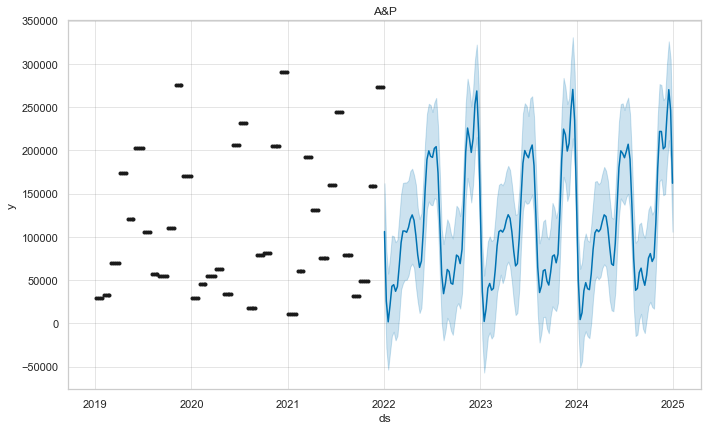

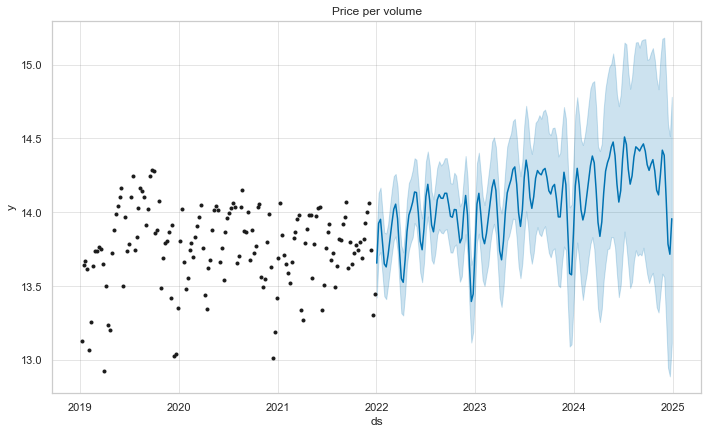

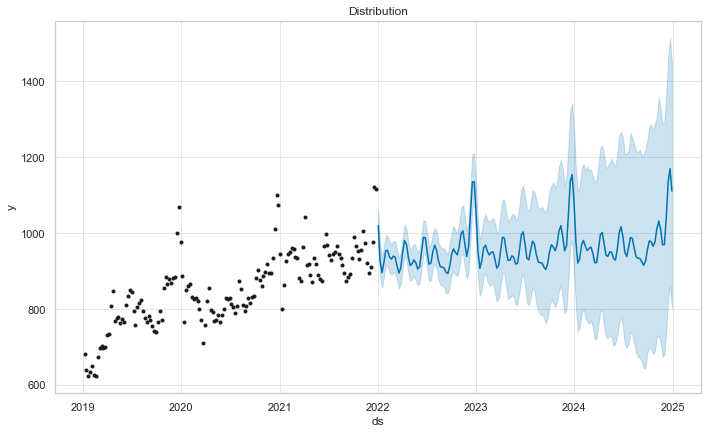

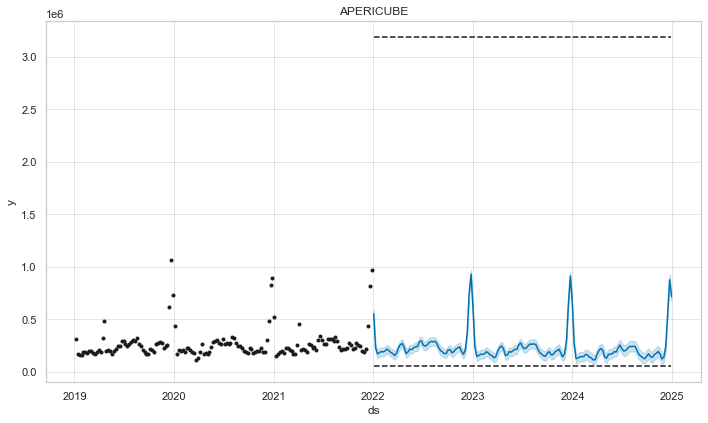

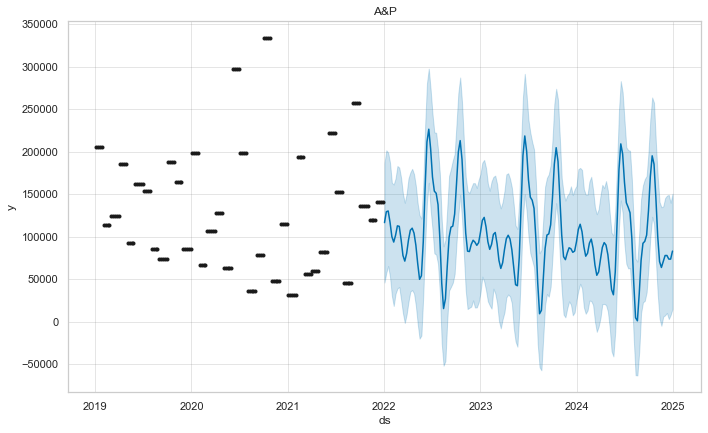

...

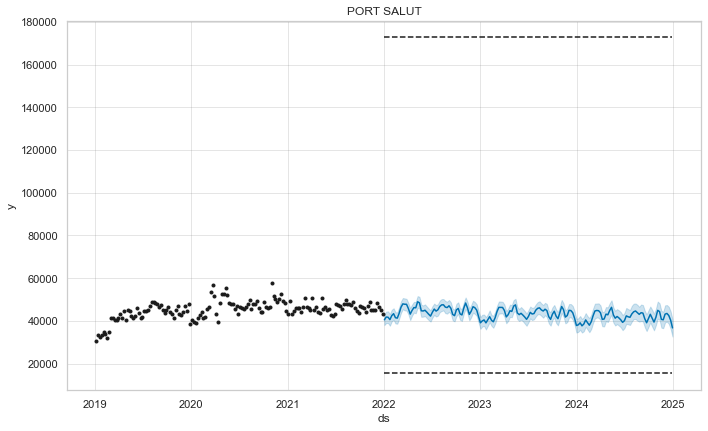

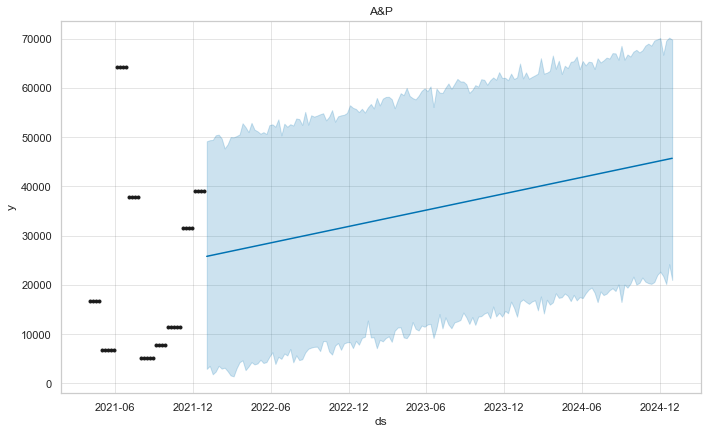

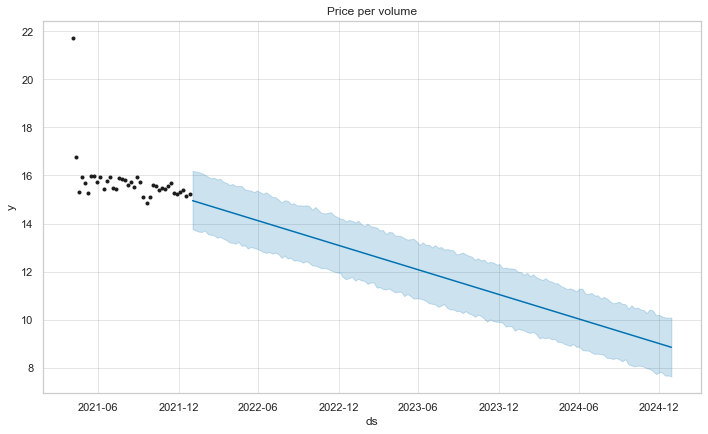

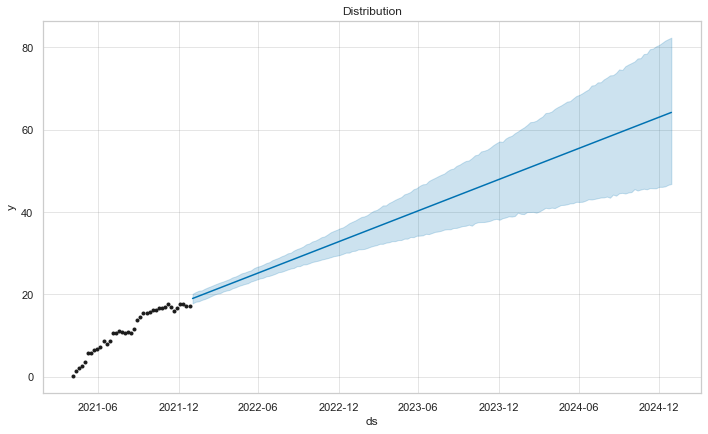

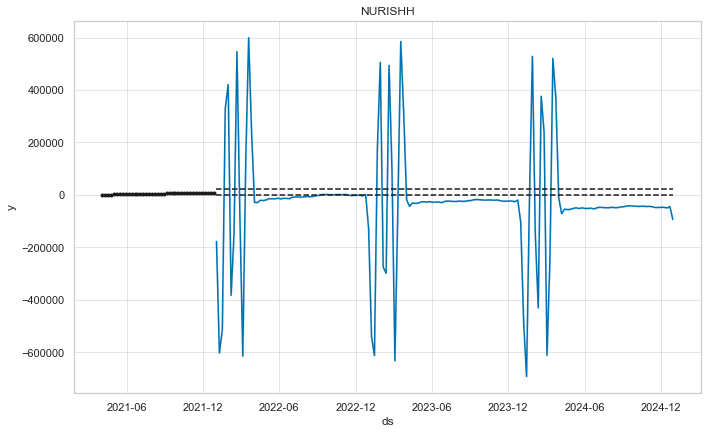

In [68]:
features_name = ['A&P', 'Price per volume', 'Distribution']
feats_futures, df_brands_fcst_res = forecasting_brands(df_bel_ecom, brands_name[country], features_name, periods=157, freq='W')

In [69]:
df_brands_fcst_res

,Date,APERICUBE,BABYBEL,BOURSIN,COUSTERON,KIRI,LA VACHE QUI RIT,PORT SALUT,NURISHH
0,2019-01-06,317063.709040,31992.483765,207758.221914,45179.037323,262535.235110,442844.844969,30668.396486,NaN
1,2019-01-13,174449.843237,33491.827850,163368.285736,47969.232664,321561.565615,502952.464256,33339.981047,NaN
2,2019-01-20,164711.825455,31584.829494,153203.820587,44734.434229,365251.136687,929845.271817,32469.477599,NaN
3,2019-01-27,165458.787968,32156.818602,158320.904898,46480.115556,280757.979905,618859.504353,33135.705606,NaN
4,2019-02-03,189310.973142,33366.944630,163540.468899,49107.726452,244565.342242,537446.522657,34566.752297,NaN
...,...,...,...,...,...,...,...,...,...
308,2024-12-01,141176.451276,31147.273968,302305.324210,39550.623765,265487.459689,279324.065561,43146.517693,-47815.656707
309,2024-12-08,241947.023351,31292.507654,333833.667336,50610.838180,270621.827964,288414.022657,43447.673091,-47376.177331
310,2024-12-15,555931.594063,31239.366954,405520.574828,49169.219149,241235.244232,269761.236608,42497.611964,-50098.409557
311,2024-12-22,878531.641933,28809.211866,480057.889537,39363.984811,205389.224370,173921.650997,40326.721836,-44879.853904


In [70]:
df_brands_fcst_res.fillna(0, inplace=True)
df_brands_fcst_res['Date'] = df_brands_fcst_res.Date.apply(lambda x: x.strftime('%Y-%m-%d'))
df_brands_fcst_res.round(1).to_excel("results/FR/Ecommerce/fr_ecom_brands_forecasts_with_regressors.xlsx", index=False)

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
      dtype=object)

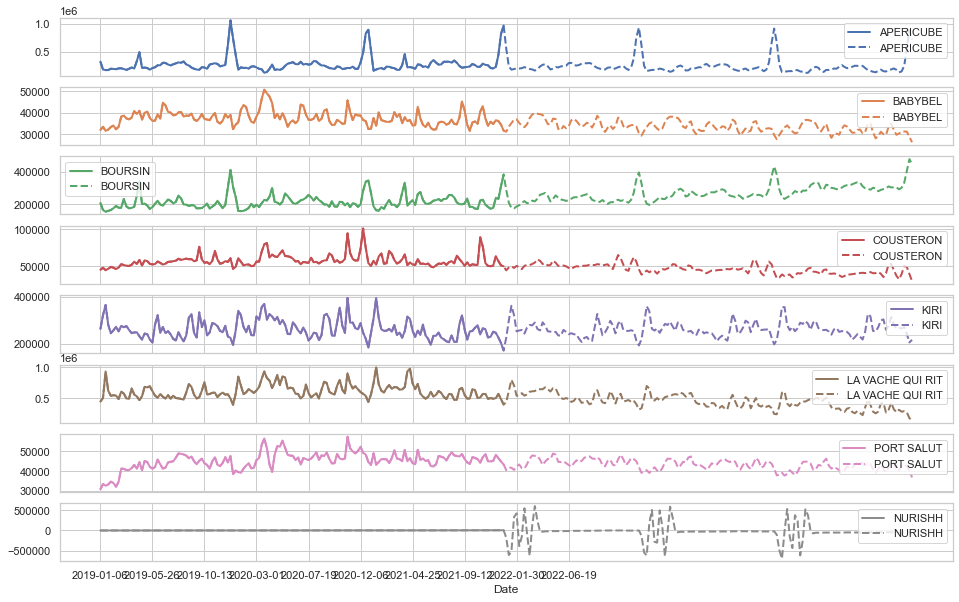

In [13]:
ax = df_brands_fcst_res.set_index("Date").loc['2017-12-31':'2021-12-26'].plot(linewidth=2, subplots=True, figsize=(16, 10))
df_brands_fcst_res.set_index("Date").plot(linewidth=2, linestyle='--', subplots=True, figsize=(16, 10), ax=ax)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

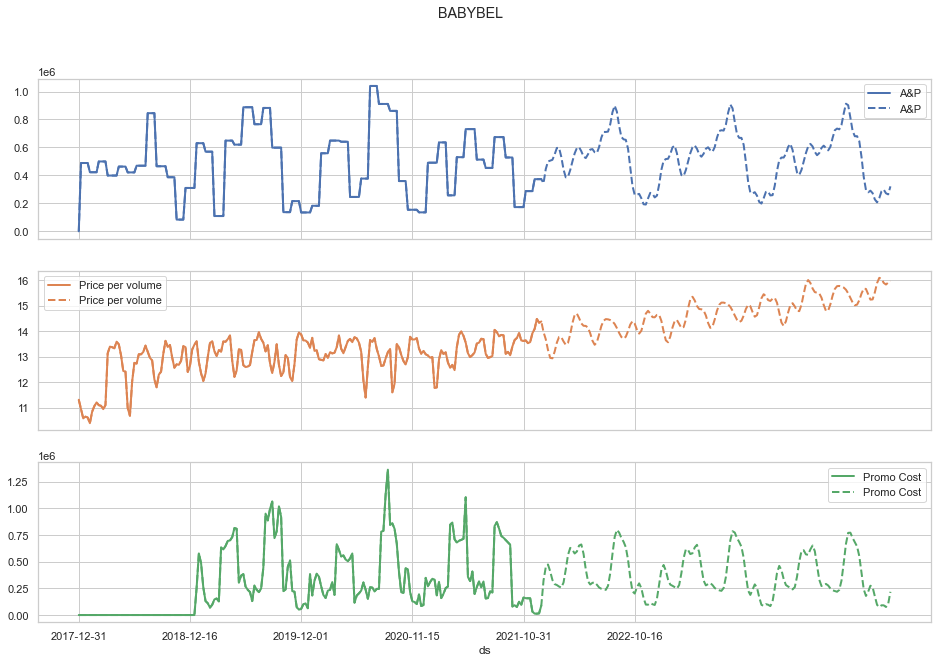

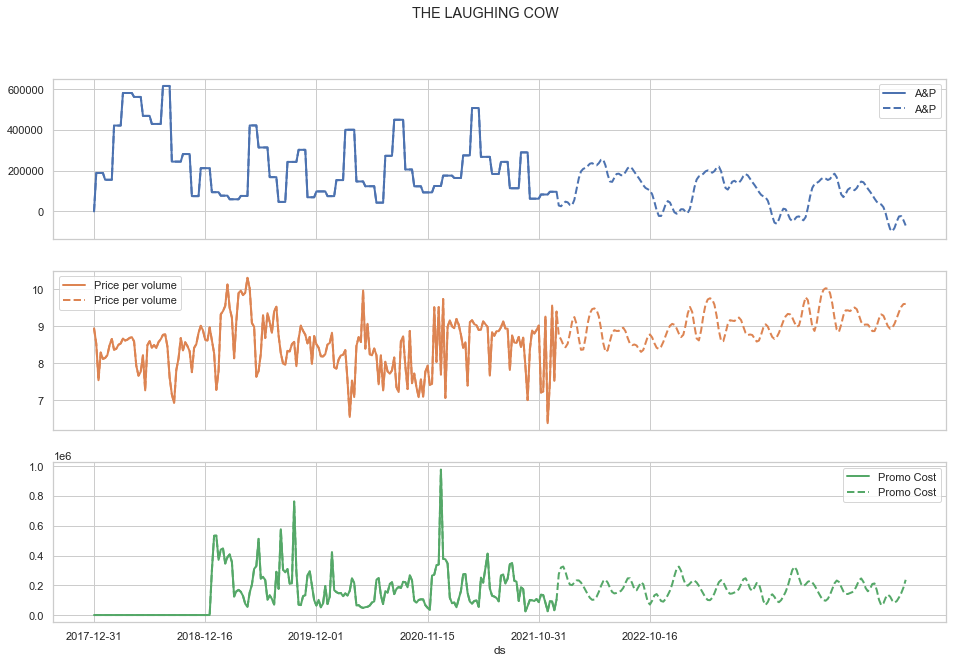

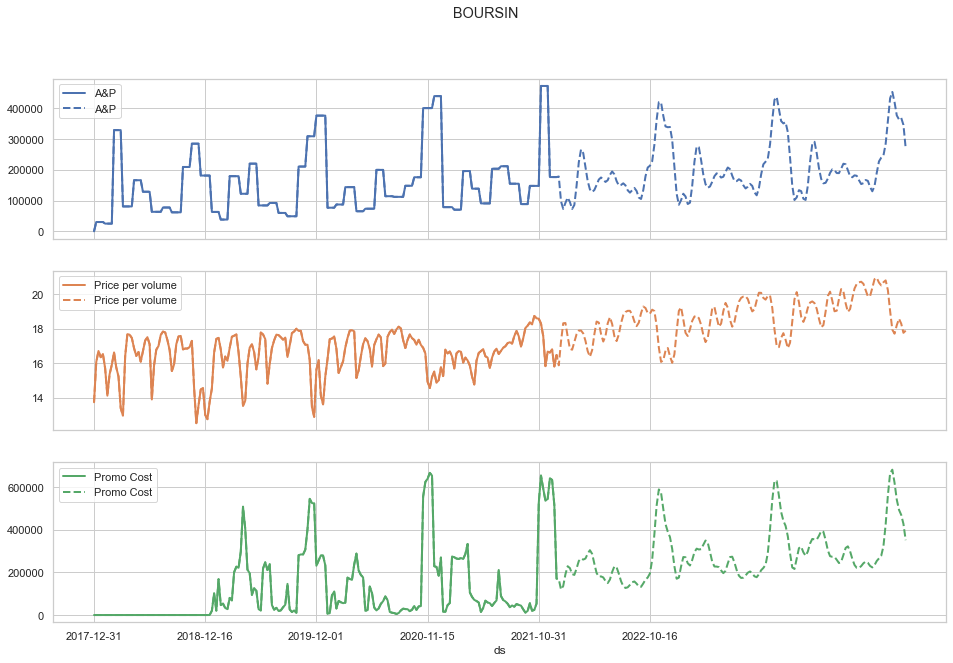

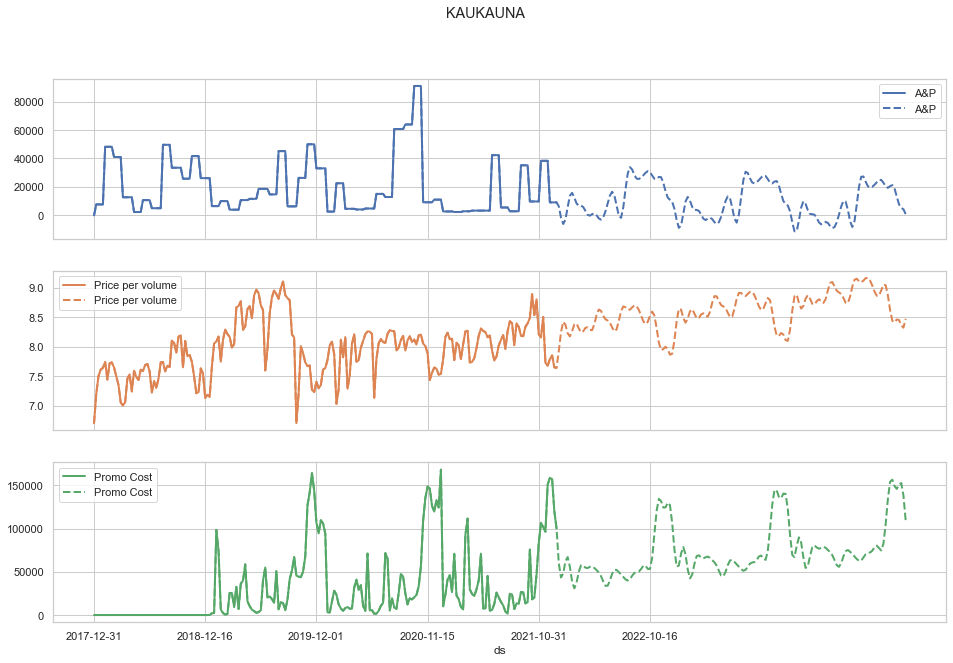

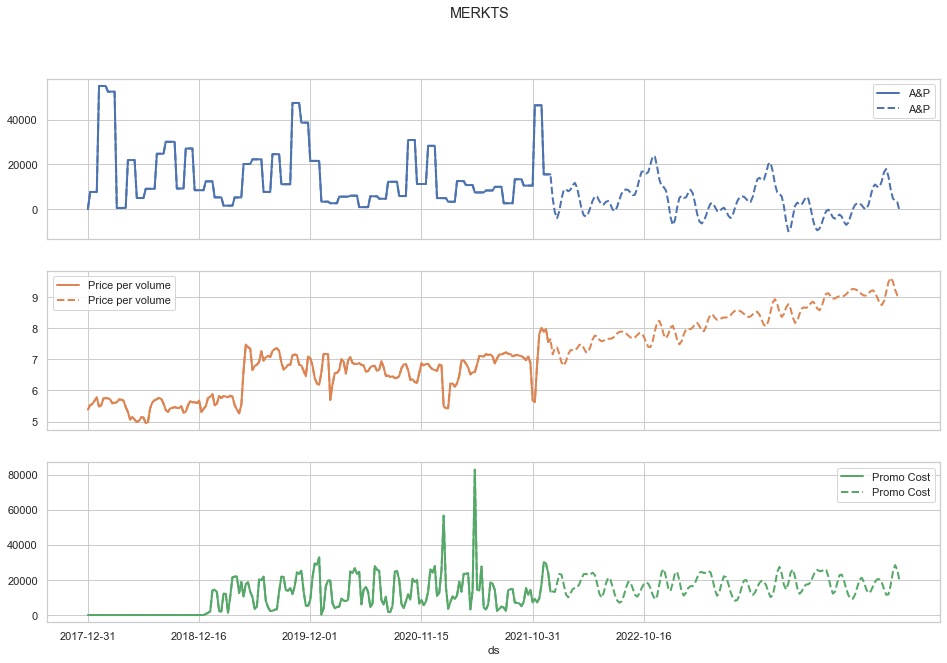

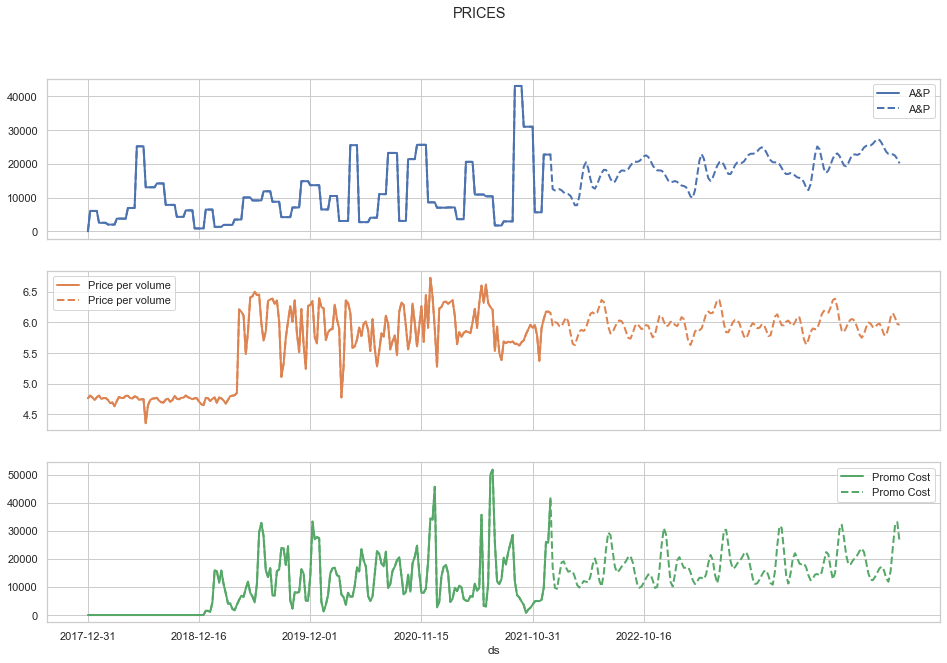

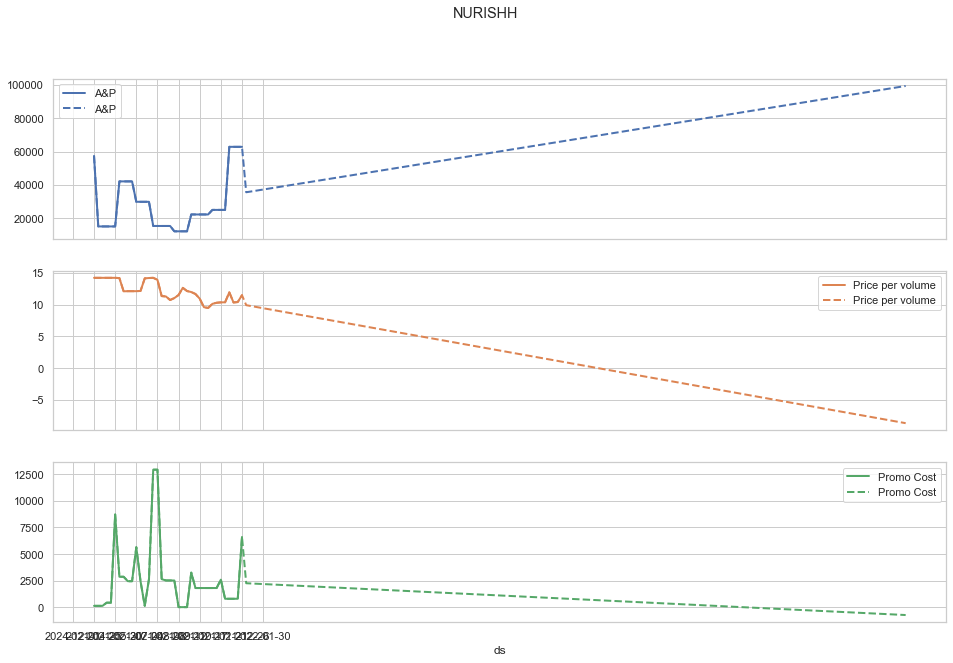

In [123]:
for brand in feats_futures:
    ax = feats_futures[brand].set_index('ds').loc['2017-12-31':'2021-12-26'].plot(subplots=True, figsize=(16, 10), title=brand, linewidth=2);
    feats_futures[brand].set_index('ds').plot(
        subplots=True, figsize=(16, 10), title=brand, 
        linestyle='--', linewidth=2, ax=ax);

### Forecasting Markets

In [71]:
features_markets = list(df_ecom.Category.unique()) + ['TOTAL CHEESE']
df_markets = get_df_markets(df_ecom)
df_markets.head()

,Date,A GOUT,A TARTINER,ALTERNATIVE VEGETALE,AOR REGIONAL,APERITIF,ARO,BLOC,BREBIS,CHEVRE,...,INGREDIENT A CHAUD,NATURE,NOMADE,ORIGINAL,PATE PERSILLEE,PLAT CHAUD,RAPE,SALADE,SPECIALITE A GOUT DOUX,TOTAL CHEESE
0,2019-01-06,12983.640,28010.819,8.700,25014.895,7218.005,15498.755,76220.619,8860.027,46423.3135,...,29239.375,23772.680,16044.820,8345.910,15112.3195,84501.302,201320.205,31357.638,35353.729,750833.4370
1,2019-01-13,14713.780,30633.404,10.700,31618.544,5016.253,17186.809,90801.723,10641.506,53778.6855,...,32278.350,25334.970,18916.331,9676.995,18003.7230,93384.024,221592.800,33229.649,40293.365,850807.9715
2,2019-01-20,14682.715,52073.530,14.725,36045.685,5125.300,21075.998,102051.796,10547.004,59125.0850,...,30246.975,32084.005,20059.025,9386.185,20140.5453,103926.057,223769.705,32440.745,55091.770,943955.5653
3,2019-01-27,17367.370,34232.944,9.600,34912.022,5920.790,17119.261,96379.333,13090.348,56708.3570,...,39555.155,28690.005,18269.900,10357.845,18618.8550,96781.537,222564.010,32487.997,48941.755,899836.6740
4,2019-02-03,17162.620,30499.153,13.980,34375.598,6760.856,18166.766,108654.836,12901.834,60255.1895,...,43124.885,28166.750,24053.566,11294.020,22149.9200,98637.249,249003.920,35817.517,45228.975,958815.9795


Features:   0%|          | 0/21 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value inste

Initial log joint probability = -11.2535
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      61        190.74    0.00269261       83.3392   3.171e-05       0.001      119  LS failed, Hessian reset 
      99       190.874   4.57685e-07       77.9568      0.6047      0.6047      171   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       190.874   9.00293e-09       83.4081     0.08228     0.08228      198   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -12.8015
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      48       246.654    0.00318977       75.7526   3.581e-05       0.001      102  LS failed, Hessian reset 
      99       246.801   3.31777e-07       81.2235      0.5702      0.5702      173   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       246.801   7.46355e-09       81.3496      0.2805      0.2805      200   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -6.8939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       331.596   3.49612e-05       106.072      0.4477      0.4477      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       331.604   1.32065e-05       106.183   1.597e-07       0.001      200  LS failed, Hessian reset 
     178       331.605   5.31403e-09       113.966    0.006441           1      263   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -4.69749
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      54       251.321    0.00094091       60.3592   1.293e-05       0.001      116  LS failed, Hessian reset 
      99        251.37   9.80292e-06       73.3652      0.5417      0.5417      182   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       251.528   0.000913584        68.557   1.182e-05       0.001      230  LS failed, Hessian reset 
     199       251.621   1.73469e-05       58.2897      0.3284      0.3284      367   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     235       251.891   7.59047e-05       64.3175   1.309e-06       0.001      452  LS failed, Hessian reset 
     274       251.898   2.10832e-05       55.9535   3.563e-07       0.001      537  LS failed, Hessian reset 
     284       251.899   2.08724e-06       53.4677    2.67e-08   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -7.05181
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      54       247.834   0.000325766       71.0144   4.713e-06       0.001      109  LS failed, Hessian reset 
      99       247.863   0.000241548       75.3175           1           1      166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     137       247.962   0.000302396        62.181   5.015e-06       0.001      286  LS failed, Hessian reset 
     199       248.045   1.45128e-06       74.6501      0.2085      0.2085      379   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     221       248.045   1.76204e-08       58.2358     0.08327           1      410   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -23.9036
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      59       216.974   9.01929e-05       75.5784    1.02e-06       0.001      130  LS failed, Hessian reset 
      78       220.255   0.000126163       58.1525   6.747e-07       0.001      201  LS failed, Hessian reset 
      99        220.92    0.00180788       118.763           1           1      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       222.116   0.000179253       117.791   2.916e-06       0.001      375  LS failed, Hessian reset 
     194       222.141   9.49206e-05       50.6014   8.006e-07       0.001      455  LS failed, Hessian reset 
     199       222.145   4.26028e-05       64.6645      0.7779      0.5501      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     255        222.53   0.000122627       97.6842   1.011e-06   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -16.103
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       209.043   5.27458e-05       80.1635           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       209.163   0.000950359       74.0829   1.118e-05       0.001      205  LS failed, Hessian reset 
     159       209.223   5.07375e-05        75.275   7.756e-07       0.001      283  LS failed, Hessian reset 
     199       209.227   8.13778e-07       76.3257   1.038e-08       0.001      371  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     216       209.227   1.14835e-08       77.5448      0.2186           1      395   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -102.92
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       152.638    0.00541605        113.39      0.6139      0.6139      150   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162       153.852   3.72613e-05       87.9506   1.777e-07       0.001      289  LS failed, Hessian reset 
     199        154.05   1.73861e-05       87.4904       0.391       0.988      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     211       154.148   4.07838e-05       132.188   3.497e-07       0.001      410  LS failed, Hessian reset 
     299       154.448     0.0017625       160.241         4.1        0.41      523   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     307       154.574   5.63764e-05       177.273   4.355e-07       0.001      595  LS failed, Hessian reset

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -18.4102
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       227.494    0.00103248       76.0545   1.097e-05       0.001      178  LS failed, Hessian reset 
      99       227.603   0.000347335       77.0736           1           1      188   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     154       227.632   2.82631e-05       91.6229   3.473e-07       0.001      303  LS failed, Hessian reset 
     199       227.634   1.21995e-08       86.5509      0.1643      0.1643      369   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       227.634   2.00514e-07       75.6298   1.974e-09       0.001      433  LS failed, Hessian reset 
     225       227.634   6.26442e-09        68.332      0.2789      0.2789      441   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -192.611
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      63       93.3737    1.3046e-05       102.394   1.009e-07       0.001      137  LS failed, Hessian reset 
      99       99.9187    0.00198531       164.524           1           1      197   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       101.275   0.000623243       150.219       0.257           1      338   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     225       101.682   1.19995e-05       83.4175   8.014e-08       0.001      415  LS failed, Hessian reset 
     299       102.084    0.00882042        292.55       1.685      0.1843      530   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     300       102.087   1.96679e-05       89.5739   6.723e-08       0.001      574  LS failed, Hessian rese

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -13.2729
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      53       284.064   9.65289e-05       78.7132   1.287e-06       0.001      117  LS failed, Hessian reset 
      87       284.074   1.96784e-05       75.5007   2.638e-07       0.001      207  LS failed, Hessian reset 
      99       284.075   8.80517e-07       71.7429      0.2636      0.8208      221   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       284.075   7.00051e-09       75.3181      0.3496      0.3496      244   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -9.37824
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      38       228.606    0.00127816       85.0276   1.479e-05       0.001       88  LS failed, Hessian reset 
      91       228.781    0.00010527       73.6087   1.264e-06       0.001      196  LS failed, Hessian reset 
      99       228.786   2.50148e-05       82.7057           1           1      206   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       228.788   3.19476e-06       85.7522   4.153e-08       0.001      270  LS failed, Hessian reset 
     137       228.788    3.9868e-09       76.3683      0.1503      0.1503      294   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -8.6707
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      39       216.471    0.00317586       50.2011   4.104e-05       0.001       83  LS failed, Hessian reset 
      99       216.617   2.13603e-07       62.3643           1           1      171   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       216.618   1.37558e-05       51.9525   1.588e-07       0.001      219  LS failed, Hessian reset 
     131       216.618   3.82119e-09       49.3959     0.06788      0.9542      258   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -8.48505
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      38       243.655    0.00044898       78.0788    5.37e-06       0.001       89  LS failed, Hessian reset 
      99       243.944   0.000602488        81.469   7.413e-06       0.001      193  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     138       243.979   1.27131e-05         71.15    1.41e-07       0.001      282  LS failed, Hessian reset 
     172       243.979   3.44833e-07       79.1735   3.637e-09       0.001      367  LS failed, Hessian reset 
     178       243.979    2.5105e-09       80.7889     0.01903      0.2757      376   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -8.53624
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      36       212.084   0.000741726       75.6468   9.094e-06       0.001       92  LS failed, Hessian reset 
      82       212.117   1.22415e-05       78.0661   1.382e-07       0.001      196  LS failed, Hessian reset 
      99       212.118    3.3219e-07       68.3618      0.7065      0.7065      215   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       212.118   2.83778e-09       84.7905      0.3321      0.3321      240   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -12.9074
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      76       206.218   2.51492e-05       83.8927   3.247e-07       0.001      147  LS failed, Hessian reset 
      99       206.221   4.05697e-07       83.1959      0.6692      0.6692      175   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       206.221   3.32117e-07       69.1462   3.739e-09       0.001      250  LS failed, Hessian reset 
     134       206.221   7.94299e-09       69.8274      0.3883      0.3883      260   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -9.16066
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      45       229.776   0.000466812       91.1373   5.686e-06       0.001       99  LS failed, Hessian reset 
      87       229.849   0.000329902       81.7796   4.285e-06       0.001      193  LS failed, Hessian reset 
      99       229.864   1.60521e-05       67.7435      0.2878           1      209   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       229.866   5.61962e-06        80.527   6.899e-08       0.001      282  LS failed, Hessian reset 
     199       230.004   0.000445975       83.8275           1           1      376   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       230.094   6.63859e-06       78.3044      0.1396      0.3904      494   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -9.8678
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      71       224.078   0.000606708       80.5225   6.811e-06       0.001      130  LS failed, Hessian reset 
      99       224.096   8.69139e-06       74.2181      0.1145           1      169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142       224.097   2.22755e-07       85.4392   3.398e-09       0.001      274  LS failed, Hessian reset 
     152       224.097   8.83265e-09       76.7479      0.6677      0.6677      284   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -13.456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       205.076   2.48843e-06       71.8076      0.2142      0.9086      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       205.313    0.00229715       77.6736   2.893e-05       0.001      200  LS failed, Hessian reset 
     163       205.516   5.44676e-06       85.2791   6.498e-08       0.001      312  LS failed, Hessian reset 
     188       205.517   4.97035e-09       86.5617      0.3192      0.3192      346   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -5.47474
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       293.337   6.67969e-05       91.7008      0.3492      0.3492      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113        293.82     0.0059283       148.132   4.564e-05       0.001      197  LS failed, Hessian reset 
     139        294.42   0.000454388       102.449    4.48e-06       0.001      271  LS failed, Hessian reset 
     199       294.564   1.55254e-07       94.3968      0.6239      0.6239      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       294.564   8.82005e-09       95.8891       0.822       0.822      365   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -10.0324
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      61       221.832   0.000931114       86.1001   1.182e-05       0.001      123  LS failed, Hessian reset 
      99        221.89    1.0753e-05       78.2673           1           1      173   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       222.189   9.83084e-06       59.4933      0.1855      0.4907      308   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     243       222.192    2.3568e-06       77.2037   3.616e-08       0.001      401  LS failed, Hessian reset 
     284       222.192   9.22684e-09       72.9184      0.8702      0.8702      456   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/prophet/plot.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


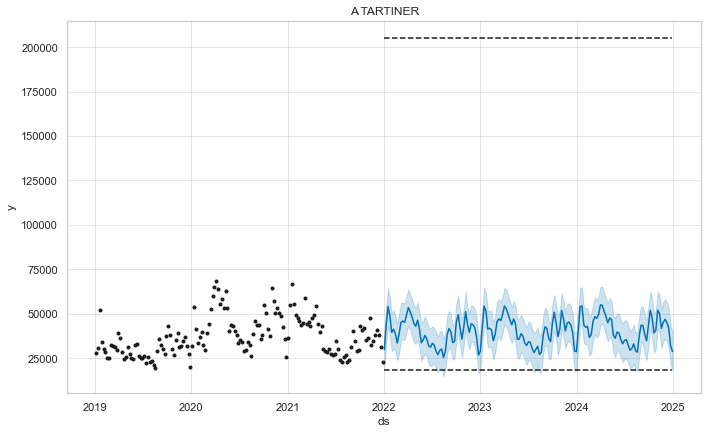

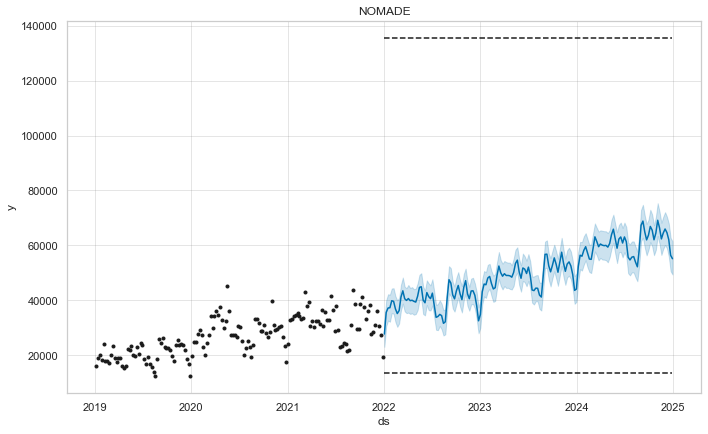

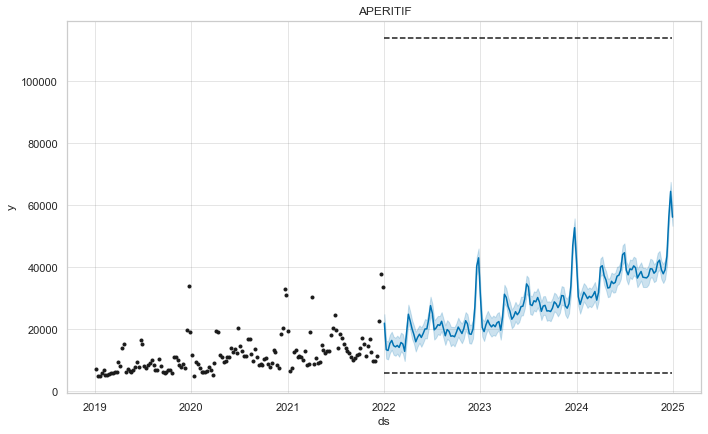

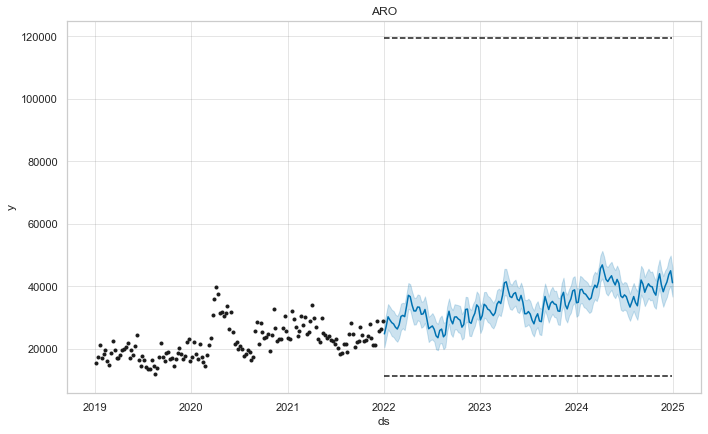

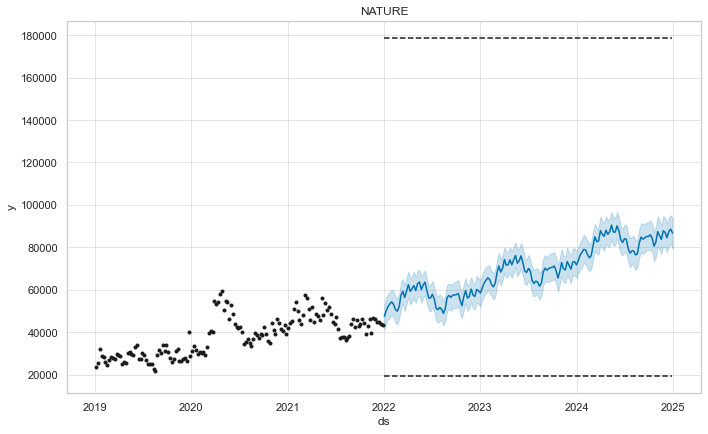

...

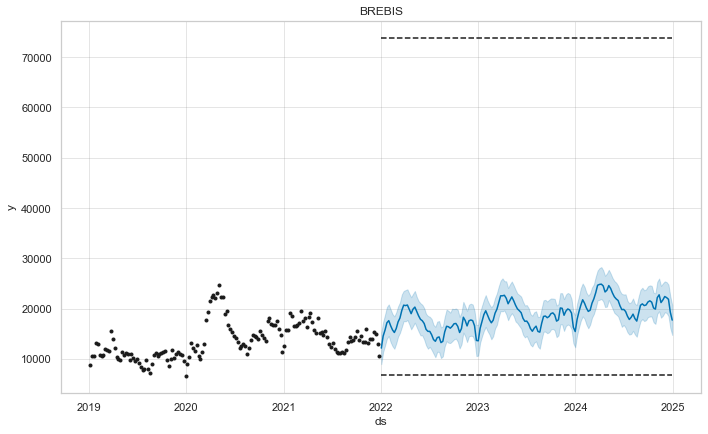

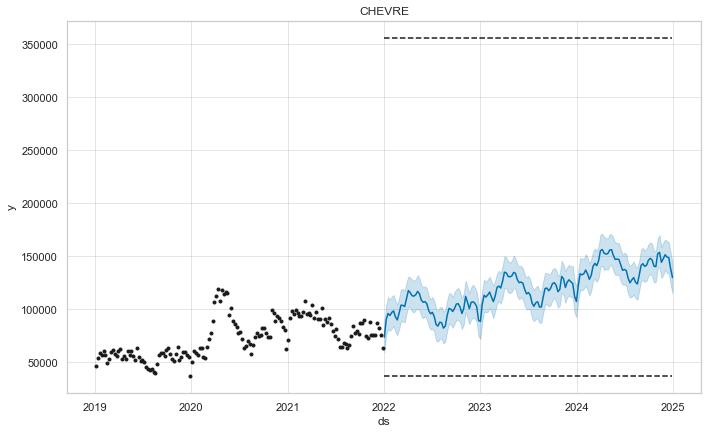

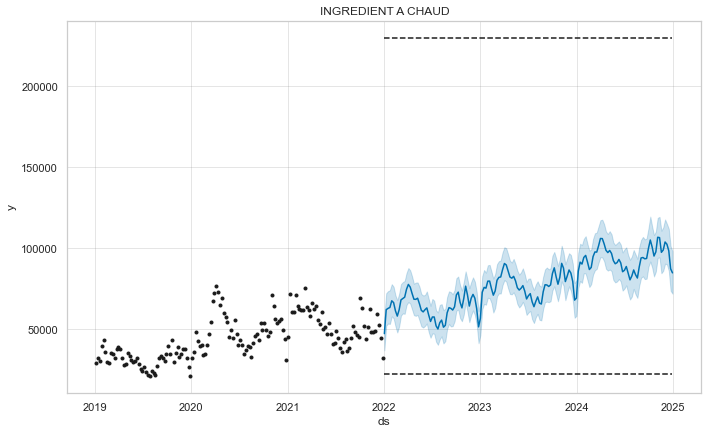

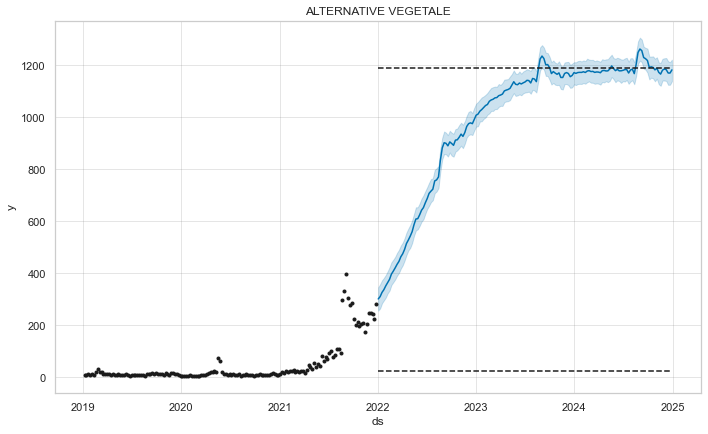

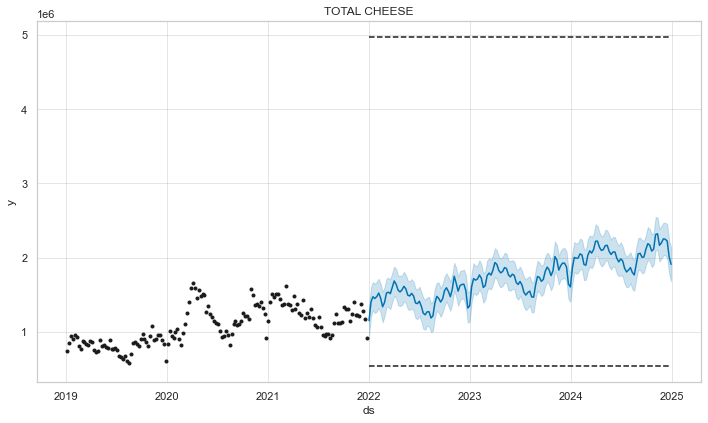

In [72]:
df_markets_fcst_res = forecasting_markets(df_markets, features_markets, periods=157, freq='W')

In [73]:
df_markets_fcst_res.tail()

,Date,A TARTINER,NOMADE,APERITIF,ARO,NATURE,RAPE,CHEVRE&BREBIS,A GOUT,ORIGINAL,...,BLOC,PATE PERSILLEE,CLASSIQUE,AOR REGIONAL,SPECIALITE A GOUT DOUX,BREBIS,CHEVRE,INGREDIENT A CHAUD,ALTERNATIVE VEGETALE,TOTAL CHEESE
308,2024-12-01,47004.637979,65974.506207,39235.831117,40015.316553,87135.168811,530854.506125,1058.292957,42925.312536,45007.364668,...,184311.062097,53515.654233,222370.460888,113957.862919,106799.946440,22405.427139,151401.159284,103850.019855,1185.226951,2.253359e+06
309,2024-12-08,45066.260478,64663.862696,43676.885774,41368.468099,84491.694342,531496.215729,1038.949433,43500.760735,45157.640816,...,182641.758816,54243.533936,220715.085351,109862.240914,107630.937254,22186.426856,149314.963544,102472.585808,1182.598248,2.248554e+06
310,2024-12-15,41952.644393,62074.045792,56010.477342,43701.355008,87443.849141,519214.951743,998.967552,41912.154359,43459.129426,...,181383.799739,55353.145171,215567.718272,110011.089536,104069.944885,21858.408526,148648.472322,98444.164915,1169.894520,2.223920e+06
311,2024-12-22,31963.621012,56401.270068,64537.551400,44954.085596,88596.600482,451544.654199,867.778673,35226.306483,39524.119747,...,163137.516669,51312.522203,189506.664338,104829.682752,93165.118182,19274.554732,138231.001523,87316.203869,1169.605969,2.011021e+06
312,2024-12-29,28888.844167,55162.347794,56229.258929,41124.277885,86827.544099,434055.961376,800.420556,35852.715734,38815.605028,...,147040.396488,47280.148854,171397.468699,99484.037531,86294.446473,17715.916559,129984.587899,84797.890189,1181.887667,1.910461e+06


In [219]:
#df_markets_fcst_res.assign(Year=pd.to_datetime(df_markets_fcst_res.Date).dt.year).groupby('Year').sum().T.to_clipboard()

In [76]:
#df_markets_fcst_res['Date'] = df_markets_fcst_res.Date.apply(lambda x: x.strftime('%Y-%m-%d'))
df_markets_fcst_res.round(1).to_excel("./results/FR/Ecommerce/fr_ecom_markets_forecasts.xlsx", index=False)

### Growth Drivers Past

In [77]:
df_bel_ecom.head()

,Date,Brand,Price per volume,Sales in volume,Sales in value,Distribution,Sell-in,Advertising,Promotion,A&P,MVC,Rate of Innovation,Trends
0,2019-01-06,APERICUBE,13.131324,317063.709040,4.270993e+06,681.779410,1.081436e+06,44.38528,74.99087,29844.0375,627333.873400,0.0,1
1,2019-01-06,BABYBEL,8.278697,31992.483765,2.686242e+05,70.038097,1.508784e+06,683.15914,137.30146,205115.1500,806691.118450,0.0,6
2,2019-01-06,BOURSIN,18.001748,207758.221914,2.881462e+06,192.582568,9.410844e+05,33.81879,133.43824,41814.2575,414141.127425,0.0,32
3,2019-01-06,COUSTERON,7.988248,45179.037323,3.654272e+05,120.191609,1.393531e+05,0.00000,11.92763,2981.9075,24573.224600,0.0,0
4,2019-01-06,KIRI,9.245133,262535.235110,2.394732e+06,171.488026,1.419914e+06,43.41143,123.65016,41765.3975,700810.716475,0.0,27


In [83]:
# Use this with controllable_features param to False
#bel_features = ['Date', 'Brand', 'A&P', 'Price per volume', 'Rate of Innovation', 'Distribution', 'Trends', 'Sales in volume']
# Use this with controllable_features param to True
bel_features = ['Date', 'Brand', 'A&P', 'Price per volume', 'Distribution', 'Sales in volume']
dict_res = compute_growth_drivers_past(
    df_ecom, df_bel_ecom[bel_features], brands_name[country], features, 
    years=[2019, 2020, 2021], controllable_features=True)

Years:   0%|          | 0/3 [00:00<?, ?it/s]

Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


In [84]:
for year in dict_res:
    pd.DataFrame(dict_res[year]['xgb_feature_importance']).round(1).to_excel("results/FR/Ecommerce/fr_ecom_growth_drivers_past_{}_controllable_features.xlsx".format(year))

### Growth Drivers Future

In [86]:
df_futures = pd.DataFrame()
for brand in feats_futures:
    feats_futures[brand]['ds'] = feats_futures[brand]['ds'].apply(lambda x: x.strftime("%Y-%m-%d"))
    df_tmp = pd.merge(feats_futures[brand].rename(columns={'ds':'Date'}), 
                     df_brands_fcst_res[['Date', brand]], on='Date').rename(
        columns={brand: 'Sales in volume'})
    df_tmp['Brand'] = brand
    df_futures = pd.concat([df_futures, df_tmp])

In [57]:
df_futures

,Date,A&P,Price per volume,Distribution,cap,floor,Sales in volume,Brand
0,2019-01-06,29844.037500,13.131324,681.779410,3.188062e+06,57974.15236,317063.709040,APERICUBE
1,2019-01-13,29844.037500,13.640834,638.960597,3.188062e+06,57974.15236,174449.843237,APERICUBE
2,2019-01-20,29844.037500,13.673215,622.723822,3.188062e+06,57974.15236,164711.825455,APERICUBE
3,2019-01-27,29844.037500,13.618310,635.250019,3.188062e+06,57974.15236,165458.787968,APERICUBE
4,2019-02-03,32382.817500,13.066062,650.425689,3.188062e+06,57974.15236,189310.973142,APERICUBE
...,...,...,...,...,...,...,...,...
191,2024-12-01,45184.622896,9.016601,63.043369,2.190720e+04,1.56000,-47815.656707,NURISHH
192,2024-12-08,45312.271238,8.977543,63.333174,2.190720e+04,1.56000,-47376.177331,NURISHH
193,2024-12-15,45439.919581,8.938485,63.622978,2.190720e+04,1.56000,-50098.409557,NURISHH
194,2024-12-22,45567.567923,8.899427,63.912782,2.190720e+04,1.56000,-44879.853904,NURISHH


In [88]:
dict_res_future = compute_growth_drivers_past(
    df_ecom, df_futures[df_futures.Date > df_bel_ecom.Date.iloc[-1]][bel_features], brands_name[country], features, 
    years=[2022, 2023, 2024], controllable_features=True)

Years:   0%|          | 0/3 [00:00<?, ?it/s]

Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


In [89]:
for year in dict_res_future:
    pd.DataFrame(dict_res_future[year]['xgb_feature_importance']).round(1).to_excel("results/FR/Ecommerce/fr_ecom_growth_drivers_future_{}_controllable_features.xlsx".format(year))

## Total

In [115]:
df = pd.read_excel('data/FR/FR_Total GMS_df_0503.xlsx')

In [116]:
df_bel = pd.read_excel('data/FR/FR_Total GMS_df_bel_0503.xlsx')

In [121]:
df_bel_hmsm.head()

,Date,Brand,Price per volume,Sales in volume,Sales in value,Distribution,Sell-in,Advertising,Promotion,A&P,MVC,Rate of Innovation
0,2019-01-06,APERICUBE,13.131324,317063.709040,4.270993e+06,681.779410,1.081436e+06,44.38528,74.99087,29844.0375,627333.873400,0.0
1,2019-01-06,BABYBEL,8.278697,31992.483765,2.686242e+05,70.038097,1.508784e+06,683.15914,137.30146,205115.1500,806691.118450,0.0
2,2019-01-06,BOURSIN,18.001748,207758.221914,2.881462e+06,192.582568,9.410844e+05,33.81879,133.43824,41814.2575,414141.127425,0.0
3,2019-01-06,COUSTERON,7.988248,45179.037323,3.654272e+05,120.191609,1.393531e+05,0.00000,11.92763,2981.9075,24573.224600,0.0
4,2019-01-06,KIRI,9.245133,262535.235110,2.394732e+06,171.488026,1.419914e+06,43.41143,123.65016,41765.3975,700810.716475,0.0


In [124]:
df_bel_ecom.head()

,Date,Brand,Price per volume,Sales in volume,Sales in value,Distribution,Sell-in,Advertising,Promotion,A&P,MVC,Rate of Innovation
0,2019-01-06,APERICUBE,13.131324,317063.709040,4.270993e+06,681.779410,1.081436e+06,44.38528,74.99087,29844.0375,627333.873400,0.0
1,2019-01-06,BABYBEL,8.278697,31992.483765,2.686242e+05,70.038097,1.508784e+06,683.15914,137.30146,205115.1500,806691.118450,0.0
2,2019-01-06,BOURSIN,18.001748,207758.221914,2.881462e+06,192.582568,9.410844e+05,33.81879,133.43824,41814.2575,414141.127425,0.0
3,2019-01-06,COUSTERON,7.988248,45179.037323,3.654272e+05,120.191609,1.393531e+05,0.00000,11.92763,2981.9075,24573.224600,0.0
4,2019-01-06,KIRI,9.245133,262535.235110,2.394732e+06,171.488026,1.419914e+06,43.41143,123.65016,41765.3975,700810.716475,0.0


In [125]:
(df_bel_hmsm.round(1) != df_bel_ecom.round(1)).any()

Date                  False
Brand                 False
Price per volume      False
Sales in volume       False
Sales in value        False
Distribution          False
Sell-in                True
Advertising            True
Promotion              True
A&P                    True
MVC                    True
Rate of Innovation     True
dtype: bool

In [119]:
df.describe()
df_bel.describe()

,Sales in value,Sales value with promo,Sales in volume,Sales volume with promo,Price with promo,Price without promo,Price per volume,Distribution
count,1.069670e+05,0.0,106967.000000,0.0,0.0,0.0,106967.000000,0.0
mean,1.935003e+05,NaN,20318.074720,NaN,NaN,NaN,14.734321,NaN
std,4.924091e+05,NaN,59641.215086,NaN,NaN,NaN,7.074416,NaN
min,1.000000e-02,NaN,0.024000,NaN,NaN,NaN,0.062500,NaN
25%,3.461087e+03,NaN,218.363029,NaN,NaN,NaN,9.989110,NaN
50%,2.365812e+04,NaN,1793.398659,NaN,NaN,NaN,13.496039,NaN
75%,1.461108e+05,NaN,11682.328047,NaN,NaN,NaN,17.610070,NaN
max,7.777488e+06,NaN,977193.890587,NaN,NaN,NaN,96.363018,NaN


,Price per volume,Sales in volume,Sales in value,Distribution,Sell-in,Advertising,Promotion,A&P,MVC,Rate of Innovation
count,1131.000000,1.131000e+03,1.131000e+03,1131.000000,9.750000e+02,975.000000,975.000000,975.000000,9.750000e+02,1092.000000
mean,11.316930,2.059375e+05,2.061319e+06,223.351857,9.098731e+05,209.521597,91.544287,70297.651774,4.101325e+05,0.143722
std,3.109416,2.011638e+05,1.821819e+06,259.278678,6.536827e+05,268.472381,81.765397,77771.426421,3.553626e+05,0.260010
min,7.455859,3.120000e+00,6.182000e+01,0.069546,9.963594e+03,0.000000,0.180730,592.984000,-7.280536e+04,0.000000
25%,8.415657,4.616194e+04,3.798643e+05,105.098941,1.879785e+05,4.878175,9.136430,2822.933750,1.569135e+04,0.000000
50%,10.532511,1.834401e+05,2.337994e+06,146.837231,1.036629e+06,90.590150,88.104220,47283.246000,4.781768e+05,0.000000
75%,13.747022,2.658159e+05,3.167691e+06,171.314276,1.346108e+06,309.985765,137.223790,107034.990000,6.495228e+05,0.132775
max,21.725000,1.062687e+06,1.400707e+07,1122.361977,3.595951e+06,1211.803060,365.292730,350675.730000,1.971895e+06,0.937351


### Forecasting Brands

#### No regressors

Features:   0%|          | 0/8 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value inste

Initial log joint probability = -15.1164
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       393.773    0.00289778       69.9713      0.3968           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     153        400.53     0.0139183       135.476   0.0001089       0.001      229  LS failed, Hessian reset 
     199       401.175   1.58858e-07       74.4692      0.8132      0.8132      295   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     211       401.175    7.3921e-09       75.3186      0.2436      0.6011      317   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -172.616
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       146.424     0.0015829       1772.22     0.07361           1      150   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       148.937   6.61184e-05       335.669      0.2729      0.2729      305   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     209       149.001   3.55381e-06       86.7307   2.414e-08       0.001      362  LS failed, Hessian reset 
     255       149.202   2.68179e-06       75.6087    3.72e-08       0.001      474  LS failed, Hessian reset 
     280       149.216   5.05787e-05       126.517   6.146e-07       0.001      542  LS failed, Hessian reset 
     299       149.219    4.5711e-06       82.8618      0.8605      0.8605      568   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -9.27171
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       324.889     0.0309387       78.3065      0.1772           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       331.868    0.00168335        37.956      0.7826      0.7826      263   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     293        332.16   2.09365e-06       46.3912   3.177e-08       0.001      452  LS failed, Hessian reset 
     299        332.16   1.68677e-07       70.5096      0.2204           1      461   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     306        332.16   3.85529e-09       36.9303     0.02787           1      474   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -6.56002
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      50       283.882   0.000450965       71.3538   7.686e-06       0.001      106  LS failed, Hessian reset 
      99       284.018     0.0005546       63.4692     0.04736           1      193   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102        284.03   0.000746545       45.8394   1.019e-05       0.001      237  LS failed, Hessian reset 
     199       284.163   7.13492e-05       74.2407      0.5839      0.5839      383   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     208       284.174   0.000121132       60.7452    1.78e-06       0.001      463  LS failed, Hessian reset 
     266       284.179   6.08638e-06       67.8614    9.09e-08       0.001      597  LS failed, Hessian reset 
     278       284.179   2.35475e-09       60.9139     0.04164   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -7.5159
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      74       272.952     0.0176642       103.566   0.0001907       0.001      131  LS failed, Hessian reset 
      99       273.611   0.000110905       80.5621           1           1      166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     178       273.708   0.000724639       82.7651   7.481e-06       0.001      323  LS failed, Hessian reset 
     199       273.737   1.71403e-05       89.4303           1           1      354   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     239       273.738   2.66109e-06       84.3483   2.835e-08       0.001      437  LS failed, Hessian reset 
     269       273.739   1.45873e-08        72.479      0.6781      0.6781      474   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is 

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -11.033
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      86       245.784   0.000957895       87.3584   1.104e-05       0.001      159  LS failed, Hessian reset 
      99       245.856   4.74987e-05       64.0397      0.3751           1      175   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     198       245.989   0.000387075       79.3095   4.091e-06       0.001      386  LS failed, Hessian reset 
     199       245.995   0.000218942       89.1027           1           1      387   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     271       246.112   6.60393e-09       71.8355      0.3807      0.3807      478   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -6.27897
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       268.146   0.000589288       93.5373      0.4519      0.4519      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       268.208   7.09132e-09       88.4168      0.4558      0.4558      191   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -8.71295
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      50       322.719   0.000942663       60.0544   1.191e-05       0.001      114  LS failed, Hessian reset 
      94       323.015    0.00248446       100.263   3.398e-05       0.001      216  LS failed, Hessian reset 
      99       323.137   0.000532304       63.6802           1           1      222   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       323.169   3.10936e-09       52.6355      0.1892      0.1892      295   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


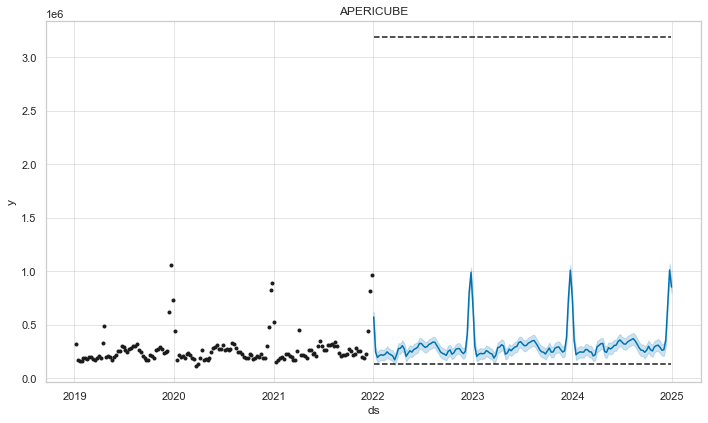

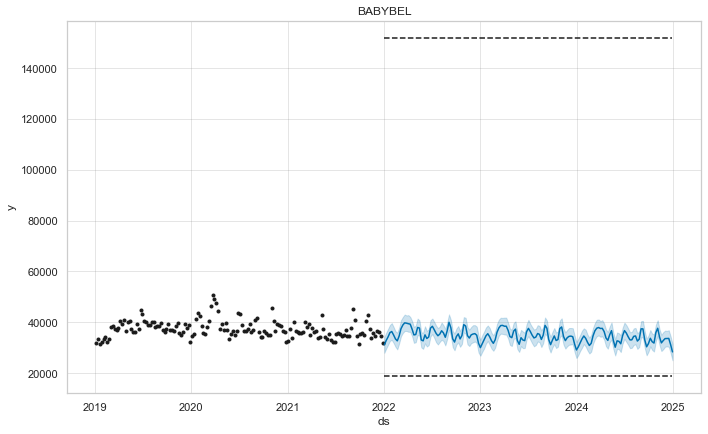

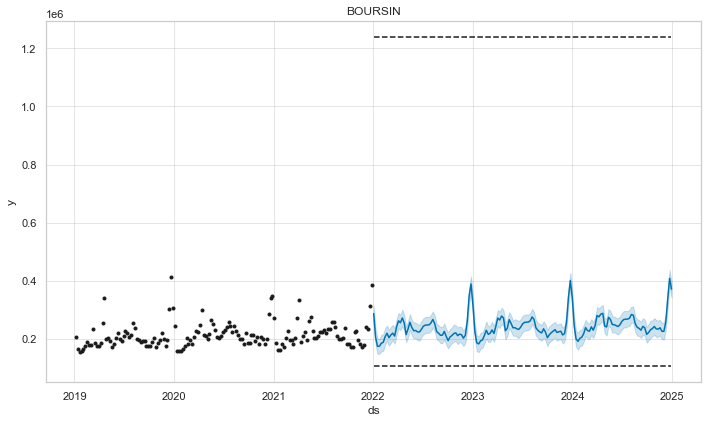

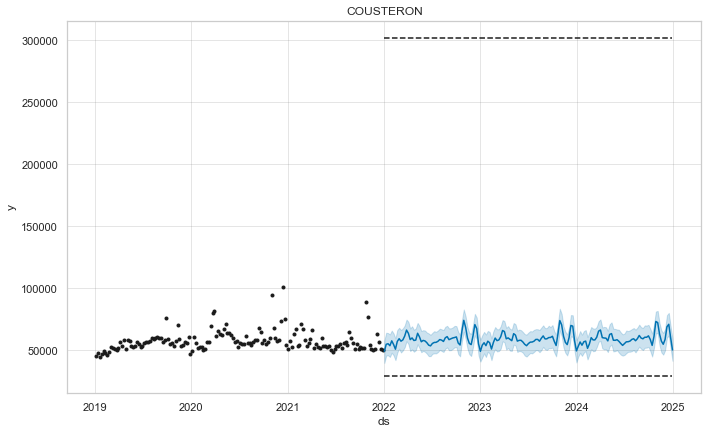

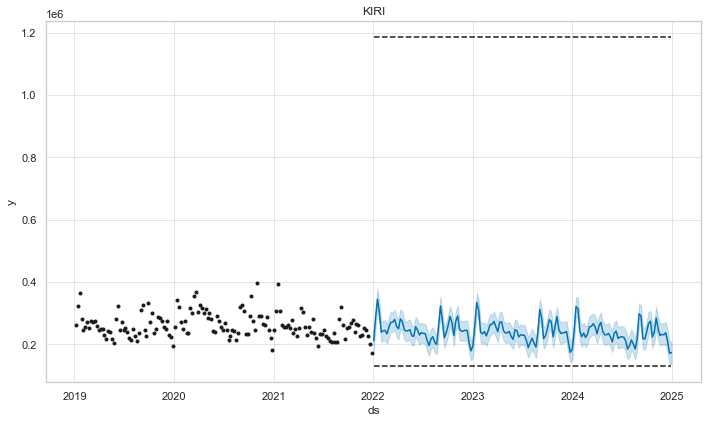

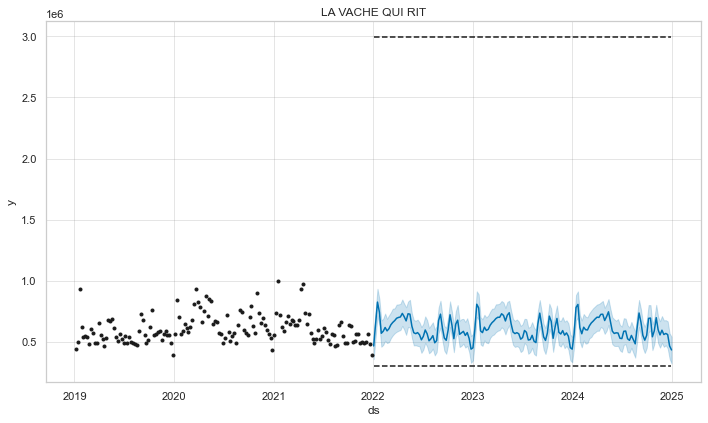

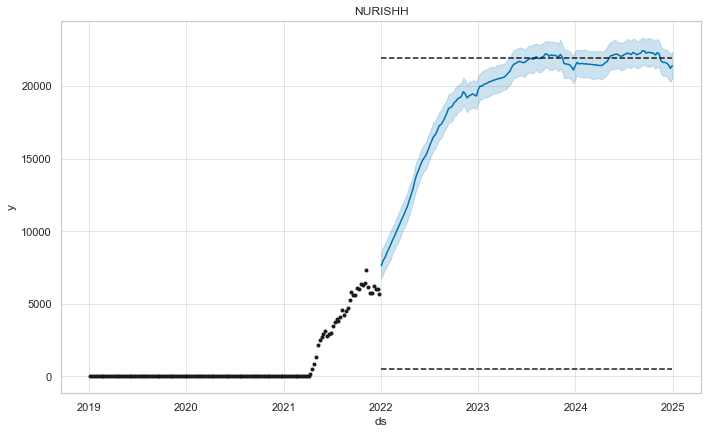

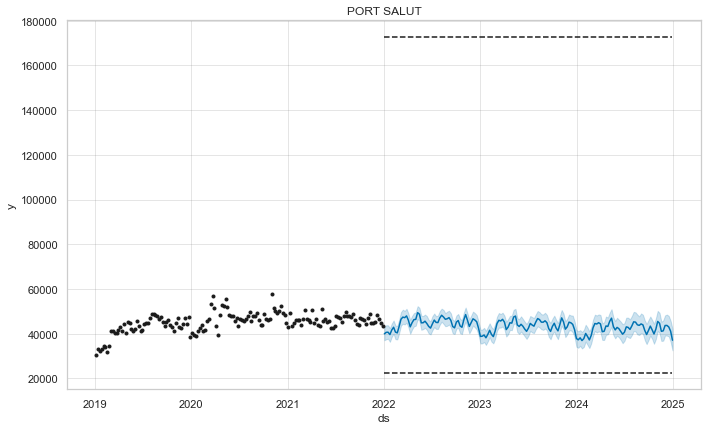

In [95]:
df_bel_brands = df_bel.groupby(["Date", "Brand"]).agg('sum')['Sales in volume'].unstack().reset_index()
df_bel_brands.columns.name=''
df_bel_brands = df_bel_brands.fillna(0)
df_bel_brands_fcst_res = forecasting_features(df_bel_brands, list(df_bel_brands.columns[1:]), periods=157, freq='W')

array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
      dtype=object)

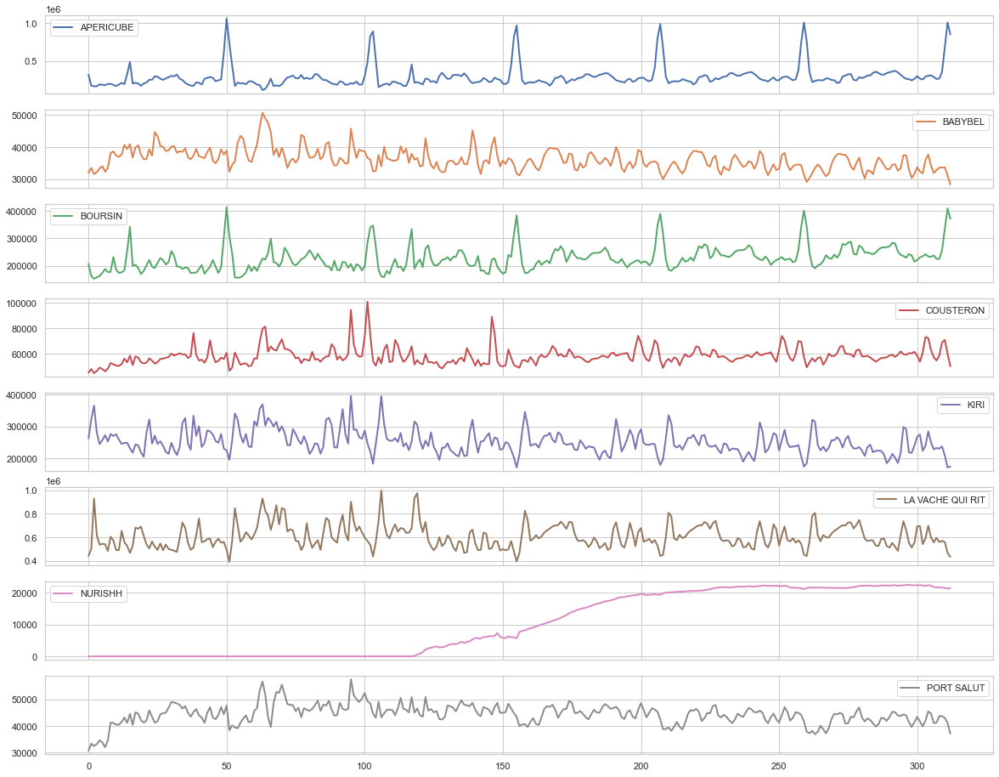

In [96]:
df_bel_brands_fcst_res.iloc[:, 1:].plot(subplots=True, linewidth=2, figsize=(20, 16))

In [97]:
df_bel_brands_fcst_res['Date'] = df_bel_brands_fcst_res.Date.apply(lambda x: x.strftime('%Y-%m-%d'))
df_bel_brands_fcst_res.round(1).to_excel("results/FR/Total/fr_brands_forecasts_no_regressors.xlsx", index=False)

#### With Regressors

In [98]:
df_bel['Trends'] = df_bel.apply(lambda x: df_trends[df_trends.Date == x.Date][x.Brand].values[0], axis=1)
df_bel.fillna(0, inplace=True)
df_bel.head()

,Date,Brand,Price per volume,Sales in volume,Sales in value,Distribution,Sell-in,Advertising,Promotion,A&P,MVC,Rate of Innovation,Trends
0,2019-01-06,APERICUBE,13.131324,317063.709040,4.270993e+06,681.779410,1.081436e+06,44.38528,74.99087,29844.0375,627333.873400,0.0,1
1,2019-01-06,BABYBEL,8.278697,31992.483765,2.686242e+05,70.038097,1.508784e+06,683.15914,137.30146,205115.1500,806691.118450,0.0,6
2,2019-01-06,BOURSIN,18.001748,207758.221914,2.881462e+06,192.582568,9.410844e+05,33.81879,133.43824,41814.2575,414141.127425,0.0,32
3,2019-01-06,COUSTERON,7.988248,45179.037323,3.654272e+05,120.191609,1.393531e+05,0.00000,11.92763,2981.9075,24573.224600,0.0,0
4,2019-01-06,KIRI,9.245133,262535.235110,2.394732e+06,171.488026,1.419914e+06,43.41143,123.65016,41765.3975,700810.716475,0.0,27


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -12.3186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       218.535   0.000304039       97.6161      0.1724           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       218.586   0.000100481       93.5579   1.013e-06       0.001      203  LS failed, Hessian reset 
     154       218.601   1.58795e-05       102.379   1.751e-07       0.001      268  LS failed, Hessian reset 
     185       218.602    1.5617e-06       103.251   1.543e-08       0.001      354  LS failed, Hessian reset 
     199       218.603   4.67771e-08        90.645      0.2968           1      375   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     214       218.603   3.84927e-07       104.267   4.141e-09       0.001      434  LS failed, Hessian reset 
     219       218.603   8.75112e-09        88.337      0.1501   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.13249
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       608.655    0.00199794       163.276      0.6209           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     183       608.881   9.71318e-09       57.8098     0.02111           1      241   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.54068
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       451.705     0.0137765       333.316       0.715       0.715      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       452.246    0.00128717       145.308   1.402e-05       0.001      191  LS failed, Hessian reset 
     145       453.395   0.000270015       84.1981   4.281e-06       0.001      270  LS failed, Hessian reset 
     199       453.524   8.95512e-05       57.3319           1           1      343   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     242       453.779   0.000780759       82.1732   1.157e-05       0.001      440  LS failed, Hessian reset 
     299       453.892   9.84419e-05       46.0997           1           1      512   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -13.8555
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       425.074    0.00138563       85.7598      0.7237      0.7237      116   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       429.661   8.94202e-05       79.5809       0.642       0.642      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     274       432.036    0.00203324       79.1778    2.08e-05       0.001      359  LS failed, Hessian reset 
     299       432.189   8.53754e-05       66.4715      0.7267      0.7267      391   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       433.165   0.000463337       112.264      0.3833      0.3833      507   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499        434.69   7.55085e-06    

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -7.06361
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       204.384   2.50081e-06       94.7404      0.2631           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       204.448   0.000434347       62.9203      0.7964      0.7964      251   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     212       204.571   0.000773406       80.4335   8.876e-06       0.001      331  LS failed, Hessian reset 
     299       204.718   3.26949e-07        64.051       3.186      0.7769      445   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     319       204.718   2.57847e-07       80.7083   2.751e-09       0.001      510  LS failed, Hessian reset 
     331       204.718   3.78643e-09       90.5905      0.3024      0.3024      526   
Optimization terminat

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.02611
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       833.652    0.00120046       1121.09      0.3645      0.3645      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       837.886   0.000608105       341.078           1           1      247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       838.413   8.03242e-05       83.1635      0.6131      0.6131      361   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399           839   0.000134092       331.305      0.8762      0.8762      480   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     465       839.157   3.70921e-06       104.862   1.646e-08       0.001      605  LS failed, Hessian reset 
     499       839.235   3.00434e-05    

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -4.40229
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       398.933    0.00311496       81.4035      0.7287      0.7287      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       401.158   0.000361666       47.6552   3.487e-06       0.001      200  LS failed, Hessian reset 
     199       403.979   0.000800428       87.1085      0.5151      0.5151      291   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       410.835    0.00281032       77.7215           1           1      411   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     303        410.96   0.000937097       94.9488    9.76e-06       0.001      454  LS failed, Hessian reset 
     382       411.717   1.09391e-08       64.5688      0.0341      0.8528      554   
Optimization terminat

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -203.243
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       159.781   0.000690748       116.417    0.004442           1      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       161.115   2.02442e-05        414.78   2.842e-07       0.001      290  LS failed, Hessian reset 
     198        161.57   1.14417e-06       59.2741   1.043e-08       0.001      398  LS failed, Hessian reset 
     199       161.572   5.43388e-05        55.341         100           1      401   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     230       161.635   1.52657e-06       86.6958   1.149e-08       0.001      509  LS failed, Hessian reset 
     250       161.661    1.1865e-06       65.4199   1.274e-08       0.001      584  LS failed, Hessian reset 
     288       161.672   4.22858e-06       65.4918   8.205e-09   

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -14.602
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       213.874   3.97375e-07        88.114      0.2991      0.2991      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       213.874   9.59661e-09       91.7969      0.1837      0.1837      139   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.1815
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       528.297    0.00500438       359.735           1           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       532.707    0.00021758       153.317   3.076e-06       0.001      202  LS failed, Hessian reset 
     199        536.05   0.000388405       72.2533           1           1      277   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        537.98    0.00226114        124.56      0.2574           1      426   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     331       538.496   0.000193281       139.267   4.541e-07       0.001      505  LS failed, Hessian reset 
     399       539.181   8.03088e-05       89.1636           1           1      593   
    Iter      log prob

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.45237
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      66       400.004    0.00386608       112.405   4.562e-05       0.001      132  LS failed, Hessian reset 
      99       400.234   2.60078e-06       52.3466      0.5606      0.5606      181   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       400.238   3.68203e-05       66.7269   6.306e-07       0.001      233  LS failed, Hessian reset 
     137        400.24   4.47416e-06       60.3833   7.189e-08       0.001      318  LS failed, Hessian reset 
     157        400.24   2.01531e-08       63.7269      0.1816           1      350   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -8.25546
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      80       373.528   4.14332e-09       88.3489      0.2565      0.2565      109   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -9.21343
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       234.789   0.000149402       60.2026       2.476           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       234.823    0.00029197       68.4479   3.895e-06       0.001      206  LS failed, Hessian reset 
     170       234.833   2.89966e-08       56.4142      0.1749           1      270   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.03169
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       662.599   0.000503139       172.239           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     132       662.814   2.26971e-05       73.7487   1.792e-07       0.001      212  LS failed, Hessian reset 
     166       663.139   0.000394401       158.564   4.864e-06       0.001      284  LS failed, Hessian reset 
     199       663.298   0.000346327       112.613           1           1      326   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     268        663.65   3.45774e-05        123.56   2.334e-07       0.001      463  LS failed, Hessian reset 
     299       663.748   6.88582e-05       78.8107           1           1      504   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.28979
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       454.727    0.00455061       116.297      0.6826      0.6826      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       459.346   0.000250583       57.1976           1           1      250   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     221       459.655   0.000621229       95.3363   8.138e-06       0.001      339  LS failed, Hessian reset 
     280       459.806   0.000175407       67.5396   3.102e-06       0.001      448  LS failed, Hessian reset 
     299       459.816   1.09875e-06       62.7801      0.9533      0.3227      478   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       460.725     0.0206823       88.4717      0.8574      0.8574      609   
    Iter      log pro

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -6.81905
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      78       319.006    0.00143294       231.049   1.693e-05       0.001      137  LS failed, Hessian reset 
      99       319.262   9.88904e-05       63.8789           1           1      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     182       319.636   0.000494425       131.303   5.603e-06       0.001      308  LS failed, Hessian reset 
     199       319.744   3.01689e-05       63.0182      0.7285      0.7285      333   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     260        319.76   5.17421e-05       82.7432   6.603e-07       0.001      450  LS failed, Hessian reset 
     299       319.768   1.24648e-06       61.3931     0.04476      0.8293      503   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -8.72133
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      66       191.075    0.00019982       96.1303   1.947e-06       0.001      119  LS failed, Hessian reset 
      99        191.12   5.59438e-06       99.9037      0.7545      0.7545      157   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       191.161   2.05705e-08        99.651       0.357       0.357      291   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205       191.161   6.42479e-09       98.6385      0.2901           1      299   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.5688
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       571.017    0.00349029       201.547      0.3467      0.3467      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       588.255    0.00164716        316.75       0.647       0.647      255   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        593.58    0.00233163       141.765      0.9996      0.9996      384   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       598.949    0.00193021       206.107           1           1      507   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     490        602.42   0.000112168        151.13   2.064e-07       0.001      659  LS failed, Hessian reset 
     499       603.669    0.00435216     

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.44391
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      62       457.329   0.000267303       51.9366   4.983e-06       0.001      132  LS failed, Hessian reset 
      88       457.393   2.65459e-05       46.2501   4.393e-07       0.001      214  LS failed, Hessian reset 
      99       457.394   1.70035e-05       54.7535       3.746      0.3746      235   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       457.448   0.000247613       60.9008   3.849e-06       0.001      340  LS failed, Hessian reset 
     199       457.484   8.49326e-05       52.6634           1           1      426   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       457.488   2.64393e-07       51.6067   5.028e-09       0.001      516  LS failed, Hessian reset 
     231       457.488   1.26527e-07       35.7833    3.18e-09   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -5.75142
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      61       309.771   0.000456756       52.1485   7.819e-06       0.001      115  LS failed, Hessian reset 
      99       310.207   0.000135819       63.3405       1.061      0.2819      163   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     151       310.222   9.91177e-09       46.1006      0.1566      0.1566      248   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/prophet/plot.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
/U

Initial log joint probability = -2.04025
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       666.248     0.0021059       184.505           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     166       666.848   2.94739e-05       102.247   1.624e-07       0.001      265  LS failed, Hessian reset 
     199        666.96   0.000125823       94.1575           1           1      310   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     207       666.972   3.32349e-05       110.552    4.13e-07       0.001      365  LS failed, Hessian reset 
     299       667.101   0.000348978       93.0028           1           1      480   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     366       667.153   2.63456e-05       96.0221   2.678e-07       0.001      613  LS failed, Hessian rese

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.55662
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

      90       425.679    0.00110012        84.112    1.78e-05       0.001      171  LS failed, Hessian reset 
      99       425.785   0.000301326       70.9323           1           1      183   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       426.172   0.000722626       95.2639   7.817e-06       0.001      277  LS failed, Hessian reset 
     199       426.309   2.86802e-05       69.4623           1           1      358   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     207       426.318   4.60247e-05       57.0264   7.688e-07       0.001      400  LS failed, Hessian reset 
     251       426.322   2.17603e-06       66.5656   3.008e-08       0.001      494  LS failed, Hessian reset 
   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -10.098
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       284.991   8.46209e-07       80.7566      0.3421           1      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       284.991    2.0283e-07       80.9129   2.341e-09       0.001      225  LS failed, Hessian reset 
     145       284.991   1.25855e-08       74.4311       0.529           1      240   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -14.533
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        246.42   1.39251e-05       87.0546      0.5863      0.5863      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       246.437   1.04133e-07       95.4217       0.192           1      259   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205       246.437   8.95836e-09       91.3684      0.4815      0.4815      266   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.02075
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       896.223    0.00128491       628.631           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       899.356   5.58291e-05         134.1           1           1      246   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        900.33   0.000410434       234.849      0.9405      0.9405      363   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       900.998   0.000544814       244.427           1           1      476   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       901.599   6.97528e-07       119.404     0.02741     0.02741      610   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -3.24695
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       429.266    0.00471674       204.968      0.3254      0.3254      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     146       434.071   0.000527145       125.864   5.797e-06       0.001      238  LS failed, Hessian reset 
     199       434.988    0.00101695       78.7838      0.2868      0.2868      306   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     214       435.825   0.000424297       139.556   3.962e-06       0.001      359  LS failed, Hessian reset 
     299       438.109    0.00384888       97.3195      0.7831      0.7831      463   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     369       441.266   0.000425153       155.553   3.723e-06       0.001      584  LS failed, Hessian rese

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -6.39108
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      82       377.986   0.000250948       67.3246   4.921e-06       0.001      155  LS failed, Hessian reset 
      99       378.004   3.80506e-06        85.007      0.3138      0.3138      178   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     150        378.06   0.000422168       85.4399   5.314e-06       0.001      293  LS failed, Hessian reset 
     199       378.147   0.000110741       63.4034      0.8014      0.8014      361   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     241       378.382    0.00152515       144.804   1.265e-05       0.001      449  LS failed, Hessian reset 
     299       378.543   0.000257729       65.6222           1           1      536   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.



Initial log joint probability = 11.6429
Iteration  1. Log joint probability =    7.78044. Improved by -3.86246.
Iteration  2. Log joint probability =    9.72857. Improved by 1.94813.
Iteration  3. Log joint probability =    14.1494. Improved by 4.42087.
Iteration  4. Log joint probability =    14.1992. Improved by 0.0497439.
Iteration  5. Log joint probability =    14.2519. Improved by 0.0527155.
Iteration  6. Log joint probability =    14.3276. Improved by 0.0756841.
Iteration  7. Log joint probability =    14.3864. Improved by 0.0588162.
Iteration  8. Log joint probability =    14.4171. Improved by 0.0307407.
Iteration  9. Log joint probability =    14.4579. Improved by 0.0407684.
Iteration 10. Log joint probability =    14.5695. Improved by 0.111556.
Iteration 11. Log joint probability =     14.729. Improved by 0.159503.
Iteration 12. Log joint probability =    14.8793. Improved by 0.150319.
Iteration 13. Log joint probability =    14.9293. Improved by 0.0500336.
Iteration 14. Log 

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_


Initial log joint probability = 13.0668
Iteration  1. Log joint probability =    5.25503. Improved by -7.81175.
Iteration  2. Log joint probability =    26.0459. Improved by 20.7908.
Iteration  3. Log joint probability =    26.0703. Improved by 0.0244204.
Iteration  4. Log joint probability =    26.0939. Improved by 0.0236651.
Iteration  5. Log joint probability =    26.1063. Improved by 0.0123872.
Iteration  6. Log joint probability =    26.1594. Improved by 0.0531149.
Iteration  7. Log joint probability =    26.1733. Improved by 0.0138138.
Iteration  8. Log joint probability =    26.2432. Improved by 0.0699212.
Iteration  9. Log joint probability =    26.2444. Improved by 0.00121436.
Iteration 10. Log joint probability =    26.3474. Improved by 0.103024.
Iteration 11. Log joint probability =    26.3593. Improved by 0.0119155.
Iteration 12. Log joint probability =    26.3783. Improved by 0.018953.
Iteration 13. Log joint probability =    26.4479. Improved by 0.0696216.
Iteration 14. 

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_


Initial log joint probability = 12.892
Iteration  1. Log joint probability =    28.9716. Improved by 16.0796.
Iteration  2. Log joint probability =    52.4637. Improved by 23.4921.
Iteration  3. Log joint probability =    75.6447. Improved by 23.181.
Iteration  4. Log joint probability =    76.4463. Improved by 0.801611.
Iteration  5. Log joint probability =    78.8134. Improved by 2.36705.
Iteration  6. Log joint probability =    78.8302. Improved by 0.0168504.
Iteration  7. Log joint probability =    79.0078. Improved by 0.177555.
Iteration  8. Log joint probability =    79.1394. Improved by 0.131587.
Iteration  9. Log joint probability =    79.1952. Improved by 0.0558715.
Iteration 10. Log joint probability =    79.3777. Improved by 0.182428.
Iteration 11. Log joint probability =    79.4395. Improved by 0.0618211.
Iteration 12. Log joint probability =      79.45. Improved by 0.0105498.
Iteration 13. Log joint probability =    79.4558. Improved by 0.00572949.
Iteration 14. Log joint

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.



Initial log joint probability = -127.003
Iteration  1. Log joint probability =    4.78385. Improved by 131.787.
Iteration  2. Log joint probability =    55.2448. Improved by 50.4609.
Iteration  3. Log joint probability =    78.4131. Improved by 23.1683.
Iteration  4. Log joint probability =    105.911. Improved by 27.4977.
Iteration  5. Log joint probability =    121.046. Improved by 15.1349.
Iteration  6. Log joint probability =    141.238. Improved by 20.1924.
Iteration  7. Log joint probability =    154.745. Improved by 13.5073.
Iteration  8. Log joint probability =    162.089. Improved by 7.34374.
Iteration  9. Log joint probability =     173.09. Improved by 11.0006.
Iteration 10. Log joint probability =    200.341. Improved by 27.2516.
Iteration 11. Log joint probability =    212.324. Improved by 11.9821.
Iteration 12. Log joint probability =    212.324. Improved by 0.000332502.
Iteration 13. Log joint probability =    212.334. Improved by 0.00998863.
Iteration 14. Log joint prob

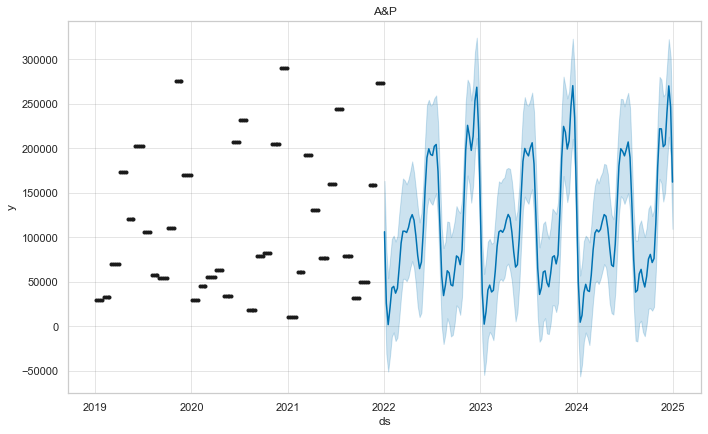

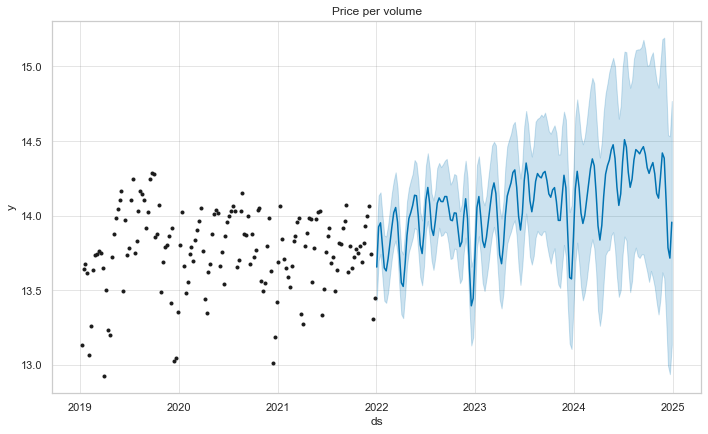

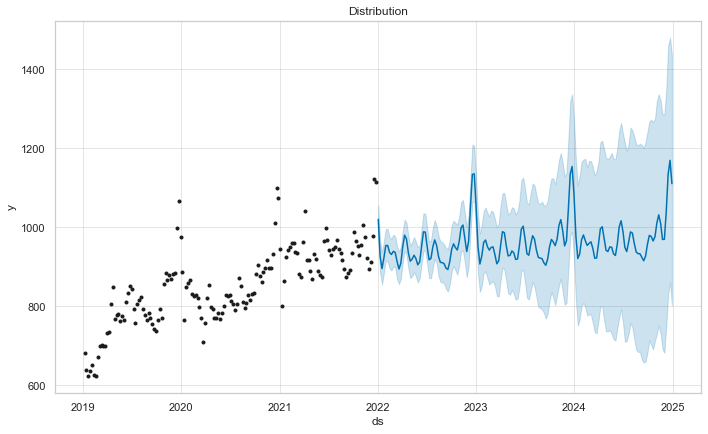

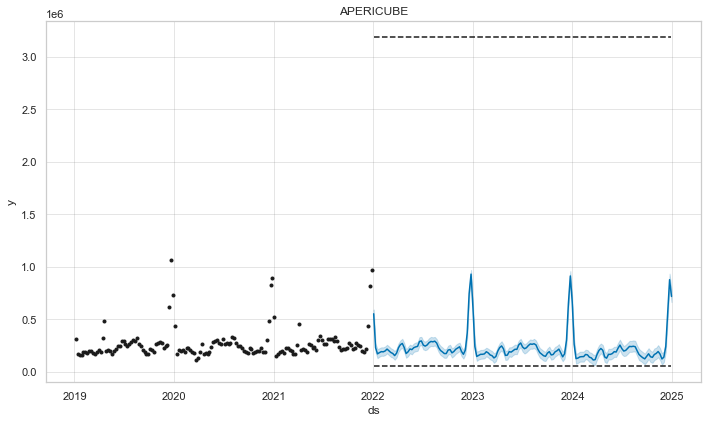

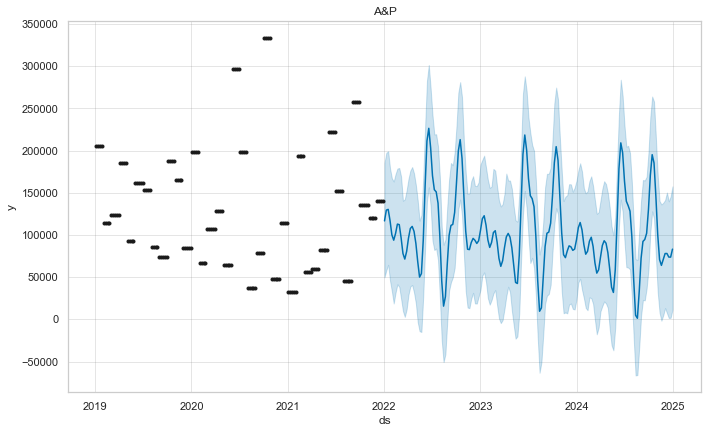

...

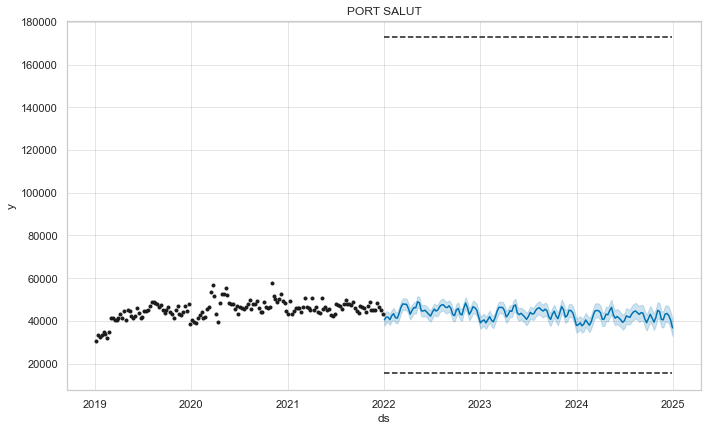

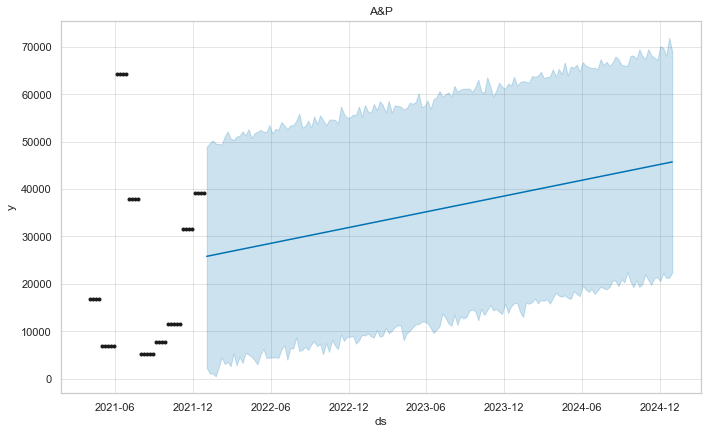

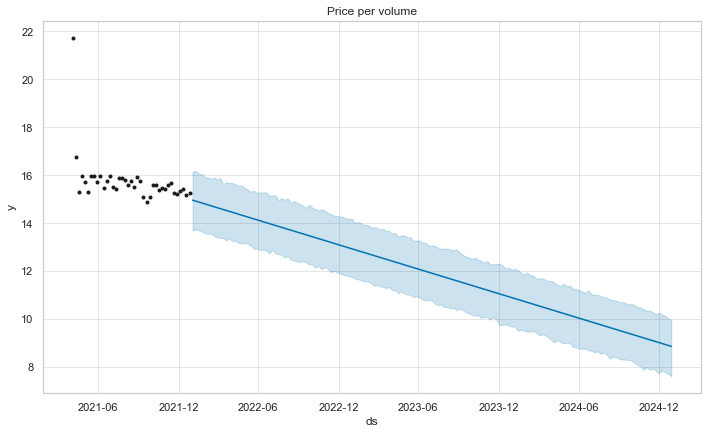

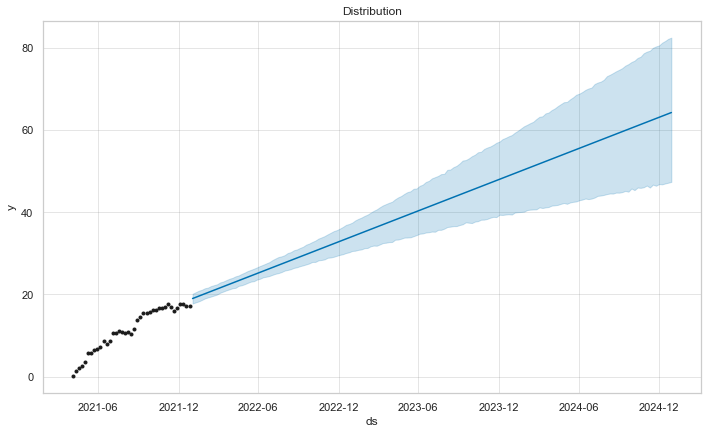

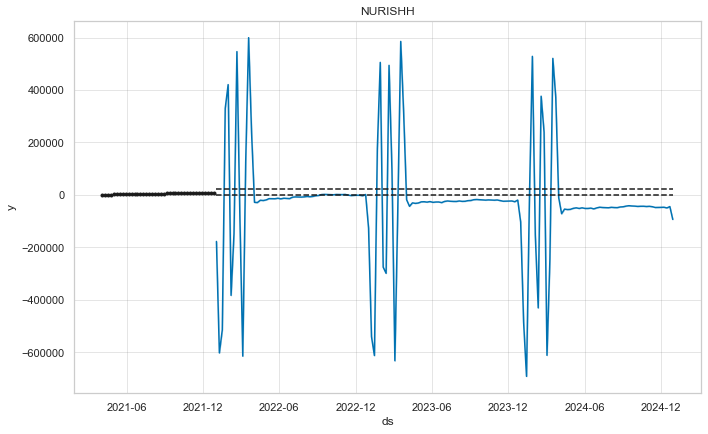

In [99]:
features_name = ['A&P', 'Price per volume', 'Distribution']
feats_futures, df_brands_fcst_res = forecasting_brands(df_bel, brands_name[country], features_name, periods=157, freq='W')

In [100]:
df_brands_fcst_res

,Date,APERICUBE,BABYBEL,BOURSIN,COUSTERON,KIRI,LA VACHE QUI RIT,PORT SALUT,NURISHH
0,2019-01-06,317063.709040,31992.483765,207758.221914,45179.037323,262535.235110,442844.844969,30668.396486,NaN
1,2019-01-13,174449.843237,33491.827850,163368.285736,47969.232664,321561.565615,502952.464256,33339.981047,NaN
2,2019-01-20,164711.825455,31584.829494,153203.820587,44734.434229,365251.136687,929845.271817,32469.477599,NaN
3,2019-01-27,165458.787968,32156.818602,158320.904898,46480.115556,280757.979905,618859.504353,33135.705606,NaN
4,2019-02-03,189310.973142,33366.944630,163540.468899,49107.726452,244565.342242,537446.522657,34566.752297,NaN
...,...,...,...,...,...,...,...,...,...
308,2024-12-01,141176.451276,31147.273968,302305.324210,39550.623765,265487.459689,279324.065561,43146.517693,-47815.656707
309,2024-12-08,241947.023351,31292.507654,333833.667336,50610.838180,270621.827964,288414.022657,43447.673091,-47376.177331
310,2024-12-15,555931.594063,31239.366954,405520.574828,49169.219149,241235.244232,269761.236608,42497.611964,-50098.409557
311,2024-12-22,878531.641933,28809.211866,480057.889537,39363.984811,205389.224370,173921.650997,40326.721836,-44879.853904


In [70]:
df_brands_fcst_res.fillna(0, inplace=True)
df_brands_fcst_res['Date'] = df_brands_fcst_res.Date.apply(lambda x: x.strftime('%Y-%m-%d'))
df_brands_fcst_res.round(1).to_excel("results/FR/Ecommerce/fr_ecom_brands_forecasts_with_regressors.xlsx", index=False)

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
      dtype=object)

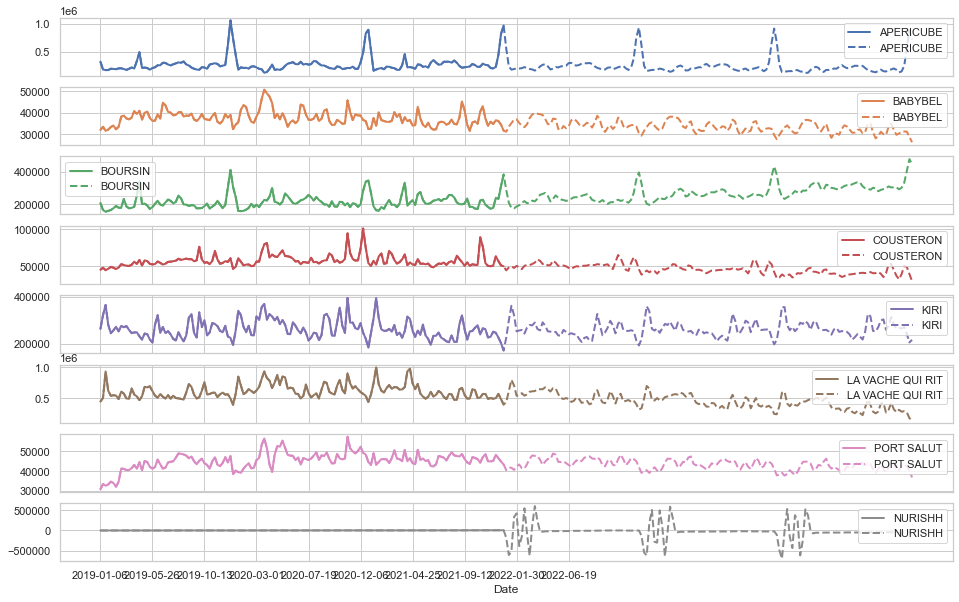

In [13]:
ax = df_brands_fcst_res.set_index("Date").loc['2017-12-31':'2021-12-26'].plot(linewidth=2, subplots=True, figsize=(16, 10))
df_brands_fcst_res.set_index("Date").plot(linewidth=2, linestyle='--', subplots=True, figsize=(16, 10), ax=ax)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

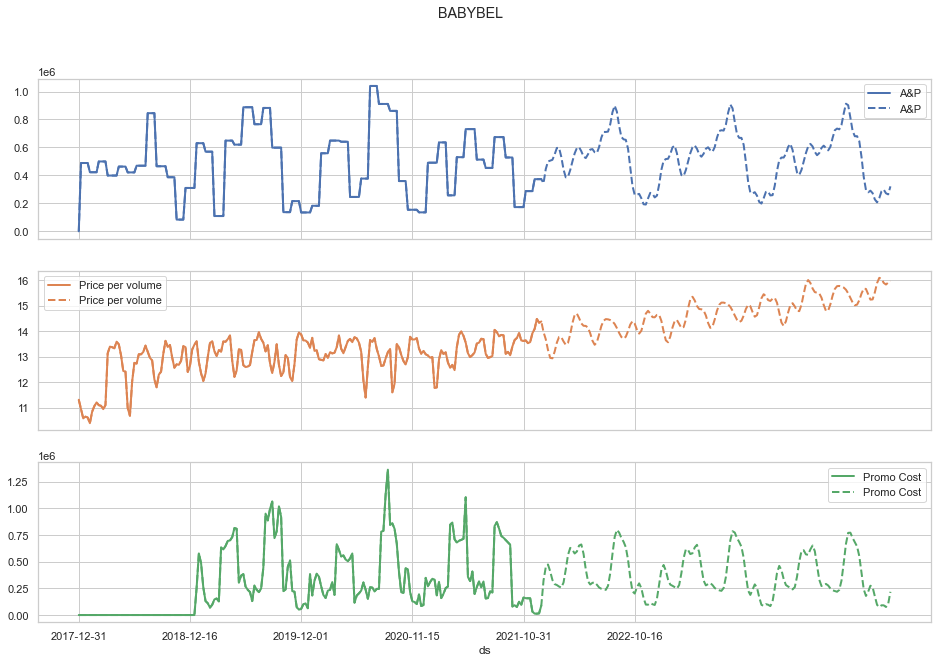

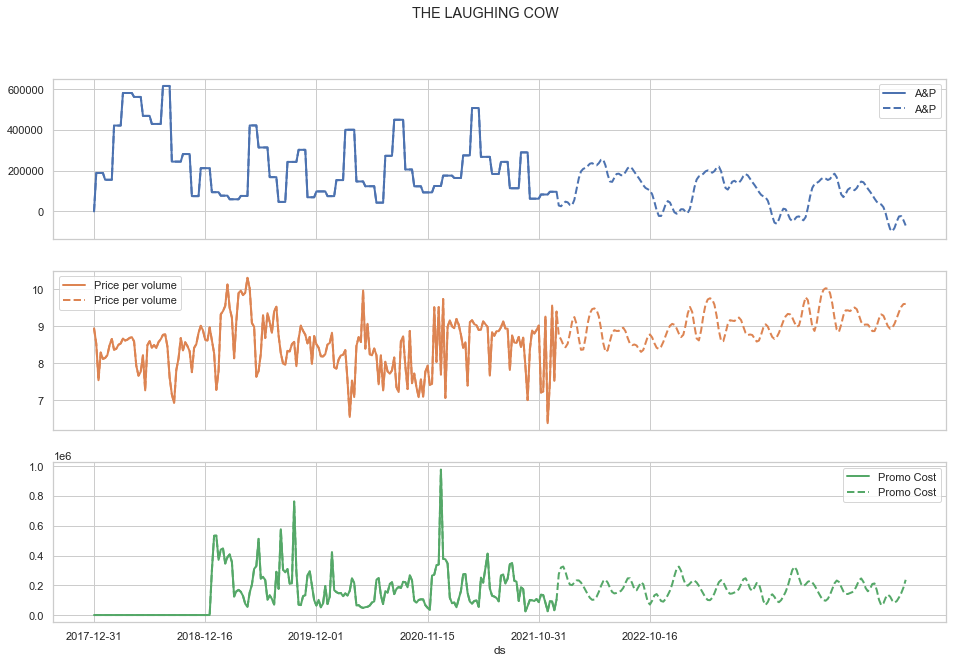

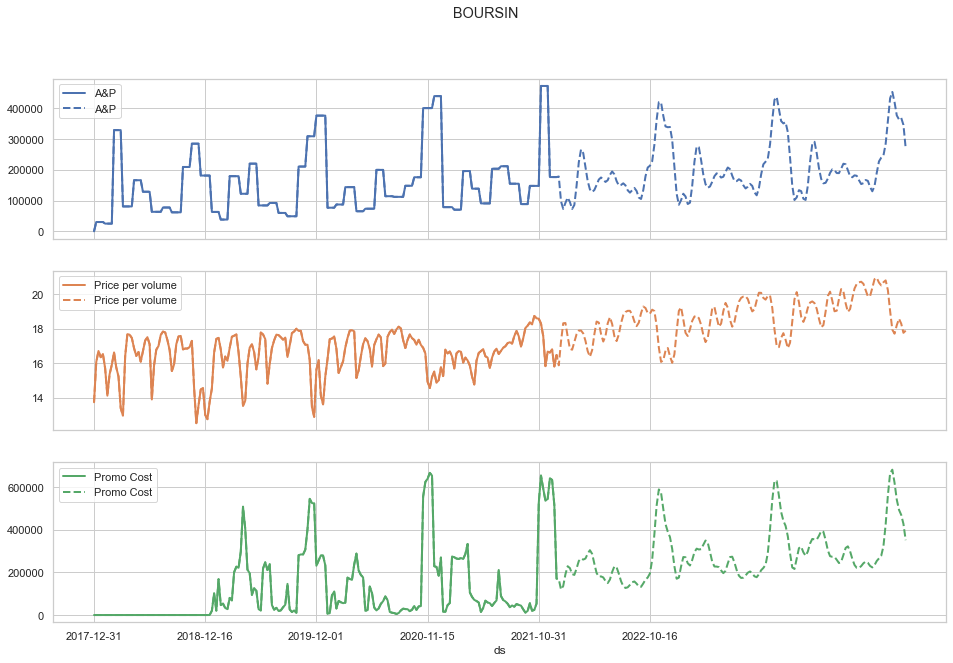

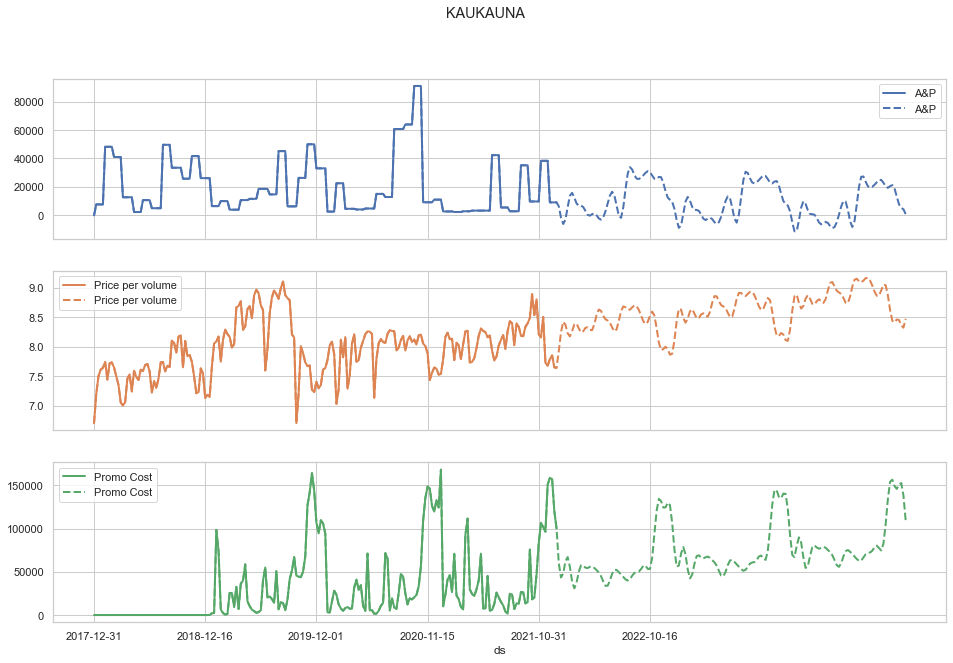

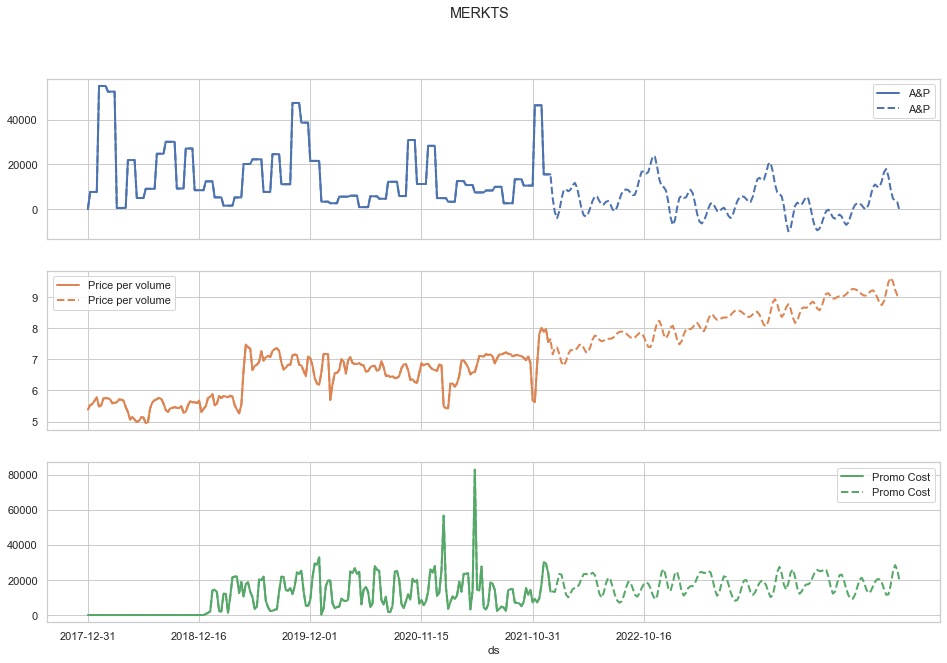

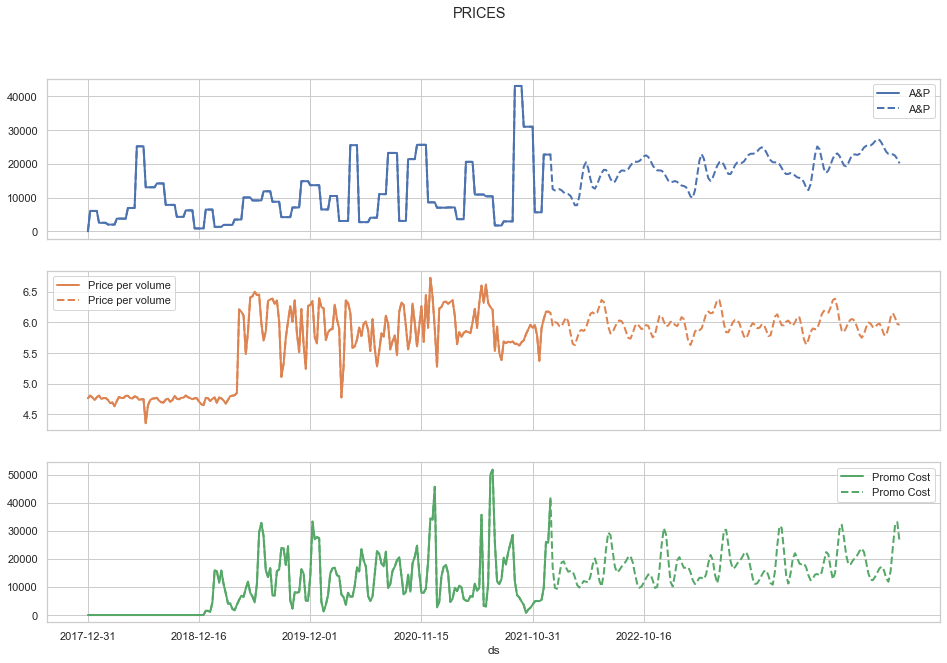

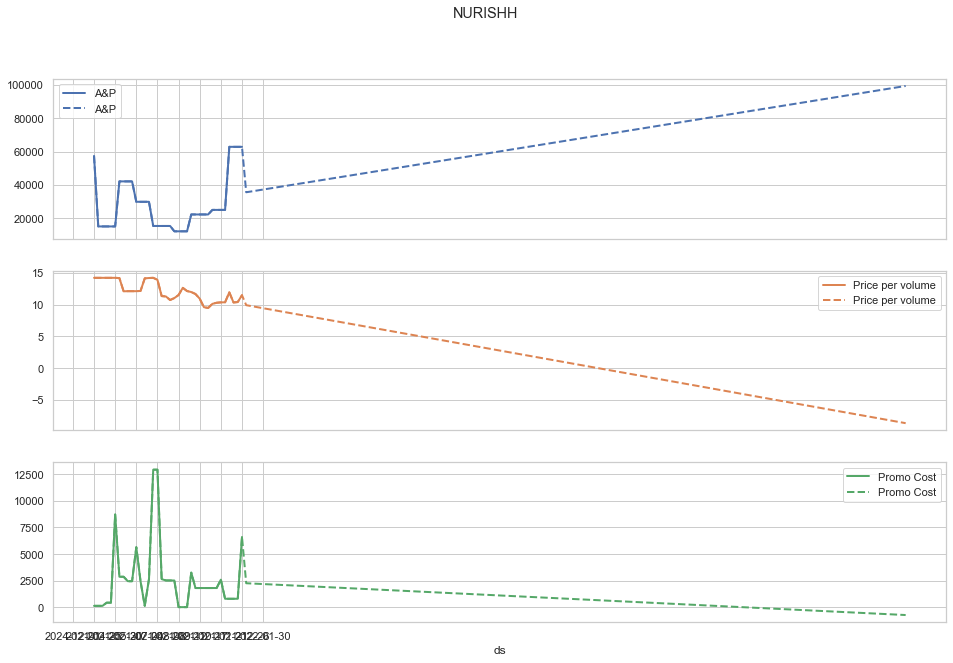

In [123]:
for brand in feats_futures:
    ax = feats_futures[brand].set_index('ds').loc['2017-12-31':'2021-12-26'].plot(subplots=True, figsize=(16, 10), title=brand, linewidth=2);
    feats_futures[brand].set_index('ds').plot(
        subplots=True, figsize=(16, 10), title=brand, 
        linestyle='--', linewidth=2, ax=ax);

### Forecasting Markets

In [71]:
features_markets = list(df_ecom.Category.unique()) + ['TOTAL CHEESE']
df_markets = get_df_markets(df_ecom)
df_markets.head()

,Date,A GOUT,A TARTINER,ALTERNATIVE VEGETALE,AOR REGIONAL,APERITIF,ARO,BLOC,BREBIS,CHEVRE,...,INGREDIENT A CHAUD,NATURE,NOMADE,ORIGINAL,PATE PERSILLEE,PLAT CHAUD,RAPE,SALADE,SPECIALITE A GOUT DOUX,TOTAL CHEESE
0,2019-01-06,12983.640,28010.819,8.700,25014.895,7218.005,15498.755,76220.619,8860.027,46423.3135,...,29239.375,23772.680,16044.820,8345.910,15112.3195,84501.302,201320.205,31357.638,35353.729,750833.4370
1,2019-01-13,14713.780,30633.404,10.700,31618.544,5016.253,17186.809,90801.723,10641.506,53778.6855,...,32278.350,25334.970,18916.331,9676.995,18003.7230,93384.024,221592.800,33229.649,40293.365,850807.9715
2,2019-01-20,14682.715,52073.530,14.725,36045.685,5125.300,21075.998,102051.796,10547.004,59125.0850,...,30246.975,32084.005,20059.025,9386.185,20140.5453,103926.057,223769.705,32440.745,55091.770,943955.5653
3,2019-01-27,17367.370,34232.944,9.600,34912.022,5920.790,17119.261,96379.333,13090.348,56708.3570,...,39555.155,28690.005,18269.900,10357.845,18618.8550,96781.537,222564.010,32487.997,48941.755,899836.6740
4,2019-02-03,17162.620,30499.153,13.980,34375.598,6760.856,18166.766,108654.836,12901.834,60255.1895,...,43124.885,28166.750,24053.566,11294.020,22149.9200,98637.249,249003.920,35817.517,45228.975,958815.9795


Features:   0%|          | 0/21 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value inste

Initial log joint probability = -11.2535
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      61        190.74    0.00269261       83.3392   3.171e-05       0.001      119  LS failed, Hessian reset 
      99       190.874   4.57685e-07       77.9568      0.6047      0.6047      171   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     120       190.874   9.00293e-09       83.4081     0.08228     0.08228      198   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -12.8015
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      48       246.654    0.00318977       75.7526   3.581e-05       0.001      102  LS failed, Hessian reset 
      99       246.801   3.31777e-07       81.2235      0.5702      0.5702      173   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       246.801   7.46355e-09       81.3496      0.2805      0.2805      200   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -6.8939
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       331.596   3.49612e-05       106.072      0.4477      0.4477      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       331.604   1.32065e-05       106.183   1.597e-07       0.001      200  LS failed, Hessian reset 
     178       331.605   5.31403e-09       113.966    0.006441           1      263   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -4.69749
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      54       251.321    0.00094091       60.3592   1.293e-05       0.001      116  LS failed, Hessian reset 
      99        251.37   9.80292e-06       73.3652      0.5417      0.5417      182   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     105       251.528   0.000913584        68.557   1.182e-05       0.001      230  LS failed, Hessian reset 
     199       251.621   1.73469e-05       58.2897      0.3284      0.3284      367   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     235       251.891   7.59047e-05       64.3175   1.309e-06       0.001      452  LS failed, Hessian reset 
     274       251.898   2.10832e-05       55.9535   3.563e-07       0.001      537  LS failed, Hessian reset 
     284       251.899   2.08724e-06       53.4677    2.67e-08   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -7.05181
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      54       247.834   0.000325766       71.0144   4.713e-06       0.001      109  LS failed, Hessian reset 
      99       247.863   0.000241548       75.3175           1           1      166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     137       247.962   0.000302396        62.181   5.015e-06       0.001      286  LS failed, Hessian reset 
     199       248.045   1.45128e-06       74.6501      0.2085      0.2085      379   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     221       248.045   1.76204e-08       58.2358     0.08327           1      410   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -23.9036
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      59       216.974   9.01929e-05       75.5784    1.02e-06       0.001      130  LS failed, Hessian reset 
      78       220.255   0.000126163       58.1525   6.747e-07       0.001      201  LS failed, Hessian reset 
      99        220.92    0.00180788       118.763           1           1      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     160       222.116   0.000179253       117.791   2.916e-06       0.001      375  LS failed, Hessian reset 
     194       222.141   9.49206e-05       50.6014   8.006e-07       0.001      455  LS failed, Hessian reset 
     199       222.145   4.26028e-05       64.6645      0.7779      0.5501      464   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     255        222.53   0.000122627       97.6842   1.011e-06   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -16.103
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       209.043   5.27458e-05       80.1635           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       209.163   0.000950359       74.0829   1.118e-05       0.001      205  LS failed, Hessian reset 
     159       209.223   5.07375e-05        75.275   7.756e-07       0.001      283  LS failed, Hessian reset 
     199       209.227   8.13778e-07       76.3257   1.038e-08       0.001      371  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     216       209.227   1.14835e-08       77.5448      0.2186           1      395   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -102.92
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       152.638    0.00541605        113.39      0.6139      0.6139      150   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     162       153.852   3.72613e-05       87.9506   1.777e-07       0.001      289  LS failed, Hessian reset 
     199        154.05   1.73861e-05       87.4904       0.391       0.988      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     211       154.148   4.07838e-05       132.188   3.497e-07       0.001      410  LS failed, Hessian reset 
     299       154.448     0.0017625       160.241         4.1        0.41      523   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     307       154.574   5.63764e-05       177.273   4.355e-07       0.001      595  LS failed, Hessian reset

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -18.4102
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      92       227.494    0.00103248       76.0545   1.097e-05       0.001      178  LS failed, Hessian reset 
      99       227.603   0.000347335       77.0736           1           1      188   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     154       227.632   2.82631e-05       91.6229   3.473e-07       0.001      303  LS failed, Hessian reset 
     199       227.634   1.21995e-08       86.5509      0.1643      0.1643      369   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       227.634   2.00514e-07       75.6298   1.974e-09       0.001      433  LS failed, Hessian reset 
     225       227.634   6.26442e-09        68.332      0.2789      0.2789      441   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -192.611
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      63       93.3737    1.3046e-05       102.394   1.009e-07       0.001      137  LS failed, Hessian reset 
      99       99.9187    0.00198531       164.524           1           1      197   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       101.275   0.000623243       150.219       0.257           1      338   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     225       101.682   1.19995e-05       83.4175   8.014e-08       0.001      415  LS failed, Hessian reset 
     299       102.084    0.00882042        292.55       1.685      0.1843      530   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     300       102.087   1.96679e-05       89.5739   6.723e-08       0.001      574  LS failed, Hessian rese

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -13.2729
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      53       284.064   9.65289e-05       78.7132   1.287e-06       0.001      117  LS failed, Hessian reset 
      87       284.074   1.96784e-05       75.5007   2.638e-07       0.001      207  LS failed, Hessian reset 
      99       284.075   8.80517e-07       71.7429      0.2636      0.8208      221   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113       284.075   7.00051e-09       75.3181      0.3496      0.3496      244   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -9.37824
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      38       228.606    0.00127816       85.0276   1.479e-05       0.001       88  LS failed, Hessian reset 
      91       228.781    0.00010527       73.6087   1.264e-06       0.001      196  LS failed, Hessian reset 
      99       228.786   2.50148e-05       82.7057           1           1      206   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     119       228.788   3.19476e-06       85.7522   4.153e-08       0.001      270  LS failed, Hessian reset 
     137       228.788    3.9868e-09       76.3683      0.1503      0.1503      294   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -8.6707
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      39       216.471    0.00317586       50.2011   4.104e-05       0.001       83  LS failed, Hessian reset 
      99       216.617   2.13603e-07       62.3643           1           1      171   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       216.618   1.37558e-05       51.9525   1.588e-07       0.001      219  LS failed, Hessian reset 
     131       216.618   3.82119e-09       49.3959     0.06788      0.9542      258   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -8.48505
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      38       243.655    0.00044898       78.0788    5.37e-06       0.001       89  LS failed, Hessian reset 
      99       243.944   0.000602488        81.469   7.413e-06       0.001      193  LS failed, Hessian reset 
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     138       243.979   1.27131e-05         71.15    1.41e-07       0.001      282  LS failed, Hessian reset 
     172       243.979   3.44833e-07       79.1735   3.637e-09       0.001      367  LS failed, Hessian reset 
     178       243.979    2.5105e-09       80.7889     0.01903      0.2757      376   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -8.53624
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      36       212.084   0.000741726       75.6468   9.094e-06       0.001       92  LS failed, Hessian reset 
      82       212.117   1.22415e-05       78.0661   1.382e-07       0.001      196  LS failed, Hessian reset 
      99       212.118    3.3219e-07       68.3618      0.7065      0.7065      215   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     118       212.118   2.83778e-09       84.7905      0.3321      0.3321      240   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -12.9074
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      76       206.218   2.51492e-05       83.8927   3.247e-07       0.001      147  LS failed, Hessian reset 
      99       206.221   4.05697e-07       83.1959      0.6692      0.6692      175   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       206.221   3.32117e-07       69.1462   3.739e-09       0.001      250  LS failed, Hessian reset 
     134       206.221   7.94299e-09       69.8274      0.3883      0.3883      260   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -9.16066
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      45       229.776   0.000466812       91.1373   5.686e-06       0.001       99  LS failed, Hessian reset 
      87       229.849   0.000329902       81.7796   4.285e-06       0.001      193  LS failed, Hessian reset 
      99       229.864   1.60521e-05       67.7435      0.2878           1      209   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       229.866   5.61962e-06        80.527   6.899e-08       0.001      282  LS failed, Hessian reset 
     199       230.004   0.000445975       83.8275           1           1      376   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       230.094   6.63859e-06       78.3044      0.1396      0.3904      494   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -9.8678
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      71       224.078   0.000606708       80.5225   6.811e-06       0.001      130  LS failed, Hessian reset 
      99       224.096   8.69139e-06       74.2181      0.1145           1      169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     142       224.097   2.22755e-07       85.4392   3.398e-09       0.001      274  LS failed, Hessian reset 
     152       224.097   8.83265e-09       76.7479      0.6677      0.6677      284   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -13.456
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       205.076   2.48843e-06       71.8076      0.2142      0.9086      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       205.313    0.00229715       77.6736   2.893e-05       0.001      200  LS failed, Hessian reset 
     163       205.516   5.44676e-06       85.2791   6.498e-08       0.001      312  LS failed, Hessian reset 
     188       205.517   4.97035e-09       86.5617      0.3192      0.3192      346   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -5.47474
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       293.337   6.67969e-05       91.7008      0.3492      0.3492      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113        293.82     0.0059283       148.132   4.564e-05       0.001      197  LS failed, Hessian reset 
     139        294.42   0.000454388       102.449    4.48e-06       0.001      271  LS failed, Hessian reset 
     199       294.564   1.55254e-07       94.3968      0.6239      0.6239      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     213       294.564   8.82005e-09       95.8891       0.822       0.822      365   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -10.0324
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      61       221.832   0.000931114       86.1001   1.182e-05       0.001      123  LS failed, Hessian reset 
      99        221.89    1.0753e-05       78.2673           1           1      173   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       222.189   9.83084e-06       59.4933      0.1855      0.4907      308   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     243       222.192    2.3568e-06       77.2037   3.616e-08       0.001      401  LS failed, Hessian reset 
     284       222.192   9.22684e-09       72.9184      0.8702      0.8702      456   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/prophet/plot.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


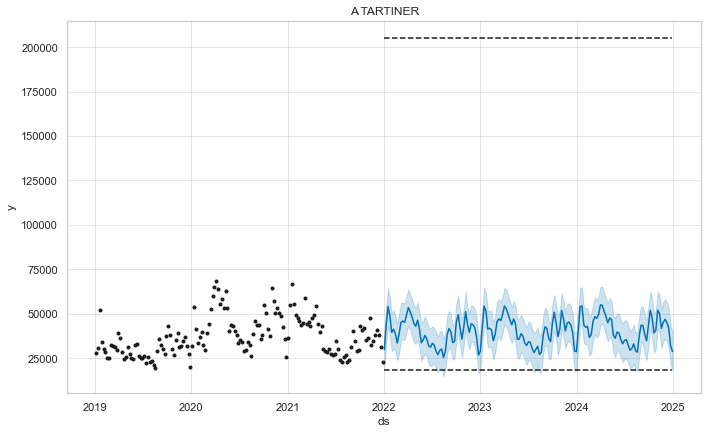

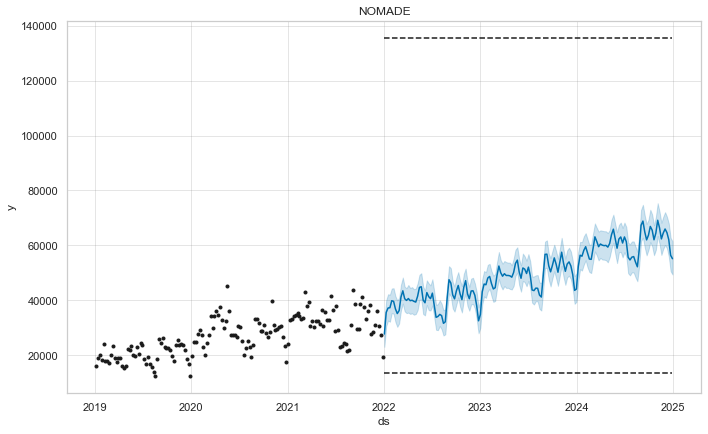

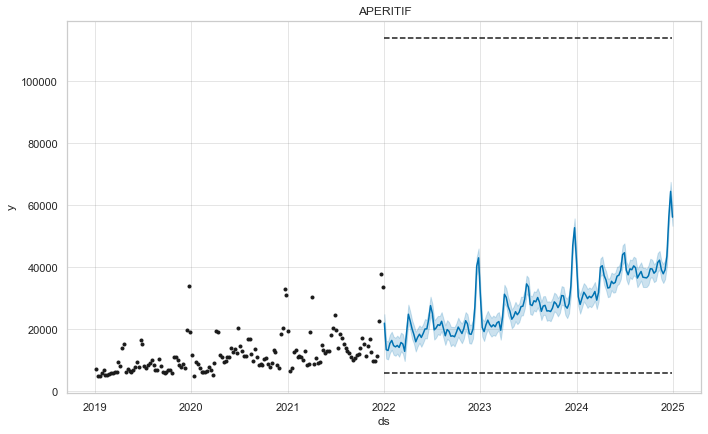

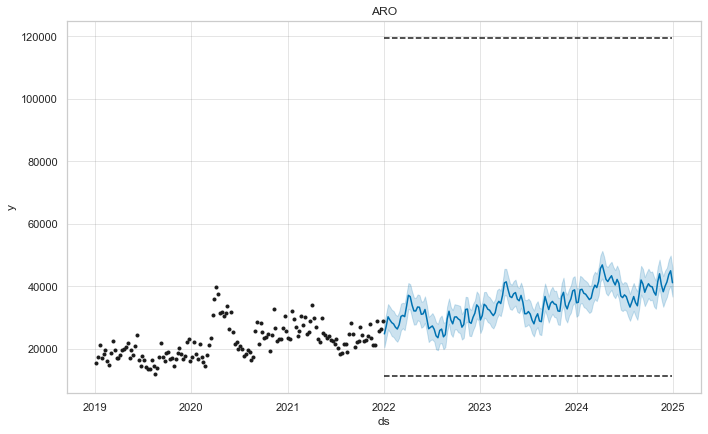

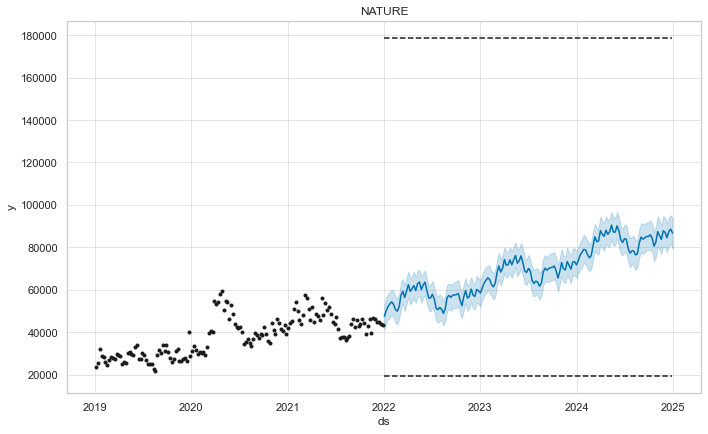

...

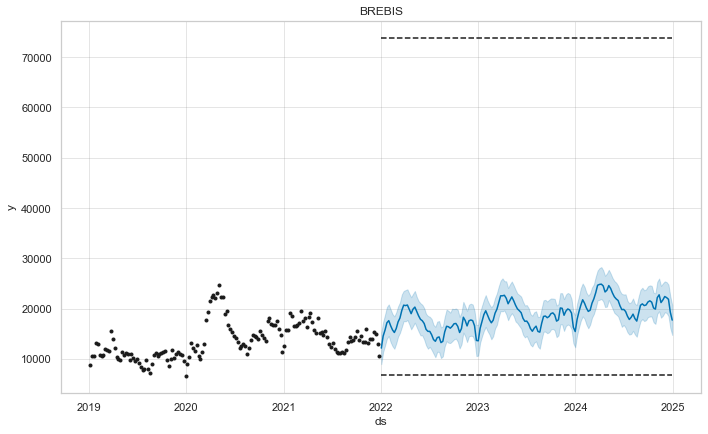

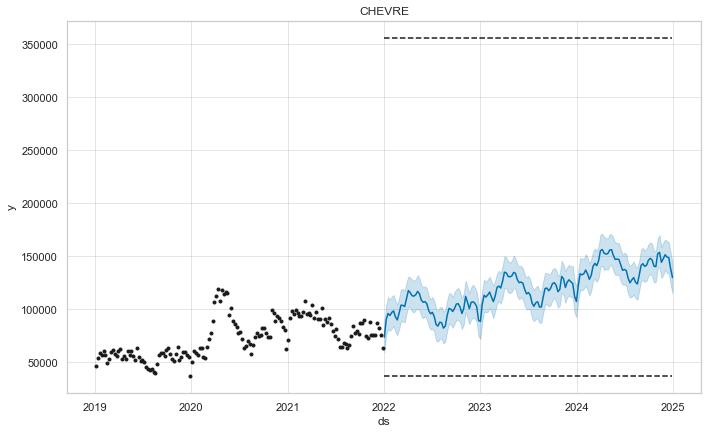

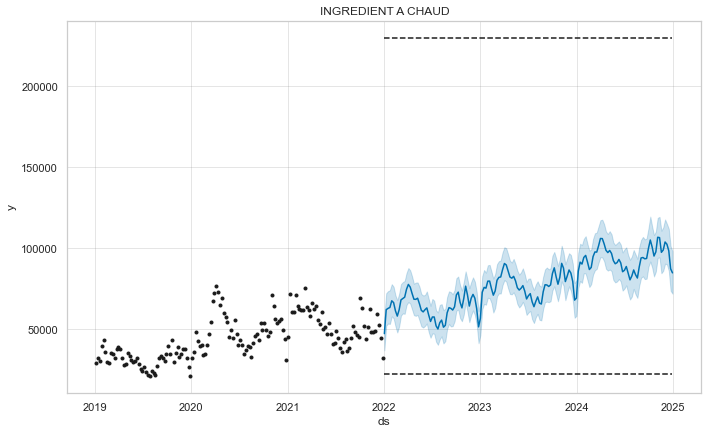

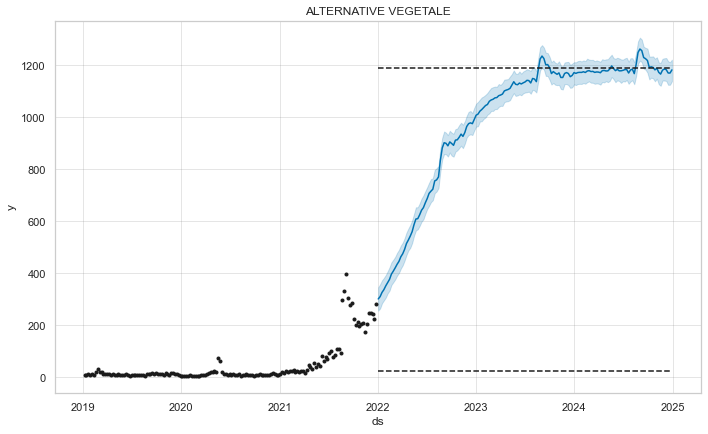

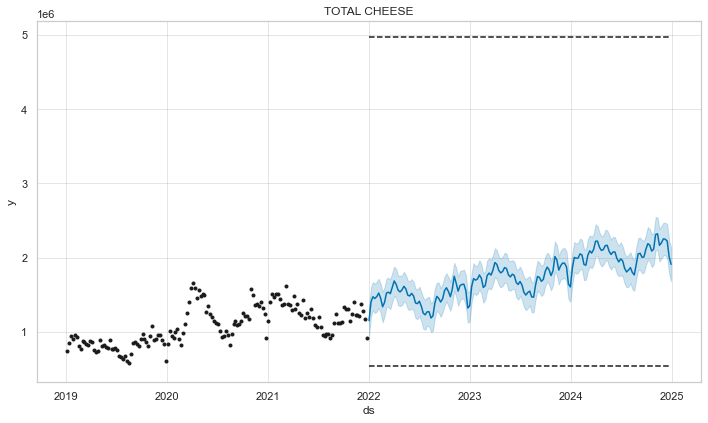

In [72]:
df_markets_fcst_res = forecasting_markets(df_markets, features_markets, periods=157, freq='W')

In [73]:
df_markets_fcst_res.tail()

,Date,A TARTINER,NOMADE,APERITIF,ARO,NATURE,RAPE,CHEVRE&BREBIS,A GOUT,ORIGINAL,...,BLOC,PATE PERSILLEE,CLASSIQUE,AOR REGIONAL,SPECIALITE A GOUT DOUX,BREBIS,CHEVRE,INGREDIENT A CHAUD,ALTERNATIVE VEGETALE,TOTAL CHEESE
308,2024-12-01,47004.637979,65974.506207,39235.831117,40015.316553,87135.168811,530854.506125,1058.292957,42925.312536,45007.364668,...,184311.062097,53515.654233,222370.460888,113957.862919,106799.946440,22405.427139,151401.159284,103850.019855,1185.226951,2.253359e+06
309,2024-12-08,45066.260478,64663.862696,43676.885774,41368.468099,84491.694342,531496.215729,1038.949433,43500.760735,45157.640816,...,182641.758816,54243.533936,220715.085351,109862.240914,107630.937254,22186.426856,149314.963544,102472.585808,1182.598248,2.248554e+06
310,2024-12-15,41952.644393,62074.045792,56010.477342,43701.355008,87443.849141,519214.951743,998.967552,41912.154359,43459.129426,...,181383.799739,55353.145171,215567.718272,110011.089536,104069.944885,21858.408526,148648.472322,98444.164915,1169.894520,2.223920e+06
311,2024-12-22,31963.621012,56401.270068,64537.551400,44954.085596,88596.600482,451544.654199,867.778673,35226.306483,39524.119747,...,163137.516669,51312.522203,189506.664338,104829.682752,93165.118182,19274.554732,138231.001523,87316.203869,1169.605969,2.011021e+06
312,2024-12-29,28888.844167,55162.347794,56229.258929,41124.277885,86827.544099,434055.961376,800.420556,35852.715734,38815.605028,...,147040.396488,47280.148854,171397.468699,99484.037531,86294.446473,17715.916559,129984.587899,84797.890189,1181.887667,1.910461e+06


In [219]:
#df_markets_fcst_res.assign(Year=pd.to_datetime(df_markets_fcst_res.Date).dt.year).groupby('Year').sum().T.to_clipboard()

In [76]:
#df_markets_fcst_res['Date'] = df_markets_fcst_res.Date.apply(lambda x: x.strftime('%Y-%m-%d'))
df_markets_fcst_res.round(1).to_excel("./results/FR/Ecommerce/fr_ecom_markets_forecasts.xlsx", index=False)

### Growth Drivers Past

In [77]:
df_bel_ecom.head()

,Date,Brand,Price per volume,Sales in volume,Sales in value,Distribution,Sell-in,Advertising,Promotion,A&P,MVC,Rate of Innovation,Trends
0,2019-01-06,APERICUBE,13.131324,317063.709040,4.270993e+06,681.779410,1.081436e+06,44.38528,74.99087,29844.0375,627333.873400,0.0,1
1,2019-01-06,BABYBEL,8.278697,31992.483765,2.686242e+05,70.038097,1.508784e+06,683.15914,137.30146,205115.1500,806691.118450,0.0,6
2,2019-01-06,BOURSIN,18.001748,207758.221914,2.881462e+06,192.582568,9.410844e+05,33.81879,133.43824,41814.2575,414141.127425,0.0,32
3,2019-01-06,COUSTERON,7.988248,45179.037323,3.654272e+05,120.191609,1.393531e+05,0.00000,11.92763,2981.9075,24573.224600,0.0,0
4,2019-01-06,KIRI,9.245133,262535.235110,2.394732e+06,171.488026,1.419914e+06,43.41143,123.65016,41765.3975,700810.716475,0.0,27


In [83]:
# Use this with controllable_features param to False
#bel_features = ['Date', 'Brand', 'A&P', 'Price per volume', 'Rate of Innovation', 'Distribution', 'Trends', 'Sales in volume']
# Use this with controllable_features param to True
bel_features = ['Date', 'Brand', 'A&P', 'Price per volume', 'Distribution', 'Sales in volume']
dict_res = compute_growth_drivers_past(
    df_ecom, df_bel_ecom[bel_features], brands_name[country], features, 
    years=[2019, 2020, 2021], controllable_features=True)

Years:   0%|          | 0/3 [00:00<?, ?it/s]

Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


In [84]:
for year in dict_res:
    pd.DataFrame(dict_res[year]['xgb_feature_importance']).round(1).to_excel("results/FR/Ecommerce/fr_ecom_growth_drivers_past_{}_controllable_features.xlsx".format(year))

### Growth Drivers Future

In [86]:
df_futures = pd.DataFrame()
for brand in feats_futures:
    feats_futures[brand]['ds'] = feats_futures[brand]['ds'].apply(lambda x: x.strftime("%Y-%m-%d"))
    df_tmp = pd.merge(feats_futures[brand].rename(columns={'ds':'Date'}), 
                     df_brands_fcst_res[['Date', brand]], on='Date').rename(
        columns={brand: 'Sales in volume'})
    df_tmp['Brand'] = brand
    df_futures = pd.concat([df_futures, df_tmp])

In [88]:
dict_res_future = compute_growth_drivers_past(
    df_ecom, df_futures[df_futures.Date > df_bel_ecom.Date.iloc[-1]][bel_features], brands_name[country], features, 
    years=[2022, 2023, 2024], controllable_features=True)

Years:   0%|          | 0/3 [00:00<?, ?it/s]

Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


In [89]:
for year in dict_res_future:
    pd.DataFrame(dict_res_future[year]['xgb_feature_importance']).round(1).to_excel("results/FR/Total/fr_ecom_growth_drivers_future_{}_controllable_features.xlsx".format(year))